In [1]:
"""Evaluation"""
import matplotlib.pyplot as plt
from matplotlib.legend_handler import HandlerLine2D

from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import cv2
from datetime import datetime
import os.path
import sys
import time

import numpy as np
from six.moves import xrange
import tensorflow as tf

from config import *
from dataset import pascal_voc, kitti
from utils.util import bbox_transform, Timer
from nets import *

data_path = '/rscratch/ruta/squeezeDet/data/KITTI'
image_set = 'val'
eval_dir = '/rscratch/ruta/logs/squeezeDet/8.1/' + image_set
checkpoint_path = '/rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000'
eval_interval_secs = 60
run_once = True

In [2]:
def eval_once(
    saver, ckpt_path, summary_writer, eval_summary_ops, eval_summary_phs, imdb,
    model):
  with tf.Session(config=tf.ConfigProto(allow_soft_placement=True)) as sess:

    # Restores from checkpoint
    saver.restore(sess, ckpt_path)
    # Assuming model_checkpoint_path looks something like:
    #   /ckpt_dir/model.ckpt-0,
    # extract global_step from it.
    global_step = ckpt_path.split('/')[-1].split('-')[-1]

    num_images = len(imdb.image_idx)

    all_boxes = [[[] for _ in xrange(num_images)]
                 for _ in xrange(imdb.num_classes)]

    _t = {'im_detect': Timer(), 'im_read': Timer(), 'misc': Timer()}

    num_detection = 0.0
    for i in xrange(num_images):
      _t['im_read'].tic()
      images, scales = imdb.read_image_batch(shuffle=False)
      _t['im_read'].toc()

      _t['im_detect'].tic()
      det_boxes, det_probs, det_class = sess.run(
          [model.det_boxes, model.det_probs, model.det_class],
          feed_dict={model.image_input:images})
      _t['im_detect'].toc()

      _t['misc'].tic()
      for j in range(len(det_boxes)): # batch
        # rescale
        det_boxes[j, :, 0::2] /= scales[j][0]
        det_boxes[j, :, 1::2] /= scales[j][1]

        det_bbox, score, det_class = model.filter_prediction(
            det_boxes[j], det_probs[j], det_class[j])

        num_detection += len(det_bbox)
        for c, b, s in zip(det_class, det_bbox, score):
          all_boxes[c][i].append(bbox_transform(b) + [s])
      _t['misc'].toc()

      print ('im_detect: {:d}/{:d} im_read: {:.3f}s '
             'detect: {:.3f}s misc: {:.3f}s'.format(
                i+1, num_images, _t['im_read'].average_time,
                _t['im_detect'].average_time, _t['misc'].average_time))

    print ('Evaluating detections...')
    aps, ap_names = imdb.evaluate_detections(
        eval_dir, global_step, all_boxes)

    print ('Evaluation summary:')
    print ('  Average number of detections per image: {}:'.format(
      num_detection/num_images))
    print ('  Timing:')
    print ('    im_read: {:.3f}s detect: {:.3f}s misc: {:.3f}s'.format(
      _t['im_read'].average_time, _t['im_detect'].average_time,
      _t['misc'].average_time))
    print ('  Average precisions:')

    feed_dict = {}
    for cls, ap in zip(ap_names, aps):
      feed_dict[eval_summary_phs['APs/'+cls]] = ap
      print ('    {}: {:.3f}'.format(cls, ap))

    print ('    Mean average precision: {:.3f}'.format(np.mean(aps)))
    feed_dict[eval_summary_phs['APs/mAP']] = np.mean(aps)
    feed_dict[eval_summary_phs['timing/im_detect']] = \
        _t['im_detect'].average_time
    feed_dict[eval_summary_phs['timing/im_read']] = \
        _t['im_read'].average_time
    feed_dict[eval_summary_phs['timing/post_proc']] = \
        _t['misc'].average_time
    feed_dict[eval_summary_phs['num_det_per_image']] = \
        num_detection/num_images

    print ('Analyzing detections...')
    stats, ims = imdb.do_detection_analysis_in_eval(
        eval_dir, global_step)

    eval_summary_str = sess.run(eval_summary_ops, feed_dict=feed_dict)
    for sum_str in eval_summary_str:
      summary_writer.add_summary(sum_str, global_step)

In [3]:
def evaluate(t, quantize_func):
  """Evaluate."""

  with tf.Graph().as_default() as g:
    mc = kitti_squeezeDet_config()
    mc.BATCH_SIZE = 1 # TODO(bichen): allow batch size > 1
    mc.LOAD_PRETRAINED_MODEL = False
    model = SqueezeDet(mc, t, quantize_func)

    # TODO(ruta): fix this
    with tf.Session(config=tf.ConfigProto(allow_soft_placement=True, log_device_placement=True)) as sess:
      init = tf.global_variables_initializer()
      sess.run(init)
#       print(sess.run(model.tensor_min))
#       print(sess.run(model.tensor_max))
      i = 0
      for tens in sess.run(model.tensor):
        print(i, tens)
        i+=1
#       i = 0
#       for tens in sess.run(model.tensor_normalized):
#         print(i, tens)
#         i+=1
#       i = 0
#       for tens in sess.run(model.temp1):
#         print(i, tens)
#         i+=1
#       i = 0
#       for tens in sess.run(model.temp2):
#         print(i, tens)
#         i+=1
      i = 0
      for mpq in sess.run(model.tensor_quantized):
        print(i, mpq)
        i+=1
      print(sess.run(model.Wn_temp))
      print(sess.run(model.Wp_temp))
      numpy_tensor = sess.run(model.tensor)
      numpy_tensor_normalized = sess.run(model.tensor_normalized)
      numpy_tensor_quantized = sess.run(model.tensor_quantized)

    imdb = kitti(image_set, data_path, mc)

    # add summary ops and placeholders
    ap_names = []
    for cls in imdb.classes:
      ap_names.append(cls+'_easy')
      ap_names.append(cls+'_medium')
      ap_names.append(cls+'_hard')

    eval_summary_ops = []
    eval_summary_phs = {}
    for ap_name in ap_names:
      ph = tf.placeholder(tf.float32)
      eval_summary_phs['APs/'+ap_name] = ph
      eval_summary_ops.append(tf.summary.scalar('APs/'+ap_name, ph))

    ph = tf.placeholder(tf.float32)
    eval_summary_phs['APs/mAP'] = ph
    eval_summary_ops.append(tf.summary.scalar('APs/mAP', ph))

    ph = tf.placeholder(tf.float32)
    eval_summary_phs['timing/im_detect'] = ph
    eval_summary_ops.append(tf.summary.scalar('timing/im_detect', ph))

    ph = tf.placeholder(tf.float32)
    eval_summary_phs['timing/im_read'] = ph
    eval_summary_ops.append(tf.summary.scalar('timing/im_read', ph))

    ph = tf.placeholder(tf.float32)
    eval_summary_phs['timing/post_proc'] = ph
    eval_summary_ops.append(tf.summary.scalar('timing/post_proc', ph))

    ph = tf.placeholder(tf.float32)
    eval_summary_phs['num_det_per_image'] = ph
    eval_summary_ops.append(tf.summary.scalar('num_det_per_image', ph))

    saver = tf.train.Saver(model.model_params)

    summary_writer = tf.summary.FileWriter(eval_dir, g)
    
    ckpts = set() 

    # When run_once is true, checkpoint_path should point to the exact
    # checkpoint file.
    eval_once(saver, checkpoint_path, summary_writer, eval_summary_ops,
        eval_summary_phs, imdb, model)
    return imdb.correct_percent, numpy_tensor, numpy_tensor_normalized, numpy_tensor_quantized

In [4]:
def minmax(tensor, bias):
    return tf.reduce_min(tensor), tf.reduce_max(tensor)

def std1(tensor, bias):
  if bias:
    mu, var = tf.nn.moments(tensor, [0])
  else:
    mu, var = tf.nn.moments(tensor, [0,1,2,3])
  std = tf.sqrt(var)
  return mu - std, mu + std

def std2(tensor, bias):
  if bias:
    mu, var = tf.nn.moments(tensor, [0])
  else:
    mu, var = tf.nn.moments(tensor, [0,1,2,3])
  std = tf.sqrt(var)
  return mu - 2*std, mu + 2*std

In [5]:
def plot_histogram(tensor, title, xlabel, bins='auto'):
  flat_tensor = tensor.flatten()
  plt.hist(flat_tensor, bins)
  plt.title(title)
  plt.xlabel(xlabel)
  plt.ylabel('Count')
  plt.show()

def plot_percents(title, thresholds, correct_percents, full_precision):
  if full_precision:
    plt.axis([0, 1, 0, 0.6])
    plt.plot([0.579456500986, 0.579456500986], marker='None', linestyle='-',
             color='green', label='Full Precision')
  plt.plot(thresholds, correct_percents, marker='.', linestyle='--',
           color='blue', label='Quantized')
  plt.title(title)
  plt.xlabel('Values of Threshold')
  plt.ylabel('Correct Detection Percentage')
  plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
  plt.show()

In [6]:
_, numpy_tensor, numpy_tensor_normalized, numpy_tensor_quantized = evaluate(0.9, minmax)

INFO:tensorflow:Summary name mean iou is illegal; using mean_iou instead.
0 [[[ -1.79482522e-05   3.95321804e-05   9.93787689e-05 ...,   1.15316296e-04
     9.72130147e-05   2.53487997e-05]
  [ -1.14706207e-04  -9.92229161e-06   3.75516429e-05 ...,  -2.64931405e-05
    -1.18534954e-04   3.13884593e-05]
  [ -6.40608923e-05  -8.75926635e-05  -1.41366880e-04 ...,   1.30211411e-04
    -8.76594422e-05   1.29261854e-04]
  ..., 
  [  1.03481150e-04  -1.78414466e-05   6.76446507e-05 ...,  -3.06146430e-05
    -2.01477033e-05   6.22350781e-05]
  [ -1.93094093e-05   7.58738315e-05   1.40866730e-04 ...,  -1.23458827e-04
    -1.68854749e-04  -3.84505620e-05]
  [  4.13936577e-05  -9.71685004e-05  -7.60853291e-05 ...,  -1.65613426e-04
    -1.48441468e-04   1.01399921e-04]]

 [[  4.09115200e-05  -1.10472152e-04  -5.56082014e-05 ...,   1.30497501e-04
    -1.67972787e-04  -9.63090224e-06]
  [ -2.73660826e-05   1.75267356e-04  -8.02234863e-05 ...,   4.99777743e-05
     6.16663237e-05   5.18288107e-05]
  

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.354s detect: 0.220s misc: 0.010s
im_detect: 2/3741 im_read: 0.193s detect: 0.171s misc: 0.010s
im_detect: 3/3741 im_read: 0.139s detect: 0.154s misc: 0.010s
im_detect: 4/3741 im_read: 0.112s detect: 0.146s misc: 0.010s
im_detect: 5/3741 im_read: 0.096s detect: 0.142s misc: 0.010s
im_detect: 6/3741 im_read: 0.085s detect: 0.138s misc: 0.010s
im_detect: 7/3741 im_read: 0.078s detect: 0.136s misc: 0.010s
im_detect: 8/3741 im_read: 0.072s detect: 0.134s misc: 0.010s
im_detect: 9/3741 im_read: 0.068s detect: 0.132s misc: 0.010s
im_detect: 10/3741 im_read: 0.064s detect: 0.131s misc: 0.010s
im_detect: 11/3741 im_read: 0.061s detect: 0.130s misc: 0.010s
im_detect: 12/3741 im_read: 0.059s detect: 0.129s misc: 0.010s
im_detect: 13/3741 im_read: 0.056s detect: 0.128s misc: 0.010s
im_detect: 14/3741 im_read: 0.055s detect: 0.127s misc: 0.010s
im_detect: 15/3741 im_read: 

im_detect: 130/3741 im_read: 0.036s detect: 0.118s misc: 0.010s
im_detect: 131/3741 im_read: 0.036s detect: 0.118s misc: 0.010s
im_detect: 132/3741 im_read: 0.036s detect: 0.118s misc: 0.010s
im_detect: 133/3741 im_read: 0.036s detect: 0.118s misc: 0.010s
im_detect: 134/3741 im_read: 0.036s detect: 0.118s misc: 0.010s
im_detect: 135/3741 im_read: 0.036s detect: 0.118s misc: 0.010s
im_detect: 136/3741 im_read: 0.036s detect: 0.118s misc: 0.010s
im_detect: 137/3741 im_read: 0.036s detect: 0.118s misc: 0.010s
im_detect: 138/3741 im_read: 0.036s detect: 0.118s misc: 0.010s
im_detect: 139/3741 im_read: 0.036s detect: 0.118s misc: 0.010s
im_detect: 140/3741 im_read: 0.036s detect: 0.118s misc: 0.010s
im_detect: 141/3741 im_read: 0.036s detect: 0.118s misc: 0.010s
im_detect: 142/3741 im_read: 0.036s detect: 0.118s misc: 0.010s
im_detect: 143/3741 im_read: 0.035s detect: 0.118s misc: 0.010s
im_detect: 144/3741 im_read: 0.035s detect: 0.118s misc: 0.010s
im_detect: 145/3741 im_read: 0.035s dete

im_detect: 260/3741 im_read: 0.034s detect: 0.118s misc: 0.010s
im_detect: 261/3741 im_read: 0.034s detect: 0.118s misc: 0.010s
im_detect: 262/3741 im_read: 0.034s detect: 0.118s misc: 0.010s
im_detect: 263/3741 im_read: 0.034s detect: 0.118s misc: 0.010s
im_detect: 264/3741 im_read: 0.034s detect: 0.118s misc: 0.010s
im_detect: 265/3741 im_read: 0.034s detect: 0.118s misc: 0.010s
im_detect: 266/3741 im_read: 0.034s detect: 0.118s misc: 0.010s
im_detect: 267/3741 im_read: 0.034s detect: 0.117s misc: 0.010s
im_detect: 268/3741 im_read: 0.034s detect: 0.117s misc: 0.010s
im_detect: 269/3741 im_read: 0.034s detect: 0.118s misc: 0.010s
im_detect: 270/3741 im_read: 0.034s detect: 0.118s misc: 0.010s
im_detect: 271/3741 im_read: 0.034s detect: 0.118s misc: 0.010s
im_detect: 272/3741 im_read: 0.034s detect: 0.118s misc: 0.010s
im_detect: 273/3741 im_read: 0.034s detect: 0.118s misc: 0.010s
im_detect: 274/3741 im_read: 0.034s detect: 0.118s misc: 0.010s
im_detect: 275/3741 im_read: 0.034s dete

im_detect: 389/3741 im_read: 0.034s detect: 0.117s misc: 0.010s
im_detect: 390/3741 im_read: 0.034s detect: 0.117s misc: 0.010s
im_detect: 391/3741 im_read: 0.034s detect: 0.117s misc: 0.010s
im_detect: 392/3741 im_read: 0.034s detect: 0.117s misc: 0.010s
im_detect: 393/3741 im_read: 0.034s detect: 0.117s misc: 0.010s
im_detect: 394/3741 im_read: 0.034s detect: 0.117s misc: 0.010s
im_detect: 395/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 396/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 397/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 398/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 399/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 400/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 401/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 402/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 403/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 404/3741 im_read: 0.033s dete

im_detect: 519/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 520/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 521/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 522/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 523/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 524/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 525/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 526/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 527/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 528/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 529/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 530/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 531/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 532/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 533/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 534/3741 im_read: 0.033s dete

im_detect: 649/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 650/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 651/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 652/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 653/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 654/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 655/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 656/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 657/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 658/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 659/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 660/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 661/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 662/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 663/3741 im_read: 0.033s detect: 0.117s misc: 0.010s
im_detect: 664/3741 im_read: 0.033s dete

im_detect: 779/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 780/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 781/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 782/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 783/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 784/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 785/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 786/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 787/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 788/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 789/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 790/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 791/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 792/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 793/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 794/3741 im_read: 0.033s dete

im_detect: 909/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 910/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 911/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 912/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 913/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 914/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 915/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 916/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 917/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 918/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 919/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 920/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 921/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 922/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 923/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 924/3741 im_read: 0.033s dete

im_detect: 1037/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1038/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1039/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1040/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1041/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1042/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1043/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1044/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1045/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1046/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1047/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1048/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1049/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1050/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1051/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1052/3741 im_r

im_detect: 1165/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1166/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1167/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1168/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1169/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1170/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1171/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1172/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1173/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1174/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1175/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1176/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1177/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1178/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1179/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1180/3741 im_r

im_detect: 1293/3741 im_read: 0.032s detect: 0.116s misc: 0.010s
im_detect: 1294/3741 im_read: 0.032s detect: 0.116s misc: 0.010s
im_detect: 1295/3741 im_read: 0.032s detect: 0.116s misc: 0.010s
im_detect: 1296/3741 im_read: 0.032s detect: 0.116s misc: 0.010s
im_detect: 1297/3741 im_read: 0.032s detect: 0.116s misc: 0.010s
im_detect: 1298/3741 im_read: 0.032s detect: 0.116s misc: 0.010s
im_detect: 1299/3741 im_read: 0.032s detect: 0.116s misc: 0.010s
im_detect: 1300/3741 im_read: 0.032s detect: 0.116s misc: 0.010s
im_detect: 1301/3741 im_read: 0.032s detect: 0.116s misc: 0.010s
im_detect: 1302/3741 im_read: 0.032s detect: 0.116s misc: 0.010s
im_detect: 1303/3741 im_read: 0.032s detect: 0.116s misc: 0.010s
im_detect: 1304/3741 im_read: 0.032s detect: 0.116s misc: 0.010s
im_detect: 1305/3741 im_read: 0.032s detect: 0.116s misc: 0.010s
im_detect: 1306/3741 im_read: 0.032s detect: 0.116s misc: 0.010s
im_detect: 1307/3741 im_read: 0.032s detect: 0.116s misc: 0.010s
im_detect: 1308/3741 im_r

im_detect: 1420/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1421/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1422/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1423/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1424/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1425/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1426/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1427/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1428/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1429/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1430/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1431/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1432/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1433/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1434/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1435/3741 im_r

im_detect: 1548/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1549/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1550/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1551/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1552/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1553/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1554/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1555/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1556/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1557/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1558/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1559/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1560/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1561/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1562/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1563/3741 im_r

im_detect: 1676/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1677/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1678/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1679/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1680/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1681/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1682/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1683/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1684/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1685/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1686/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1687/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1688/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1689/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1690/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1691/3741 im_r

im_detect: 1803/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1804/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1805/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1806/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1807/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1808/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1809/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1810/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1811/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1812/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1813/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1814/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1815/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1816/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1817/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1818/3741 im_r

im_detect: 1930/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1931/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1932/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1933/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1934/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1935/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1936/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1937/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1938/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1939/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1940/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1941/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1942/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1943/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1944/3741 im_read: 0.033s detect: 0.116s misc: 0.010s
im_detect: 1945/3741 im_r

im_detect: 2058/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2059/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2060/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2061/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2062/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2063/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2064/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2065/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2066/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2067/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2068/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2069/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2070/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2071/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2072/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2073/3741 im_r

im_detect: 2185/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2186/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2187/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2188/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2189/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2190/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2191/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2192/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2193/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2194/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2195/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2196/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2197/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2198/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2199/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2200/3741 im_r

im_detect: 2313/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2314/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2315/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2316/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2317/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2318/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2319/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2320/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2321/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2322/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2323/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2324/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2325/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2326/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2327/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2328/3741 im_r

im_detect: 2441/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2442/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2443/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2444/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2445/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2446/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2447/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2448/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2449/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2450/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2451/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2452/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2453/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2454/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2455/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2456/3741 im_r

im_detect: 2569/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2570/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2571/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2572/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2573/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2574/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2575/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2576/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2577/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2578/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2579/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2580/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2581/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2582/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2583/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2584/3741 im_r

im_detect: 2697/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2698/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2699/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2700/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2701/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2702/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2703/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2704/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2705/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2706/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2707/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2708/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2709/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2710/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2711/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2712/3741 im_r

im_detect: 2825/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2826/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2827/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2828/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2829/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2830/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2831/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2832/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2833/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2834/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2835/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2836/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2837/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2838/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2839/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2840/3741 im_r

im_detect: 2953/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2954/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2955/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2956/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2957/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2958/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2959/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2960/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2961/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2962/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2963/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2964/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2965/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2966/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2967/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 2968/3741 im_r

im_detect: 3081/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3082/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3083/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3084/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3085/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3086/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3087/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3088/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3089/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3090/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3091/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3092/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3093/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3094/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3095/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3096/3741 im_r

im_detect: 3208/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3209/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3210/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3211/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3212/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3213/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3214/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3215/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3216/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3217/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3218/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3219/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3220/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3221/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3222/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3223/3741 im_r

im_detect: 3335/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3336/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3337/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3338/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3339/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3340/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3341/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3342/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3343/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3344/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3345/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3346/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3347/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3348/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3349/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3350/3741 im_r

im_detect: 3463/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3464/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3465/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3466/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3467/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3468/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3469/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3470/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3471/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3472/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3473/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3474/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3475/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3476/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3477/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3478/3741 im_r

im_detect: 3591/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3592/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3593/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3594/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3595/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3596/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3597/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3598/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3599/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3600/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3601/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3602/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3603/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3604/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3605/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3606/3741 im_r

im_detect: 3719/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3720/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3721/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3722/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3723/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3724/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3725/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3726/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3727/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3728/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3729/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3730/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3731/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3732/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3733/3741 im_read: 0.033s detect: 0.115s misc: 0.010s
im_detect: 3734/3741 im_r

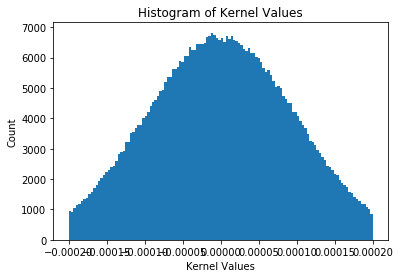

In [7]:
plot_histogram(numpy_tensor, "Histogram of Kernel Values", "Kernel Values")

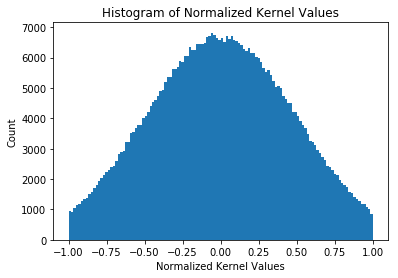

In [8]:
plot_histogram(numpy_tensor_normalized, "Histogram of Normalized Kernel Values", "Normalized Kernel Values")

In [9]:
def hypertune(thresholds, quantize_func):
  correct_percents = []
  numpy_tensors = []
  for t in thresholds:
    result = evaluate(t, quantize_func)
    correct_percents.append(result[0])
    numpy_tensors.append(result[1:])
  return correct_percents, numpy_tensors

num_points = 11

In [10]:
minmax_thresholds = [1-(0.1)*i for i in range(num_points)]
minmax_percents, minmax_tensors = hypertune(minmax_thresholds, minmax)

INFO:tensorflow:Summary name mean iou is illegal; using mean_iou instead.
0 [[[ -1.65374498e-04   8.48083073e-05   5.38634449e-05 ...,   8.22356128e-07
     1.46703460e-04   1.46106031e-04]
  [ -1.37766488e-04  -1.64437064e-04   1.33994414e-04 ...,   1.11697052e-04
     1.58271621e-04   6.91687892e-05]
  [  6.07838956e-05  -3.76971038e-05  -5.66109156e-05 ...,   4.96346147e-05
    -1.56270355e-04  -1.54332898e-04]
  ..., 
  [ -2.57794054e-05   1.67956299e-04   3.78424811e-05 ...,  -8.01539682e-06
     1.55219765e-04  -9.15185956e-05]
  [ -1.99516580e-05   2.45063711e-05  -1.69109000e-04 ...,   1.46536637e-04
    -3.72369832e-05   1.98118010e-04]
  [  4.77825197e-05   1.09400222e-04   2.50946105e-05 ...,  -7.20901808e-05
    -5.26987715e-05  -5.38599888e-05]]

 [[ -1.54336085e-04  -5.28544770e-05   1.42004908e-04 ...,  -3.07369774e-05
     8.78581050e-05   5.99082450e-05]
  [ -4.94201913e-06   1.61764285e-04   2.19269859e-05 ...,  -3.27253474e-05
    -7.24710553e-05  -6.70102372e-06]
  

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.032s detect: 0.202s misc: 0.010s
im_detect: 2/3741 im_read: 0.032s detect: 0.160s misc: 0.010s
im_detect: 3/3741 im_read: 0.031s detect: 0.144s misc: 0.010s
im_detect: 4/3741 im_read: 0.031s detect: 0.137s misc: 0.010s
im_detect: 5/3741 im_read: 0.031s detect: 0.133s misc: 0.010s
im_detect: 6/3741 im_read: 0.031s detect: 0.129s misc: 0.010s
im_detect: 7/3741 im_read: 0.031s detect: 0.127s misc: 0.010s
im_detect: 8/3741 im_read: 0.031s detect: 0.126s misc: 0.010s
im_detect: 9/3741 im_read: 0.031s detect: 0.124s misc: 0.010s
im_detect: 10/3741 im_read: 0.031s detect: 0.123s misc: 0.010s
im_detect: 11/3741 im_read: 0.031s detect: 0.122s misc: 0.010s
im_detect: 12/3741 im_read: 0.032s detect: 0.122s misc: 0.010s
im_detect: 13/3741 im_read: 0.031s detect: 0.121s misc: 0.010s
im_detect: 14/3741 im_read: 0.031s detect: 0.121s misc: 0.010s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 132/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 133/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 134/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 135/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 136/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 137/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 138/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 139/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 140/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 141/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 142/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 143/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 144/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 145/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 146/3741 im_read: 0.032s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 262/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 263/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 264/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 265/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 266/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 267/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 268/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 269/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 270/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 271/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 272/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 273/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 274/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 275/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 390/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 391/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 392/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 393/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 394/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 395/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 396/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 397/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 398/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 399/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 400/3741 im_read: 0.032s detect: 0.115s misc: 0.010s
im_detect: 401/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 402/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 403/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 404/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 405/3741 im_read: 0.032s dete

im_detect: 520/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 521/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 522/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 523/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 524/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 525/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 526/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 527/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 528/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 529/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 530/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 531/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 532/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 533/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 534/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 535/3741 im_read: 0.033s dete

im_detect: 650/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 651/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 652/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 653/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 654/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 655/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 656/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 657/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 658/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 659/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 660/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 661/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 662/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 663/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 664/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 665/3741 im_read: 0.032s dete

im_detect: 780/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 781/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 782/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 783/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 784/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 785/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 786/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 787/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 788/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 789/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 790/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 791/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 792/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 793/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 794/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 795/3741 im_read: 0.032s dete

im_detect: 910/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 911/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 912/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 913/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 914/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 915/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 916/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 917/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 918/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 919/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 920/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 921/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 922/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 923/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 924/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 925/3741 im_read: 0.032s dete

im_detect: 1038/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1039/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1040/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1041/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1042/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1043/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1044/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1045/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1046/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1047/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1048/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1049/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1050/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1051/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1052/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1053/3741 im_r

im_detect: 1165/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1166/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1167/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1168/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1169/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1170/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1171/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1172/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1173/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1174/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1175/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1176/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1177/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1178/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1179/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1180/3741 im_r

im_detect: 1293/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1294/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1295/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1296/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1297/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1298/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1299/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1300/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1301/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1302/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1303/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1304/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1305/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1306/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1307/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1308/3741 im_r

im_detect: 1421/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1422/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1423/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1424/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1425/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1426/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1427/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1428/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1429/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1430/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1431/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1432/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1433/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1434/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1435/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1436/3741 im_r

im_detect: 1548/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1549/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1550/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1551/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1552/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1553/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1554/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1555/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1556/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1557/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1558/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1559/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1560/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1561/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1562/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1563/3741 im_r

im_detect: 1676/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1677/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1678/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1679/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1680/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1681/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1682/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1683/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1684/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1685/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1686/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1687/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1688/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1689/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1690/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1691/3741 im_r

im_detect: 1804/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1805/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1806/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1807/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1808/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1809/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1810/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1811/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1812/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1813/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1814/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1815/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1816/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1817/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1818/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1819/3741 im_r

im_detect: 1932/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1933/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1934/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1935/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1936/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1937/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1938/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1939/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1940/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1941/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1942/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1943/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1944/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1945/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1946/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 1947/3741 im_r

im_detect: 2060/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2061/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2062/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2063/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2064/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2065/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2066/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2067/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2068/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2069/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2070/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2071/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2072/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2073/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2074/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2075/3741 im_r

im_detect: 2188/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2189/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2190/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2191/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2192/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2193/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2194/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2195/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2196/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2197/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2198/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2199/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2200/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2201/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2202/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2203/3741 im_r

im_detect: 2316/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2317/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2318/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2319/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2320/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2321/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2322/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2323/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2324/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2325/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2326/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2327/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2328/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2329/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2330/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2331/3741 im_r

im_detect: 2444/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2445/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2446/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2447/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2448/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2449/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2450/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2451/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2452/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2453/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2454/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2455/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2456/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2457/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2458/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2459/3741 im_r

im_detect: 2572/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2573/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2574/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2575/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2576/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2577/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2578/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2579/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2580/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2581/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2582/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2583/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2584/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2585/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2586/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2587/3741 im_r

im_detect: 2700/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2701/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2702/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2703/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2704/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2705/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2706/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2707/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2708/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2709/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2710/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2711/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2712/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2713/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2714/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2715/3741 im_r

im_detect: 2828/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2829/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2830/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2831/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2832/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2833/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2834/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2835/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2836/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2837/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2838/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2839/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2840/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2841/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2842/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2843/3741 im_r

im_detect: 2956/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2957/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2958/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2959/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2960/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2961/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2962/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2963/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2964/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2965/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2966/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2967/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2968/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2969/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2970/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2971/3741 im_r

im_detect: 3083/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3084/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3085/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3086/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3087/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3088/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3089/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3090/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3091/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3092/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3093/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3094/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3095/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3096/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3097/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3098/3741 im_r

im_detect: 3211/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3212/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3213/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3214/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3215/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3216/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3217/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3218/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3219/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3220/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3221/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3222/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3223/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3224/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3225/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3226/3741 im_r

im_detect: 3339/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3340/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3341/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3342/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3343/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3344/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3345/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3346/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3347/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3348/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3349/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3350/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3351/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3352/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3353/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3354/3741 im_r

im_detect: 3467/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3468/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3469/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3470/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3471/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3472/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3473/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3474/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3475/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3476/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3477/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3478/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3479/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3480/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3481/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3482/3741 im_r

im_detect: 3595/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3596/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3597/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3598/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3599/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3600/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3601/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3602/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3603/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3604/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3605/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3606/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3607/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3608/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3609/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3610/3741 im_r

im_detect: 3723/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3724/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3725/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3726/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3727/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3728/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3729/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3730/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3731/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3732/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3733/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3734/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3735/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3736/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3737/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 3738/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.031s detect: 0.203s misc: 0.010s
im_detect: 2/3741 im_read: 0.032s detect: 0.158s misc: 0.010s
im_detect: 3/3741 im_read: 0.031s detect: 0.144s misc: 0.010s
im_detect: 4/3741 im_read: 0.031s detect: 0.137s misc: 0.010s
im_detect: 5/3741 im_read: 0.031s detect: 0.132s misc: 0.010s
im_detect: 6/3741 im_read: 0.031s detect: 0.129s misc: 0.010s
im_detect: 7/3741 im_read: 0.031s detect: 0.127s misc: 0.010s
im_detect: 8/3741 im_read: 0.031s detect: 0.125s misc: 0.010s
im_detect: 9/3741 im_read: 0.031s detect: 0.124s misc: 0.010s
im_detect: 10/3741 im_read: 0.031s detect: 0.123s misc: 0.010s
im_detect: 11/3741 im_read: 0.031s detect: 0.122s misc: 0.010s
im_detect: 12/3741 im_read: 0.031s detect: 0.122s misc: 0.010s
im_detect: 13/3741 im_read: 0.031s detect: 0.121s misc: 0.010s
im_detect: 14/3741 im_read: 0.031s detect: 0.121s misc: 0.010s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 132/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 133/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 134/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 135/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 136/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 137/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 138/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 139/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 140/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 141/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 142/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 143/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 144/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 145/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 146/3741 im_read: 0.031s dete

im_detect: 261/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 262/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 263/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 264/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 265/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 266/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 267/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 268/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 269/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 270/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 271/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 272/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 273/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 274/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 275/3741 im_read: 0.031s detect: 0.115s misc: 0.010s
im_detect: 276/3741 im_read: 0.031s dete

im_detect: 391/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 392/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 393/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 394/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 395/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 396/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 397/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 398/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 399/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 400/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 401/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 402/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 403/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 404/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 405/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 406/3741 im_read: 0.031s dete

im_detect: 521/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 522/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 523/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 524/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 525/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 526/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 527/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 528/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 529/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 530/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 531/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 532/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 533/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 534/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 535/3741 im_read: 0.031s detect: 0.114s misc: 0.010s
im_detect: 536/3741 im_read: 0.031s dete

im_detect: 651/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 652/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 653/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 654/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 655/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 656/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 657/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 658/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 659/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 660/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 661/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 662/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 663/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 664/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 665/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 666/3741 im_read: 0.032s dete

im_detect: 781/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 782/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 783/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 784/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 785/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 786/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 787/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 788/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 789/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 790/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 791/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 792/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 793/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 794/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 795/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 796/3741 im_read: 0.032s dete

im_detect: 911/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 912/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 913/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 914/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 915/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 916/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 917/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 918/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 919/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 920/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 921/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 922/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 923/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 924/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 925/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 926/3741 im_read: 0.032s dete

im_detect: 1039/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1040/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1041/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1042/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1043/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1044/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1045/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1046/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1047/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1048/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1049/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1050/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1051/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1052/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1053/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1054/3741 im_r

im_detect: 1166/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1167/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1168/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1169/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1170/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1171/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1172/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1173/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1174/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1175/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1176/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1177/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1178/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1179/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1180/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1181/3741 im_r

im_detect: 1294/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1295/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1296/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1297/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1298/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1299/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1300/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1301/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1302/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1303/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1304/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1305/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1306/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1307/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1308/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1309/3741 im_r

im_detect: 1422/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1423/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1424/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1425/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1426/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1427/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1428/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1429/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1430/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1431/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1432/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1433/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1434/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1435/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1436/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1437/3741 im_r

im_detect: 1549/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1550/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1551/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1552/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1553/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1554/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1555/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1556/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1557/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1558/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1559/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1560/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1561/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1562/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1563/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1564/3741 im_r

im_detect: 1676/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1677/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1678/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1679/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1680/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1681/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1682/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1683/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1684/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1685/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1686/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1687/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1688/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1689/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1690/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1691/3741 im_r

im_detect: 1804/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1805/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1806/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1807/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1808/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1809/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1810/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1811/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1812/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1813/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1814/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1815/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1816/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1817/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1818/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1819/3741 im_r

im_detect: 1932/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1933/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1934/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1935/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1936/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1937/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1938/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1939/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1940/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1941/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1942/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1943/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1944/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1945/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1946/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 1947/3741 im_r

im_detect: 2059/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2060/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2061/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2062/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2063/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2064/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2065/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2066/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2067/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2068/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2069/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2070/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2071/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2072/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2073/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2074/3741 im_r

im_detect: 2187/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2188/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2189/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2190/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2191/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2192/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2193/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2194/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2195/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2196/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2197/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2198/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2199/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2200/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2201/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2202/3741 im_r

im_detect: 2315/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2316/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2317/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2318/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2319/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2320/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2321/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2322/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2323/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2324/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2325/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2326/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2327/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2328/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2329/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 2330/3741 im_r

im_detect: 2443/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2444/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2445/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2446/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2447/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2448/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2449/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2450/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2451/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2452/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2453/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2454/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2455/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2456/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2457/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2458/3741 im_r

im_detect: 2571/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2572/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2573/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2574/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2575/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2576/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2577/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2578/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2579/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2580/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2581/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2582/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2583/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2584/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2585/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2586/3741 im_r

im_detect: 2699/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2700/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2701/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2702/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2703/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2704/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2705/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2706/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2707/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2708/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2709/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2710/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2711/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2712/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2713/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2714/3741 im_r

im_detect: 2827/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2828/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2829/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2830/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2831/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2832/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2833/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2834/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2835/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2836/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2837/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2838/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2839/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2840/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2841/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2842/3741 im_r

im_detect: 2955/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2956/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2957/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2958/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2959/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2960/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2961/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2962/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2963/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2964/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2965/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2966/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2967/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2968/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2969/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 2970/3741 im_r

im_detect: 3083/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3084/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3085/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3086/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3087/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3088/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3089/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3090/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3091/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3092/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3093/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3094/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3095/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3096/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3097/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3098/3741 im_r

im_detect: 3211/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3212/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3213/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3214/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3215/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3216/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3217/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3218/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3219/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3220/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3221/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3222/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3223/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3224/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3225/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3226/3741 im_r

im_detect: 3339/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3340/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3341/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3342/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3343/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3344/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3345/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3346/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3347/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3348/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3349/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3350/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3351/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3352/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3353/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3354/3741 im_r

im_detect: 3467/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3468/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3469/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3470/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3471/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3472/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3473/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3474/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3475/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3476/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3477/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3478/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3479/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3480/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3481/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3482/3741 im_r

im_detect: 3595/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3596/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3597/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3598/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3599/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3600/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3601/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3602/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3603/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3604/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3605/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3606/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3607/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3608/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3609/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3610/3741 im_r

im_detect: 3723/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3724/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3725/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3726/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3727/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3728/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3729/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3730/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3731/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3732/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3733/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3734/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3735/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3736/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3737/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 3738/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.032s detect: 0.200s misc: 0.012s
im_detect: 2/3741 im_read: 0.032s detect: 0.157s misc: 0.011s
im_detect: 3/3741 im_read: 0.032s detect: 0.142s misc: 0.011s
im_detect: 4/3741 im_read: 0.032s detect: 0.136s misc: 0.011s
im_detect: 5/3741 im_read: 0.032s detect: 0.130s misc: 0.011s
im_detect: 6/3741 im_read: 0.032s detect: 0.127s misc: 0.011s
im_detect: 7/3741 im_read: 0.032s detect: 0.125s misc: 0.011s
im_detect: 8/3741 im_read: 0.032s detect: 0.124s misc: 0.011s
im_detect: 9/3741 im_read: 0.032s detect: 0.123s misc: 0.011s
im_detect: 10/3741 im_read: 0.032s detect: 0.122s misc: 0.011s
im_detect: 11/3741 im_read: 0.032s detect: 0.121s misc: 0.011s
im_detect: 12/3741 im_read: 0.032s detect: 0.121s misc: 0.011s
im_detect: 13/3741 im_read: 0.032s detect: 0.120s misc: 0.011s
im_detect: 14/3741 im_read: 0.032s detect: 0.120s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.033s detect: 0.115s misc: 0.011s
im_detect: 132/3741 im_read: 0.033s detect: 0.115s misc: 0.011s
im_detect: 133/3741 im_read: 0.033s detect: 0.115s misc: 0.011s
im_detect: 134/3741 im_read: 0.033s detect: 0.115s misc: 0.011s
im_detect: 135/3741 im_read: 0.033s detect: 0.115s misc: 0.011s
im_detect: 136/3741 im_read: 0.033s detect: 0.115s misc: 0.011s
im_detect: 137/3741 im_read: 0.033s detect: 0.115s misc: 0.011s
im_detect: 138/3741 im_read: 0.033s detect: 0.115s misc: 0.011s
im_detect: 139/3741 im_read: 0.033s detect: 0.115s misc: 0.011s
im_detect: 140/3741 im_read: 0.033s detect: 0.115s misc: 0.011s
im_detect: 141/3741 im_read: 0.033s detect: 0.115s misc: 0.011s
im_detect: 142/3741 im_read: 0.033s detect: 0.115s misc: 0.011s
im_detect: 143/3741 im_read: 0.033s detect: 0.115s misc: 0.011s
im_detect: 144/3741 im_read: 0.033s detect: 0.115s misc: 0.011s
im_detect: 145/3741 im_read: 0.033s detect: 0.115s misc: 0.011s
im_detect: 146/3741 im_read: 0.033s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 262/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 263/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 264/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 265/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 266/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 267/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 268/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 269/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 270/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 271/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 272/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 273/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 274/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 275/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 391/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 392/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 393/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 394/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 395/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 396/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 397/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 398/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 399/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 400/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 401/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 402/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 403/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 404/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 405/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 406/3741 im_read: 0.032s dete

im_detect: 520/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 521/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 522/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 523/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 524/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 525/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 526/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 527/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 528/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 529/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 530/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 531/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 532/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 533/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 534/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 535/3741 im_read: 0.032s dete

im_detect: 650/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 651/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 652/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 653/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 654/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 655/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 656/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 657/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 658/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 659/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 660/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 661/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 662/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 663/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 664/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 665/3741 im_read: 0.032s dete

im_detect: 780/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 781/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 782/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 783/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 784/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 785/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 786/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 787/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 788/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 789/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 790/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 791/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 792/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 793/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 794/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 795/3741 im_read: 0.032s dete

im_detect: 910/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 911/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 912/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 913/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 914/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 915/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 916/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 917/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 918/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 919/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 920/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 921/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 922/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 923/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 924/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 925/3741 im_read: 0.032s dete

im_detect: 1039/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 1040/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 1041/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 1042/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 1043/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 1044/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 1045/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 1046/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 1047/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 1048/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 1049/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 1050/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 1051/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 1052/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 1053/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 1054/3741 im_r

im_detect: 1167/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1168/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1169/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1170/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1171/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1172/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1173/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1174/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1175/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1176/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1177/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1178/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1179/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1180/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1181/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1182/3741 im_r

im_detect: 1294/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1295/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1296/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1297/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1298/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1299/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1300/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1301/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1302/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1303/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1304/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1305/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1306/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1307/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1308/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1309/3741 im_r

im_detect: 1422/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1423/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1424/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1425/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1426/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1427/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1428/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1429/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1430/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1431/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1432/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1433/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1434/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1435/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1436/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1437/3741 im_r

im_detect: 1550/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1551/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1552/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1553/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1554/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1555/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1556/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1557/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1558/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1559/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1560/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1561/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1562/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1563/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1564/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1565/3741 im_r

im_detect: 1678/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1679/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1680/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1681/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1682/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1683/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1684/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1685/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1686/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1687/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1688/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1689/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1690/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1691/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1692/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1693/3741 im_r

im_detect: 1806/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1807/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1808/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1809/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1810/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1811/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1812/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1813/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1814/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1815/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1816/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1817/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1818/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1819/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1820/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1821/3741 im_r

im_detect: 1934/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1935/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1936/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1937/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1938/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1939/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1940/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1941/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1942/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1943/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1944/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1945/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1946/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1947/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1948/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1949/3741 im_r

im_detect: 2062/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2063/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2064/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2065/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2066/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2067/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2068/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2069/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2070/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2071/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2072/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2073/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2074/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2075/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2076/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2077/3741 im_r

im_detect: 2190/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2191/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2192/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2193/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2194/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2195/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2196/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2197/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2198/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2199/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2200/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2201/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2202/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2203/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2204/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2205/3741 im_r

im_detect: 2318/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2319/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2320/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2321/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2322/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2323/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2324/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2325/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2326/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2327/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2328/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2329/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2330/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2331/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2332/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2333/3741 im_r

im_detect: 2446/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2447/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2448/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2449/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2450/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2451/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2452/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2453/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2454/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2455/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2456/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2457/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2458/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2459/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2460/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2461/3741 im_r

im_detect: 2574/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2575/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2576/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2577/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2578/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2579/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2580/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2581/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2582/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2583/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2584/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2585/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2586/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2587/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2588/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2589/3741 im_r

im_detect: 2702/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2703/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2704/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2705/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2706/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2707/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2708/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2709/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2710/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2711/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2712/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2713/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2714/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2715/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2716/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2717/3741 im_r

im_detect: 2830/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2831/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2832/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2833/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2834/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2835/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2836/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2837/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2838/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2839/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2840/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2841/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2842/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2843/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2844/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2845/3741 im_r

im_detect: 2957/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2958/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2959/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2960/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2961/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2962/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2963/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2964/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2965/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2966/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2967/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2968/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2969/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2970/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2971/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2972/3741 im_r

im_detect: 3085/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3086/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3087/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3088/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3089/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3090/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3091/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3092/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3093/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3094/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3095/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3096/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3097/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3098/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3099/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3100/3741 im_r

im_detect: 3213/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3214/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3215/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3216/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3217/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3218/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3219/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3220/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3221/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3222/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3223/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3224/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3225/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3226/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3227/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3228/3741 im_r

im_detect: 3340/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3341/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3342/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3343/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3344/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3345/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3346/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3347/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3348/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3349/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3350/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3351/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3352/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3353/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3354/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3355/3741 im_r

im_detect: 3468/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3469/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3470/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3471/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3472/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3473/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3474/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3475/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3476/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3477/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3478/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3479/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3480/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3481/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3482/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3483/3741 im_r

im_detect: 3596/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3597/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3598/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3599/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3600/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3601/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3602/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3603/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3604/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3605/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3606/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3607/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3608/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3609/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3610/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3611/3741 im_r

im_detect: 3724/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3725/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3726/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3727/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3728/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3729/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3730/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3731/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3732/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3733/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3734/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3735/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3736/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3737/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3738/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3739/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.031s detect: 0.200s misc: 0.011s
im_detect: 2/3741 im_read: 0.031s detect: 0.156s misc: 0.011s
im_detect: 3/3741 im_read: 0.031s detect: 0.142s misc: 0.010s
im_detect: 4/3741 im_read: 0.031s detect: 0.136s misc: 0.011s
im_detect: 5/3741 im_read: 0.031s detect: 0.132s misc: 0.010s
im_detect: 6/3741 im_read: 0.031s detect: 0.128s misc: 0.010s
im_detect: 7/3741 im_read: 0.031s detect: 0.126s misc: 0.010s
im_detect: 8/3741 im_read: 0.031s detect: 0.124s misc: 0.010s
im_detect: 9/3741 im_read: 0.031s detect: 0.123s misc: 0.010s
im_detect: 10/3741 im_read: 0.031s detect: 0.122s misc: 0.010s
im_detect: 11/3741 im_read: 0.031s detect: 0.121s misc: 0.010s
im_detect: 12/3741 im_read: 0.031s detect: 0.121s misc: 0.011s
im_detect: 13/3741 im_read: 0.031s detect: 0.120s misc: 0.011s
im_detect: 14/3741 im_read: 0.031s detect: 0.120s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 132/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 133/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 134/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 135/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 136/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 137/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 138/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 139/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 140/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 141/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 142/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 143/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 144/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 145/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 146/3741 im_read: 0.032s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 262/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 263/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 264/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 265/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 266/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 267/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 268/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 269/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 270/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 271/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 272/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 273/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 274/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 275/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 391/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 392/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 393/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 394/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 395/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 396/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 397/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 398/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 399/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 400/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 401/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 402/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 403/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 404/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 405/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 406/3741 im_read: 0.032s dete

im_detect: 521/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 522/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 523/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 524/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 525/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 526/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 527/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 528/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 529/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 530/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 531/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 532/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 533/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 534/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 535/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 536/3741 im_read: 0.032s dete

im_detect: 651/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 652/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 653/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 654/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 655/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 656/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 657/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 658/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 659/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 660/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 661/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 662/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 663/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 664/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 665/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 666/3741 im_read: 0.032s dete

im_detect: 781/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 782/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 783/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 784/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 785/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 786/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 787/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 788/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 789/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 790/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 791/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 792/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 793/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 794/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 795/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 796/3741 im_read: 0.032s dete

im_detect: 911/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 912/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 913/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 914/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 915/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 916/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 917/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 918/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 919/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 920/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 921/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 922/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 923/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 924/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 925/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 926/3741 im_read: 0.032s dete

im_detect: 1039/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1040/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1041/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1042/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1043/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1044/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1045/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1046/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1047/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1048/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1049/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1050/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1051/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1052/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1053/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1054/3741 im_r

im_detect: 1166/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1167/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1168/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1169/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1170/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1171/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1172/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1173/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1174/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1175/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1176/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1177/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1178/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1179/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1180/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1181/3741 im_r

im_detect: 1294/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1295/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1296/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1297/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1298/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1299/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1300/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1301/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1302/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1303/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1304/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1305/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1306/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1307/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1308/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1309/3741 im_r

im_detect: 1422/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1423/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1424/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1425/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1426/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1427/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1428/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1429/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1430/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1431/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1432/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1433/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1434/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1435/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1436/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1437/3741 im_r

im_detect: 1550/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1551/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1552/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1553/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1554/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1555/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1556/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1557/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1558/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1559/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1560/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1561/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1562/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1563/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1564/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1565/3741 im_r

im_detect: 1678/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1679/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1680/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1681/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1682/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1683/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1684/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1685/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1686/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1687/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1688/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1689/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1690/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1691/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1692/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1693/3741 im_r

im_detect: 1806/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1807/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1808/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1809/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1810/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1811/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1812/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1813/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1814/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1815/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1816/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1817/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1818/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1819/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1820/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1821/3741 im_r

im_detect: 1934/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1935/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1936/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1937/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1938/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1939/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1940/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1941/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1942/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1943/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1944/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1945/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1946/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1947/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1948/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1949/3741 im_r

im_detect: 2062/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2063/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2064/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2065/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2066/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2067/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2068/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2069/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2070/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2071/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2072/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2073/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2074/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2075/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2076/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2077/3741 im_r

im_detect: 2189/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2190/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2191/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2192/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2193/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2194/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2195/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2196/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2197/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2198/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2199/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2200/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2201/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2202/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2203/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2204/3741 im_r

im_detect: 2317/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2318/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2319/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2320/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2321/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2322/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2323/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2324/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2325/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2326/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2327/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2328/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2329/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2330/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2331/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2332/3741 im_r

im_detect: 2445/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2446/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2447/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2448/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2449/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2450/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2451/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2452/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2453/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2454/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2455/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2456/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2457/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2458/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2459/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2460/3741 im_r

im_detect: 2572/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2573/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2574/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2575/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2576/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2577/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2578/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2579/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2580/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2581/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2582/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2583/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2584/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2585/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2586/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2587/3741 im_r

im_detect: 2700/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2701/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2702/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2703/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2704/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2705/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2706/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2707/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2708/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2709/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2710/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2711/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2712/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2713/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2714/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2715/3741 im_r

im_detect: 2828/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2829/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2830/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2831/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2832/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2833/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2834/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2835/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2836/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2837/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2838/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2839/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2840/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2841/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2842/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2843/3741 im_r

im_detect: 2956/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2957/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2958/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2959/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2960/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2961/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2962/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2963/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2964/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2965/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2966/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2967/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2968/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2969/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2970/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 2971/3741 im_r

im_detect: 3084/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3085/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3086/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3087/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3088/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3089/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3090/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3091/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3092/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3093/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3094/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3095/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3096/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3097/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3098/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3099/3741 im_r

im_detect: 3212/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3213/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3214/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3215/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3216/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3217/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3218/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3219/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3220/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3221/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3222/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3223/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3224/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3225/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3226/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3227/3741 im_r

im_detect: 3340/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3341/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3342/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3343/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3344/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3345/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3346/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3347/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3348/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3349/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3350/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3351/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3352/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3353/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3354/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3355/3741 im_r

im_detect: 3468/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3469/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3470/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3471/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3472/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3473/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3474/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3475/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3476/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3477/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3478/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3479/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3480/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3481/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3482/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3483/3741 im_r

im_detect: 3595/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3596/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3597/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3598/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3599/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3600/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3601/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3602/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3603/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3604/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3605/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3606/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3607/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3608/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3609/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3610/3741 im_r

im_detect: 3723/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3724/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3725/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3726/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3727/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3728/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3729/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3730/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3731/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3732/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3733/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3734/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3735/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3736/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3737/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 3738/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.032s detect: 0.204s misc: 0.010s
im_detect: 2/3741 im_read: 0.032s detect: 0.159s misc: 0.009s
im_detect: 3/3741 im_read: 0.031s detect: 0.142s misc: 0.010s
im_detect: 4/3741 im_read: 0.031s detect: 0.135s misc: 0.010s
im_detect: 5/3741 im_read: 0.031s detect: 0.130s misc: 0.010s
im_detect: 6/3741 im_read: 0.031s detect: 0.127s misc: 0.010s
im_detect: 7/3741 im_read: 0.031s detect: 0.126s misc: 0.010s
im_detect: 8/3741 im_read: 0.031s detect: 0.124s misc: 0.010s
im_detect: 9/3741 im_read: 0.031s detect: 0.123s misc: 0.010s
im_detect: 10/3741 im_read: 0.031s detect: 0.122s misc: 0.010s
im_detect: 11/3741 im_read: 0.031s detect: 0.122s misc: 0.010s
im_detect: 12/3741 im_read: 0.031s detect: 0.121s misc: 0.010s
im_detect: 13/3741 im_read: 0.031s detect: 0.120s misc: 0.010s
im_detect: 14/3741 im_read: 0.031s detect: 0.120s misc: 0.010s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.036s detect: 0.114s misc: 0.010s
im_detect: 132/3741 im_read: 0.036s detect: 0.114s misc: 0.010s
im_detect: 133/3741 im_read: 0.036s detect: 0.114s misc: 0.010s
im_detect: 134/3741 im_read: 0.036s detect: 0.114s misc: 0.010s
im_detect: 135/3741 im_read: 0.036s detect: 0.114s misc: 0.010s
im_detect: 136/3741 im_read: 0.036s detect: 0.114s misc: 0.010s
im_detect: 137/3741 im_read: 0.036s detect: 0.114s misc: 0.010s
im_detect: 138/3741 im_read: 0.036s detect: 0.114s misc: 0.010s
im_detect: 139/3741 im_read: 0.036s detect: 0.114s misc: 0.010s
im_detect: 140/3741 im_read: 0.036s detect: 0.114s misc: 0.010s
im_detect: 141/3741 im_read: 0.036s detect: 0.114s misc: 0.010s
im_detect: 142/3741 im_read: 0.036s detect: 0.114s misc: 0.010s
im_detect: 143/3741 im_read: 0.036s detect: 0.114s misc: 0.010s
im_detect: 144/3741 im_read: 0.036s detect: 0.114s misc: 0.010s
im_detect: 145/3741 im_read: 0.036s detect: 0.114s misc: 0.010s
im_detect: 146/3741 im_read: 0.036s dete

im_detect: 261/3741 im_read: 0.034s detect: 0.114s misc: 0.010s
im_detect: 262/3741 im_read: 0.034s detect: 0.114s misc: 0.010s
im_detect: 263/3741 im_read: 0.034s detect: 0.114s misc: 0.010s
im_detect: 264/3741 im_read: 0.034s detect: 0.114s misc: 0.010s
im_detect: 265/3741 im_read: 0.034s detect: 0.114s misc: 0.010s
im_detect: 266/3741 im_read: 0.034s detect: 0.114s misc: 0.010s
im_detect: 267/3741 im_read: 0.034s detect: 0.114s misc: 0.010s
im_detect: 268/3741 im_read: 0.034s detect: 0.114s misc: 0.010s
im_detect: 269/3741 im_read: 0.034s detect: 0.114s misc: 0.010s
im_detect: 270/3741 im_read: 0.034s detect: 0.114s misc: 0.010s
im_detect: 271/3741 im_read: 0.034s detect: 0.114s misc: 0.010s
im_detect: 272/3741 im_read: 0.034s detect: 0.114s misc: 0.010s
im_detect: 273/3741 im_read: 0.034s detect: 0.114s misc: 0.010s
im_detect: 274/3741 im_read: 0.034s detect: 0.114s misc: 0.010s
im_detect: 275/3741 im_read: 0.034s detect: 0.114s misc: 0.010s
im_detect: 276/3741 im_read: 0.034s dete

im_detect: 391/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 392/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 393/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 394/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 395/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 396/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 397/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 398/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 399/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 400/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 401/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 402/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 403/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 404/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 405/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 406/3741 im_read: 0.033s dete

im_detect: 521/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 522/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 523/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 524/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 525/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 526/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 527/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 528/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 529/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 530/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 531/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 532/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 533/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 534/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 535/3741 im_read: 0.033s detect: 0.114s misc: 0.010s
im_detect: 536/3741 im_read: 0.033s dete

im_detect: 651/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 652/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 653/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 654/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 655/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 656/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 657/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 658/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 659/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 660/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 661/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 662/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 663/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 664/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 665/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 666/3741 im_read: 0.032s dete

im_detect: 781/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 782/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 783/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 784/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 785/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 786/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 787/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 788/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 789/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 790/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 791/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 792/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 793/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 794/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 795/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 796/3741 im_read: 0.032s dete

im_detect: 911/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 912/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 913/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 914/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 915/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 916/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 917/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 918/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 919/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 920/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 921/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 922/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 923/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 924/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 925/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 926/3741 im_read: 0.032s dete

im_detect: 1039/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1040/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1041/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1042/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1043/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1044/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1045/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1046/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1047/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1048/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1049/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1050/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1051/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1052/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1053/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1054/3741 im_r

im_detect: 1166/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1167/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1168/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1169/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1170/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1171/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1172/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1173/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1174/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1175/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1176/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1177/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1178/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1179/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1180/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1181/3741 im_r

im_detect: 1293/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1294/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1295/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1296/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1297/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1298/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1299/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1300/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1301/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1302/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1303/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1304/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1305/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1306/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1307/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1308/3741 im_r

im_detect: 1421/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1422/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1423/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1424/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1425/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1426/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1427/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1428/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1429/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1430/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1431/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1432/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1433/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1434/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1435/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1436/3741 im_r

im_detect: 1549/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1550/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1551/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1552/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1553/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1554/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1555/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1556/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1557/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1558/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1559/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1560/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1561/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1562/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1563/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1564/3741 im_r

im_detect: 1676/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1677/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1678/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1679/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1680/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1681/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1682/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1683/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1684/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1685/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1686/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1687/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1688/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1689/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1690/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1691/3741 im_r

im_detect: 1804/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1805/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1806/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1807/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1808/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1809/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1810/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1811/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1812/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1813/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1814/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1815/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1816/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1817/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1818/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1819/3741 im_r

im_detect: 1932/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1933/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1934/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1935/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1936/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1937/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1938/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1939/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1940/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1941/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1942/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1943/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1944/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1945/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1946/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1947/3741 im_r

im_detect: 2060/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2061/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2062/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2063/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2064/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2065/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2066/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2067/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2068/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2069/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2070/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2071/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2072/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2073/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2074/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2075/3741 im_r

im_detect: 2188/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2189/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2190/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2191/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2192/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2193/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2194/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2195/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2196/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2197/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2198/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2199/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2200/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2201/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2202/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2203/3741 im_r

im_detect: 2316/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2317/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2318/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2319/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2320/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2321/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2322/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2323/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2324/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2325/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2326/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2327/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2328/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2329/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2330/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2331/3741 im_r

im_detect: 2444/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2445/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2446/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2447/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2448/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2449/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2450/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2451/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2452/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2453/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2454/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2455/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2456/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2457/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2458/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2459/3741 im_r

im_detect: 2571/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2572/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2573/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2574/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2575/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2576/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2577/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2578/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2579/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2580/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2581/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2582/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2583/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2584/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2585/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2586/3741 im_r

im_detect: 2699/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2700/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2701/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2702/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2703/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2704/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2705/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2706/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2707/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2708/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2709/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2710/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2711/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2712/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2713/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2714/3741 im_r

im_detect: 2827/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2828/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2829/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2830/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2831/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2832/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2833/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2834/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2835/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2836/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2837/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2838/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2839/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2840/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2841/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2842/3741 im_r

im_detect: 2955/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2956/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2957/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2958/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2959/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2960/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2961/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2962/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2963/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2964/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2965/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2966/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2967/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2968/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2969/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2970/3741 im_r

im_detect: 3083/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3084/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3085/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3086/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3087/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3088/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3089/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3090/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3091/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3092/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3093/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3094/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3095/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3096/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3097/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3098/3741 im_r

im_detect: 3211/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3212/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3213/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3214/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3215/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3216/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3217/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3218/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3219/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3220/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3221/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3222/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3223/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3224/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3225/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3226/3741 im_r

im_detect: 3339/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3340/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3341/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3342/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3343/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3344/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3345/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3346/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3347/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3348/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3349/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3350/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3351/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3352/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3353/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3354/3741 im_r

im_detect: 3467/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3468/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3469/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3470/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3471/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3472/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3473/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3474/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3475/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3476/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3477/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3478/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3479/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3480/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3481/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3482/3741 im_r

im_detect: 3595/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3596/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3597/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3598/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3599/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3600/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3601/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3602/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3603/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3604/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3605/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3606/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3607/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3608/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3609/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3610/3741 im_r

im_detect: 3723/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3724/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3725/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3726/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3727/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3728/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3729/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3730/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3731/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3732/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3733/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3734/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3735/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3736/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3737/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3738/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.032s detect: 0.204s misc: 0.011s
im_detect: 2/3741 im_read: 0.032s detect: 0.159s misc: 0.011s
im_detect: 3/3741 im_read: 0.032s detect: 0.143s misc: 0.011s
im_detect: 4/3741 im_read: 0.032s detect: 0.135s misc: 0.011s
im_detect: 5/3741 im_read: 0.032s detect: 0.131s misc: 0.011s
im_detect: 6/3741 im_read: 0.032s detect: 0.128s misc: 0.011s
im_detect: 7/3741 im_read: 0.032s detect: 0.125s misc: 0.011s
im_detect: 8/3741 im_read: 0.032s detect: 0.124s misc: 0.011s
im_detect: 9/3741 im_read: 0.032s detect: 0.122s misc: 0.011s
im_detect: 10/3741 im_read: 0.032s detect: 0.121s misc: 0.011s
im_detect: 11/3741 im_read: 0.032s detect: 0.120s misc: 0.011s
im_detect: 12/3741 im_read: 0.034s detect: 0.120s misc: 0.011s
im_detect: 13/3741 im_read: 0.034s detect: 0.119s misc: 0.011s
im_detect: 14/3741 im_read: 0.033s detect: 0.118s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 132/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 133/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 134/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 135/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 136/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 137/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 138/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 139/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 140/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 141/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 142/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 143/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 144/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 145/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 146/3741 im_read: 0.032s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 262/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 263/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 264/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 265/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 266/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 267/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 268/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 269/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 270/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 271/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 272/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 273/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 274/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 275/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 390/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 391/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 392/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 393/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 394/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 395/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 396/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 397/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 398/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 399/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 400/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 401/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 402/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 403/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 404/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 405/3741 im_read: 0.032s dete

im_detect: 520/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 521/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 522/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 523/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 524/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 525/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 526/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 527/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 528/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 529/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 530/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 531/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 532/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 533/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 534/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 535/3741 im_read: 0.032s dete

im_detect: 649/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 650/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 651/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 652/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 653/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 654/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 655/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 656/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 657/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 658/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 659/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 660/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 661/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 662/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 663/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 664/3741 im_read: 0.033s dete

im_detect: 779/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 780/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 781/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 782/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 783/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 784/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 785/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 786/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 787/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 788/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 789/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 790/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 791/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 792/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 793/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 794/3741 im_read: 0.033s dete

im_detect: 909/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 910/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 911/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 912/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 913/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 914/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 915/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 916/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 917/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 918/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 919/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 920/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 921/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 922/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 923/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 924/3741 im_read: 0.033s dete

im_detect: 1038/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1039/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1040/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1041/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1042/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1043/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1044/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1045/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1046/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1047/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1048/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1049/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1050/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1051/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1052/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1053/3741 im_r

im_detect: 1165/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1166/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1167/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1168/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1169/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1170/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1171/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1172/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1173/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1174/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1175/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1176/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1177/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1178/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1179/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1180/3741 im_r

im_detect: 1293/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1294/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1295/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1296/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1297/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1298/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1299/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1300/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1301/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1302/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1303/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1304/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1305/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1306/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1307/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1308/3741 im_r

im_detect: 1421/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1422/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1423/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1424/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1425/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1426/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1427/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1428/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1429/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1430/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1431/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1432/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1433/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1434/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1435/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1436/3741 im_r

im_detect: 1549/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1550/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1551/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1552/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1553/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1554/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1555/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1556/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1557/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1558/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1559/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1560/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1561/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1562/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1563/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1564/3741 im_r

im_detect: 1677/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1678/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1679/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1680/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1681/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1682/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1683/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1684/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1685/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1686/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1687/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1688/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1689/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1690/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1691/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1692/3741 im_r

im_detect: 1805/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1806/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1807/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1808/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1809/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1810/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1811/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1812/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1813/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1814/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1815/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1816/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1817/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1818/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1819/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1820/3741 im_r

im_detect: 1932/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1933/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1934/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1935/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1936/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1937/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1938/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1939/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1940/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1941/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1942/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1943/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1944/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1945/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1946/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1947/3741 im_r

im_detect: 2059/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2060/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2061/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2062/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2063/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2064/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2065/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2066/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2067/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2068/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2069/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2070/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2071/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2072/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2073/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2074/3741 im_r

im_detect: 2187/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2188/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2189/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2190/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2191/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2192/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2193/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2194/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2195/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2196/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2197/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2198/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2199/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2200/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2201/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2202/3741 im_r

im_detect: 2314/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2315/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2316/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2317/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2318/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2319/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2320/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2321/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2322/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2323/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2324/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2325/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2326/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2327/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2328/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2329/3741 im_r

im_detect: 2441/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2442/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2443/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2444/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2445/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2446/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2447/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2448/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2449/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2450/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2451/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2452/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2453/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2454/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2455/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2456/3741 im_r

im_detect: 2569/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2570/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2571/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2572/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2573/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2574/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2575/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2576/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2577/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2578/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2579/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2580/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2581/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2582/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2583/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2584/3741 im_r

im_detect: 2697/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2698/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2699/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2700/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2701/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2702/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2703/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2704/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2705/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2706/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2707/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2708/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2709/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2710/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2711/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2712/3741 im_r

im_detect: 2825/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2826/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2827/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2828/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2829/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2830/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2831/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2832/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2833/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2834/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2835/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2836/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2837/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2838/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2839/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2840/3741 im_r

im_detect: 2952/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2953/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2954/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2955/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2956/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2957/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2958/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2959/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2960/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2961/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2962/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2963/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2964/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2965/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2966/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2967/3741 im_r

im_detect: 3080/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3081/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3082/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3083/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3084/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3085/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3086/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3087/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3088/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3089/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3090/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3091/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3092/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3093/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3094/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3095/3741 im_r

im_detect: 3208/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3209/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3210/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3211/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3212/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3213/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3214/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3215/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3216/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3217/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3218/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3219/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3220/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3221/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3222/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3223/3741 im_r

im_detect: 3336/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3337/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3338/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3339/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3340/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3341/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3342/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3343/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3344/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3345/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3346/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3347/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3348/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3349/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3350/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3351/3741 im_r

im_detect: 3463/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3464/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3465/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3466/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3467/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3468/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3469/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3470/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3471/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3472/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3473/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3474/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3475/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3476/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3477/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3478/3741 im_r

im_detect: 3591/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3592/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3593/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3594/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3595/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3596/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3597/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3598/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3599/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3600/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3601/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3602/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3603/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3604/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3605/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3606/3741 im_r

im_detect: 3718/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3719/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3720/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3721/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3722/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3723/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3724/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3725/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3726/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3727/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3728/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3729/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3730/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3731/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3732/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 3733/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.032s detect: 0.205s misc: 0.010s
im_detect: 2/3741 im_read: 0.031s detect: 0.158s misc: 0.010s
im_detect: 3/3741 im_read: 0.031s detect: 0.144s misc: 0.010s
im_detect: 4/3741 im_read: 0.031s detect: 0.136s misc: 0.010s
im_detect: 5/3741 im_read: 0.032s detect: 0.132s misc: 0.010s
im_detect: 6/3741 im_read: 0.032s detect: 0.129s misc: 0.010s
im_detect: 7/3741 im_read: 0.032s detect: 0.126s misc: 0.010s
im_detect: 8/3741 im_read: 0.032s detect: 0.125s misc: 0.010s
im_detect: 9/3741 im_read: 0.032s detect: 0.123s misc: 0.010s
im_detect: 10/3741 im_read: 0.032s detect: 0.122s misc: 0.010s
im_detect: 11/3741 im_read: 0.032s detect: 0.121s misc: 0.010s
im_detect: 12/3741 im_read: 0.032s detect: 0.121s misc: 0.010s
im_detect: 13/3741 im_read: 0.032s detect: 0.120s misc: 0.010s
im_detect: 14/3741 im_read: 0.032s detect: 0.119s misc: 0.010s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 132/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 133/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 134/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 135/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 136/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 137/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 138/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 139/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 140/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 141/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 142/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 143/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 144/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 145/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 146/3741 im_read: 0.032s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 262/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 263/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 264/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 265/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 266/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 267/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 268/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 269/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 270/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 271/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 272/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 273/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 274/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 275/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 391/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 392/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 393/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 394/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 395/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 396/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 397/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 398/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 399/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 400/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 401/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 402/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 403/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 404/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 405/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 406/3741 im_read: 0.032s dete

im_detect: 520/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 521/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 522/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 523/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 524/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 525/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 526/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 527/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 528/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 529/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 530/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 531/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 532/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 533/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 534/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 535/3741 im_read: 0.032s dete

im_detect: 650/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 651/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 652/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 653/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 654/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 655/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 656/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 657/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 658/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 659/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 660/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 661/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 662/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 663/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 664/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 665/3741 im_read: 0.032s dete

im_detect: 780/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 781/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 782/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 783/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 784/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 785/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 786/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 787/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 788/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 789/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 790/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 791/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 792/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 793/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 794/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 795/3741 im_read: 0.032s dete

im_detect: 910/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 911/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 912/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 913/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 914/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 915/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 916/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 917/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 918/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 919/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 920/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 921/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 922/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 923/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 924/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 925/3741 im_read: 0.032s dete

im_detect: 1038/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1039/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1040/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1041/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1042/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1043/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1044/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1045/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1046/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1047/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1048/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1049/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1050/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1051/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1052/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1053/3741 im_r

im_detect: 1166/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1167/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1168/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1169/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1170/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1171/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1172/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1173/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1174/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1175/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1176/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1177/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1178/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1179/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1180/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1181/3741 im_r

im_detect: 1294/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1295/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1296/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1297/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1298/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1299/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1300/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1301/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1302/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1303/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1304/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1305/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1306/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1307/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1308/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1309/3741 im_r

im_detect: 1421/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1422/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1423/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1424/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1425/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1426/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1427/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1428/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1429/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1430/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1431/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1432/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1433/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1434/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1435/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1436/3741 im_r

im_detect: 1548/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1549/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1550/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1551/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1552/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1553/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1554/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1555/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1556/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1557/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1558/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1559/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1560/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1561/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1562/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1563/3741 im_r

im_detect: 1676/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1677/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1678/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1679/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1680/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1681/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1682/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1683/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1684/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1685/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1686/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1687/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1688/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1689/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1690/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1691/3741 im_r

im_detect: 1804/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1805/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1806/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1807/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1808/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1809/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1810/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1811/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1812/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1813/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1814/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1815/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1816/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1817/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1818/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1819/3741 im_r

im_detect: 1932/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1933/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1934/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1935/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1936/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1937/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1938/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1939/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1940/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1941/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1942/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1943/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1944/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1945/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1946/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1947/3741 im_r

im_detect: 2060/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2061/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2062/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2063/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2064/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2065/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2066/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2067/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2068/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2069/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2070/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2071/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2072/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2073/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2074/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2075/3741 im_r

im_detect: 2188/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2189/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2190/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2191/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2192/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2193/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2194/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2195/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2196/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2197/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2198/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2199/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2200/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2201/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2202/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2203/3741 im_r

im_detect: 2316/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2317/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2318/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2319/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2320/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2321/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2322/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2323/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2324/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2325/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2326/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2327/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2328/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2329/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2330/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2331/3741 im_r

im_detect: 2444/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2445/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2446/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2447/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2448/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2449/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2450/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2451/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2452/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2453/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2454/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2455/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2456/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2457/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2458/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2459/3741 im_r

im_detect: 2571/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2572/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2573/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2574/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2575/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2576/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2577/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2578/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2579/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2580/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2581/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2582/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2583/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2584/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2585/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2586/3741 im_r

im_detect: 2699/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2700/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2701/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2702/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2703/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2704/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2705/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2706/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2707/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2708/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2709/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2710/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2711/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2712/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2713/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2714/3741 im_r

im_detect: 2827/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2828/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2829/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2830/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2831/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2832/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2833/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2834/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2835/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2836/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2837/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2838/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2839/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2840/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2841/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2842/3741 im_r

im_detect: 2954/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2955/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2956/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2957/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2958/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2959/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2960/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2961/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2962/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2963/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2964/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2965/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2966/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2967/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2968/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 2969/3741 im_r

im_detect: 3082/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3083/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3084/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3085/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3086/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3087/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3088/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3089/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3090/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3091/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3092/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3093/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3094/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3095/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3096/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3097/3741 im_r

im_detect: 3210/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3211/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3212/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3213/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3214/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3215/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3216/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3217/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3218/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3219/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3220/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3221/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3222/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3223/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3224/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 3225/3741 im_r

im_detect: 3337/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3338/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3339/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3340/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3341/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3342/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3343/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3344/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3345/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3346/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3347/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3348/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3349/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3350/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3351/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3352/3741 im_r

im_detect: 3465/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3466/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3467/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3468/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3469/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3470/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3471/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3472/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3473/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3474/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3475/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3476/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3477/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3478/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3479/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3480/3741 im_r

im_detect: 3593/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3594/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3595/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3596/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3597/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3598/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3599/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3600/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3601/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3602/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3603/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3604/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3605/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3606/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3607/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3608/3741 im_r

im_detect: 3721/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3722/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3723/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3724/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3725/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3726/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3727/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3728/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3729/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3730/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3731/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3732/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3733/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3734/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3735/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 3736/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.034s detect: 0.204s misc: 0.009s
im_detect: 2/3741 im_read: 0.033s detect: 0.159s misc: 0.010s
im_detect: 3/3741 im_read: 0.033s detect: 0.144s misc: 0.010s
im_detect: 4/3741 im_read: 0.033s detect: 0.137s misc: 0.010s
im_detect: 5/3741 im_read: 0.033s detect: 0.132s misc: 0.010s
im_detect: 6/3741 im_read: 0.033s detect: 0.128s misc: 0.010s
im_detect: 7/3741 im_read: 0.033s detect: 0.126s misc: 0.010s
im_detect: 8/3741 im_read: 0.033s detect: 0.124s misc: 0.010s
im_detect: 9/3741 im_read: 0.033s detect: 0.123s misc: 0.010s
im_detect: 10/3741 im_read: 0.033s detect: 0.121s misc: 0.010s
im_detect: 11/3741 im_read: 0.033s detect: 0.121s misc: 0.010s
im_detect: 12/3741 im_read: 0.033s detect: 0.120s misc: 0.010s
im_detect: 13/3741 im_read: 0.033s detect: 0.119s misc: 0.010s
im_detect: 14/3741 im_read: 0.033s detect: 0.119s misc: 0.010s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 132/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 133/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 134/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 135/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 136/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 137/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 138/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 139/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 140/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 141/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 142/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 143/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 144/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 145/3741 im_read: 0.032s detect: 0.114s misc: 0.010s
im_detect: 146/3741 im_read: 0.032s dete

im_detect: 261/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 262/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 263/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 264/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 265/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 266/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 267/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 268/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 269/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 270/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 271/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 272/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 273/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 274/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 275/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 276/3741 im_read: 0.033s dete

im_detect: 391/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 392/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 393/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 394/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 395/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 396/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 397/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 398/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 399/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 400/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 401/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 402/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 403/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 404/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 405/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 406/3741 im_read: 0.033s dete

im_detect: 521/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 522/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 523/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 524/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 525/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 526/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 527/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 528/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 529/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 530/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 531/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 532/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 533/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 534/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 535/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 536/3741 im_read: 0.033s dete

im_detect: 651/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 652/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 653/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 654/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 655/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 656/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 657/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 658/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 659/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 660/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 661/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 662/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 663/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 664/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 665/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 666/3741 im_read: 0.033s dete

im_detect: 781/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 782/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 783/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 784/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 785/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 786/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 787/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 788/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 789/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 790/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 791/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 792/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 793/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 794/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 795/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 796/3741 im_read: 0.033s dete

im_detect: 911/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 912/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 913/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 914/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 915/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 916/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 917/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 918/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 919/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 920/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 921/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 922/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 923/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 924/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 925/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 926/3741 im_read: 0.033s dete

im_detect: 1040/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1041/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1042/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1043/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1044/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1045/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1046/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1047/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1048/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1049/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1050/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1051/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1052/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1053/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1054/3741 im_read: 0.033s detect: 0.113s misc: 0.010s
im_detect: 1055/3741 im_r

im_detect: 1168/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1169/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1170/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1171/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1172/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1173/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1174/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1175/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1176/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1177/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1178/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1179/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1180/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1181/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1182/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1183/3741 im_r

im_detect: 1296/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1297/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1298/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1299/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1300/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1301/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1302/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1303/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1304/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1305/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1306/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1307/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1308/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1309/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1310/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1311/3741 im_r

im_detect: 1424/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1425/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1426/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1427/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1428/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1429/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1430/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1431/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1432/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1433/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1434/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1435/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1436/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1437/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1438/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1439/3741 im_r

im_detect: 1551/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1552/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1553/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1554/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1555/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1556/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1557/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1558/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1559/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1560/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1561/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1562/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1563/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1564/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1565/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1566/3741 im_r

im_detect: 1679/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1680/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1681/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1682/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1683/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1684/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1685/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1686/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1687/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1688/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1689/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1690/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1691/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1692/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1693/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 1694/3741 im_r

im_detect: 1807/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1808/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1809/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1810/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1811/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1812/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1813/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1814/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1815/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1816/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1817/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1818/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1819/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1820/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1821/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1822/3741 im_r

im_detect: 1935/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1936/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1937/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1938/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1939/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1940/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1941/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1942/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1943/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1944/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1945/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1946/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1947/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1948/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1949/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1950/3741 im_r

im_detect: 2063/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2064/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2065/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2066/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2067/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2068/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2069/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2070/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2071/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2072/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2073/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2074/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2075/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2076/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2077/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2078/3741 im_r

im_detect: 2191/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2192/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2193/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2194/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2195/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2196/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2197/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2198/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2199/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2200/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2201/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2202/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2203/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2204/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2205/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2206/3741 im_r

im_detect: 2319/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2320/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2321/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2322/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2323/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2324/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2325/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2326/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2327/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2328/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2329/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2330/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2331/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2332/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2333/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2334/3741 im_r

im_detect: 2447/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2448/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2449/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2450/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2451/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2452/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2453/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2454/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2455/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2456/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2457/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2458/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2459/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2460/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2461/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2462/3741 im_r

im_detect: 2575/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2576/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2577/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2578/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2579/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2580/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2581/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2582/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2583/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2584/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2585/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2586/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2587/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2588/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2589/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2590/3741 im_r

im_detect: 2703/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2704/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2705/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2706/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2707/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2708/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2709/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2710/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2711/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2712/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2713/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2714/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2715/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2716/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2717/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2718/3741 im_r

im_detect: 2831/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2832/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2833/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2834/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2835/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2836/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2837/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2838/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2839/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2840/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2841/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2842/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2843/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2844/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2845/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2846/3741 im_r

im_detect: 2959/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2960/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2961/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2962/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2963/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2964/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2965/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2966/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2967/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2968/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2969/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2970/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2971/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2972/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2973/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2974/3741 im_r

im_detect: 3087/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3088/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3089/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3090/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3091/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3092/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3093/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3094/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3095/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3096/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3097/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3098/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3099/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3100/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3101/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3102/3741 im_r

im_detect: 3215/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3216/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3217/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3218/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3219/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3220/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3221/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3222/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3223/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3224/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3225/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3226/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3227/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3228/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3229/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3230/3741 im_r

im_detect: 3343/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3344/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3345/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3346/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3347/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3348/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3349/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3350/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3351/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3352/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3353/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3354/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3355/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3356/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3357/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3358/3741 im_r

im_detect: 3471/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3472/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3473/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3474/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3475/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3476/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3477/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3478/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3479/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3480/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3481/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3482/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3483/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3484/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3485/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3486/3741 im_r

im_detect: 3599/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3600/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3601/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3602/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3603/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3604/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3605/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3606/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3607/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3608/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3609/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3610/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3611/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3612/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3613/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3614/3741 im_r

im_detect: 3727/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3728/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3729/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3730/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3731/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3732/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3733/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3734/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3735/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3736/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3737/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3738/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3739/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3740/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 3741/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
Evaluating detections...


INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.032s detect: 0.202s misc: 0.011s
im_detect: 2/3741 im_read: 0.032s detect: 0.156s misc: 0.011s
im_detect: 3/3741 im_read: 0.033s detect: 0.142s misc: 0.011s
im_detect: 4/3741 im_read: 0.033s detect: 0.135s misc: 0.011s
im_detect: 5/3741 im_read: 0.033s detect: 0.130s misc: 0.011s
im_detect: 6/3741 im_read: 0.033s detect: 0.127s misc: 0.011s
im_detect: 7/3741 im_read: 0.033s detect: 0.125s misc: 0.011s
im_detect: 8/3741 im_read: 0.033s detect: 0.123s misc: 0.011s
im_detect: 9/3741 im_read: 0.033s detect: 0.122s misc: 0.011s
im_detect: 10/3741 im_read: 0.033s detect: 0.121s misc: 0.011s
im_detect: 11/3741 im_read: 0.033s detect: 0.121s misc: 0.011s
im_detect: 12/3741 im_read: 0.033s detect: 0.120s misc: 0.011s
im_detect: 13/3741 im_read: 0.033s detect: 0.119s misc: 0.011s
im_detect: 14/3741 im_read: 0.033s detect: 0.119s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.033s detect: 0.114s misc: 0.011s
im_detect: 132/3741 im_read: 0.033s detect: 0.114s misc: 0.011s
im_detect: 133/3741 im_read: 0.033s detect: 0.114s misc: 0.011s
im_detect: 134/3741 im_read: 0.033s detect: 0.114s misc: 0.011s
im_detect: 135/3741 im_read: 0.033s detect: 0.114s misc: 0.011s
im_detect: 136/3741 im_read: 0.033s detect: 0.114s misc: 0.011s
im_detect: 137/3741 im_read: 0.033s detect: 0.114s misc: 0.011s
im_detect: 138/3741 im_read: 0.033s detect: 0.114s misc: 0.011s
im_detect: 139/3741 im_read: 0.033s detect: 0.114s misc: 0.011s
im_detect: 140/3741 im_read: 0.033s detect: 0.114s misc: 0.011s
im_detect: 141/3741 im_read: 0.033s detect: 0.114s misc: 0.011s
im_detect: 142/3741 im_read: 0.033s detect: 0.114s misc: 0.011s
im_detect: 143/3741 im_read: 0.033s detect: 0.114s misc: 0.011s
im_detect: 144/3741 im_read: 0.033s detect: 0.114s misc: 0.011s
im_detect: 145/3741 im_read: 0.033s detect: 0.114s misc: 0.011s
im_detect: 146/3741 im_read: 0.033s dete

im_detect: 260/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 261/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 262/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 263/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 264/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 265/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 266/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 267/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 268/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 269/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 270/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 271/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 272/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 273/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 274/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 275/3741 im_read: 0.036s dete

im_detect: 389/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 390/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 391/3741 im_read: 0.036s detect: 0.114s misc: 0.011s
im_detect: 392/3741 im_read: 0.037s detect: 0.114s misc: 0.011s
im_detect: 393/3741 im_read: 0.037s detect: 0.114s misc: 0.011s
im_detect: 394/3741 im_read: 0.037s detect: 0.114s misc: 0.011s
im_detect: 395/3741 im_read: 0.037s detect: 0.114s misc: 0.011s
im_detect: 396/3741 im_read: 0.037s detect: 0.114s misc: 0.011s
im_detect: 397/3741 im_read: 0.037s detect: 0.114s misc: 0.011s
im_detect: 398/3741 im_read: 0.037s detect: 0.114s misc: 0.011s
im_detect: 399/3741 im_read: 0.037s detect: 0.114s misc: 0.011s
im_detect: 400/3741 im_read: 0.037s detect: 0.114s misc: 0.011s
im_detect: 401/3741 im_read: 0.037s detect: 0.114s misc: 0.011s
im_detect: 402/3741 im_read: 0.037s detect: 0.114s misc: 0.011s
im_detect: 403/3741 im_read: 0.037s detect: 0.114s misc: 0.011s
im_detect: 404/3741 im_read: 0.037s dete

im_detect: 519/3741 im_read: 0.038s detect: 0.114s misc: 0.011s
im_detect: 520/3741 im_read: 0.039s detect: 0.114s misc: 0.011s
im_detect: 521/3741 im_read: 0.039s detect: 0.114s misc: 0.011s
im_detect: 522/3741 im_read: 0.039s detect: 0.114s misc: 0.011s
im_detect: 523/3741 im_read: 0.039s detect: 0.114s misc: 0.011s
im_detect: 524/3741 im_read: 0.039s detect: 0.114s misc: 0.011s
im_detect: 525/3741 im_read: 0.039s detect: 0.114s misc: 0.011s
im_detect: 526/3741 im_read: 0.039s detect: 0.114s misc: 0.011s
im_detect: 527/3741 im_read: 0.039s detect: 0.114s misc: 0.011s
im_detect: 528/3741 im_read: 0.039s detect: 0.114s misc: 0.011s
im_detect: 529/3741 im_read: 0.039s detect: 0.114s misc: 0.011s
im_detect: 530/3741 im_read: 0.039s detect: 0.114s misc: 0.011s
im_detect: 531/3741 im_read: 0.039s detect: 0.114s misc: 0.011s
im_detect: 532/3741 im_read: 0.039s detect: 0.114s misc: 0.011s
im_detect: 533/3741 im_read: 0.039s detect: 0.114s misc: 0.011s
im_detect: 534/3741 im_read: 0.039s dete

im_detect: 648/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 649/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 650/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 651/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 652/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 653/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 654/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 655/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 656/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 657/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 658/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 659/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 660/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 661/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 662/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 663/3741 im_read: 0.039s dete

im_detect: 778/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 779/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 780/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 781/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 782/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 783/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 784/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 785/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 786/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 787/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 788/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 789/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 790/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 791/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 792/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 793/3741 im_read: 0.038s dete

im_detect: 907/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 908/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 909/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 910/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 911/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 912/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 913/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 914/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 915/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 916/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 917/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 918/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 919/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 920/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 921/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 922/3741 im_read: 0.039s dete

im_detect: 1036/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1037/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1038/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1039/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1040/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1041/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1042/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1043/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1044/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1045/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1046/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1047/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1048/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1049/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1050/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1051/3741 im_r

im_detect: 1164/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1165/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1166/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1167/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1168/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1169/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1170/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1171/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1172/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1173/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1174/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1175/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1176/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1177/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1178/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 1179/3741 im_r

im_detect: 1292/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1293/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1294/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1295/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1296/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1297/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1298/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1299/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1300/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1301/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1302/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1303/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1304/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1305/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1306/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1307/3741 im_r

im_detect: 1419/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1420/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1421/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1422/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1423/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1424/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1425/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1426/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1427/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1428/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1429/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1430/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1431/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1432/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1433/3741 im_read: 0.043s detect: 0.113s misc: 0.011s
im_detect: 1434/3741 im_r

im_detect: 1547/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1548/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1549/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1550/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1551/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1552/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1553/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1554/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1555/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1556/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1557/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1558/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1559/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1560/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1561/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1562/3741 im_r

im_detect: 1675/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1676/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1677/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1678/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1679/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1680/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1681/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1682/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1683/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1684/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1685/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1686/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1687/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1688/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1689/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1690/3741 im_r

im_detect: 1803/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1804/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1805/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1806/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1807/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1808/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1809/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1810/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1811/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1812/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1813/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1814/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1815/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1816/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1817/3741 im_read: 0.042s detect: 0.113s misc: 0.011s
im_detect: 1818/3741 im_r

im_detect: 1931/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 1932/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 1933/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 1934/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 1935/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 1936/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 1937/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 1938/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 1939/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 1940/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 1941/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 1942/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 1943/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 1944/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 1945/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 1946/3741 im_r

im_detect: 2059/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 2060/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 2061/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 2062/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 2063/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 2064/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 2065/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 2066/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 2067/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 2068/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 2069/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 2070/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 2071/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 2072/3741 im_read: 0.041s detect: 0.113s misc: 0.011s
im_detect: 2073/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2074/3741 im_r

im_detect: 2186/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2187/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2188/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2189/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2190/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2191/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2192/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2193/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2194/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2195/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2196/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2197/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2198/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2199/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2200/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2201/3741 im_r

im_detect: 2314/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2315/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2316/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2317/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2318/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2319/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2320/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2321/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2322/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2323/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2324/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2325/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2326/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2327/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2328/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2329/3741 im_r

im_detect: 2442/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2443/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2444/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2445/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2446/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2447/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2448/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2449/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2450/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2451/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2452/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2453/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2454/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2455/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2456/3741 im_read: 0.040s detect: 0.113s misc: 0.011s
im_detect: 2457/3741 im_r

im_detect: 2570/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2571/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2572/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2573/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2574/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2575/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2576/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2577/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2578/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2579/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2580/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2581/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2582/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2583/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2584/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2585/3741 im_r

im_detect: 2698/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2699/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2700/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2701/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2702/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2703/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2704/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2705/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2706/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2707/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2708/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2709/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2710/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2711/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2712/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2713/3741 im_r

im_detect: 2826/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2827/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2828/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2829/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2830/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2831/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2832/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2833/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2834/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2835/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2836/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2837/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2838/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2839/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2840/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2841/3741 im_r

im_detect: 2954/3741 im_read: 0.039s detect: 0.113s misc: 0.011s
im_detect: 2955/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 2956/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 2957/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 2958/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 2959/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 2960/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 2961/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 2962/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 2963/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 2964/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 2965/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 2966/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 2967/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 2968/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 2969/3741 im_r

im_detect: 3082/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3083/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3084/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3085/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3086/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3087/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3088/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3089/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3090/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3091/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3092/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3093/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3094/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3095/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3096/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3097/3741 im_r

im_detect: 3210/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3211/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3212/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3213/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3214/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3215/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3216/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3217/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3218/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3219/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3220/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3221/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3222/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3223/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3224/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3225/3741 im_r

im_detect: 3338/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3339/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3340/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3341/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3342/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3343/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3344/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3345/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3346/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3347/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3348/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3349/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3350/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3351/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3352/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 3353/3741 im_r

im_detect: 3466/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3467/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3468/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3469/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3470/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3471/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3472/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3473/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3474/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3475/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3476/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3477/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3478/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3479/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3480/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3481/3741 im_r

im_detect: 3594/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3595/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3596/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3597/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3598/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3599/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3600/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3601/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3602/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3603/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3604/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3605/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3606/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3607/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3608/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3609/3741 im_r

im_detect: 3722/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3723/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3724/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3725/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3726/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3727/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3728/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3729/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3730/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3731/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3732/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3733/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3734/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3735/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3736/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 3737/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.033s detect: 0.203s misc: 0.016s
im_detect: 2/3741 im_read: 0.033s detect: 0.157s misc: 0.016s
im_detect: 3/3741 im_read: 0.032s detect: 0.142s misc: 0.016s
im_detect: 4/3741 im_read: 0.032s detect: 0.135s misc: 0.016s
im_detect: 5/3741 im_read: 0.032s detect: 0.131s misc: 0.016s
im_detect: 6/3741 im_read: 0.032s detect: 0.127s misc: 0.016s
im_detect: 7/3741 im_read: 0.032s detect: 0.126s misc: 0.016s
im_detect: 8/3741 im_read: 0.032s detect: 0.124s misc: 0.016s
im_detect: 9/3741 im_read: 0.032s detect: 0.122s misc: 0.016s
im_detect: 10/3741 im_read: 0.031s detect: 0.122s misc: 0.016s
im_detect: 11/3741 im_read: 0.031s detect: 0.121s misc: 0.016s
im_detect: 12/3741 im_read: 0.031s detect: 0.120s misc: 0.016s
im_detect: 13/3741 im_read: 0.031s detect: 0.120s misc: 0.016s
im_detect: 14/3741 im_read: 0.031s detect: 0.119s misc: 0.016s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.031s detect: 0.114s misc: 0.016s
im_detect: 132/3741 im_read: 0.031s detect: 0.114s misc: 0.016s
im_detect: 133/3741 im_read: 0.031s detect: 0.114s misc: 0.016s
im_detect: 134/3741 im_read: 0.031s detect: 0.114s misc: 0.016s
im_detect: 135/3741 im_read: 0.031s detect: 0.114s misc: 0.016s
im_detect: 136/3741 im_read: 0.031s detect: 0.114s misc: 0.016s
im_detect: 137/3741 im_read: 0.031s detect: 0.114s misc: 0.016s
im_detect: 138/3741 im_read: 0.031s detect: 0.114s misc: 0.016s
im_detect: 139/3741 im_read: 0.031s detect: 0.114s misc: 0.016s
im_detect: 140/3741 im_read: 0.031s detect: 0.114s misc: 0.016s
im_detect: 141/3741 im_read: 0.031s detect: 0.114s misc: 0.016s
im_detect: 142/3741 im_read: 0.031s detect: 0.114s misc: 0.016s
im_detect: 143/3741 im_read: 0.031s detect: 0.114s misc: 0.016s
im_detect: 144/3741 im_read: 0.031s detect: 0.114s misc: 0.016s
im_detect: 145/3741 im_read: 0.031s detect: 0.114s misc: 0.016s
im_detect: 146/3741 im_read: 0.031s dete

im_detect: 261/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 262/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 263/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 264/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 265/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 266/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 267/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 268/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 269/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 270/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 271/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 272/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 273/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 274/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 275/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 276/3741 im_read: 0.031s dete

im_detect: 391/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 392/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 393/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 394/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 395/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 396/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 397/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 398/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 399/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 400/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 401/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 402/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 403/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 404/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 405/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 406/3741 im_read: 0.031s dete

im_detect: 521/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 522/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 523/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 524/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 525/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 526/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 527/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 528/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 529/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 530/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 531/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 532/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 533/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 534/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 535/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 536/3741 im_read: 0.031s dete

im_detect: 651/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 652/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 653/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 654/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 655/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 656/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 657/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 658/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 659/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 660/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 661/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 662/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 663/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 664/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 665/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 666/3741 im_read: 0.031s dete

im_detect: 781/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 782/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 783/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 784/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 785/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 786/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 787/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 788/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 789/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 790/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 791/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 792/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 793/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 794/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 795/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 796/3741 im_read: 0.032s dete

im_detect: 911/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 912/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 913/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 914/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 915/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 916/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 917/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 918/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 919/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 920/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 921/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 922/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 923/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 924/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 925/3741 im_read: 0.032s detect: 0.113s misc: 0.017s
im_detect: 926/3741 im_read: 0.032s dete

im_detect: 1039/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 1040/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 1041/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 1042/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 1043/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 1044/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 1045/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 1046/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 1047/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 1048/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 1049/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 1050/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 1051/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 1052/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 1053/3741 im_read: 0.031s detect: 0.113s misc: 0.017s
im_detect: 1054/3741 im_r

im_detect: 1167/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 1168/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 1169/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 1170/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 1171/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 1172/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 1173/3741 im_read: 0.031s detect: 0.113s misc: 0.016s
im_detect: 1174/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1175/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1176/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1177/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1178/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1179/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1180/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1181/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1182/3741 im_r

im_detect: 1294/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1295/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1296/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1297/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1298/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1299/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1300/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1301/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1302/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1303/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1304/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1305/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1306/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1307/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1308/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1309/3741 im_r

im_detect: 1422/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1423/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1424/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1425/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1426/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1427/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1428/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1429/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1430/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1431/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1432/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1433/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1434/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1435/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1436/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1437/3741 im_r

im_detect: 1549/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1550/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1551/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1552/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1553/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1554/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1555/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1556/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1557/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1558/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1559/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1560/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1561/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1562/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1563/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1564/3741 im_r

im_detect: 1677/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1678/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1679/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1680/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1681/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1682/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1683/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1684/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1685/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1686/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1687/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1688/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1689/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1690/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1691/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1692/3741 im_r

im_detect: 1805/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1806/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1807/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1808/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1809/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1810/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1811/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1812/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1813/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1814/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1815/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1816/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1817/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1818/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1819/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1820/3741 im_r

im_detect: 1933/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1934/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1935/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1936/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1937/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1938/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1939/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1940/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1941/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1942/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1943/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1944/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1945/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1946/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1947/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 1948/3741 im_r

im_detect: 2061/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2062/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2063/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2064/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2065/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2066/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2067/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2068/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2069/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2070/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2071/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2072/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2073/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2074/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2075/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2076/3741 im_r

im_detect: 2189/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2190/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2191/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2192/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2193/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2194/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2195/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2196/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2197/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2198/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2199/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2200/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2201/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2202/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2203/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2204/3741 im_r

im_detect: 2317/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2318/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2319/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2320/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2321/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2322/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2323/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2324/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2325/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2326/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2327/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2328/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2329/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2330/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2331/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2332/3741 im_r

im_detect: 2444/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2445/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2446/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2447/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2448/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2449/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2450/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2451/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2452/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2453/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2454/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2455/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2456/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2457/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2458/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2459/3741 im_r

im_detect: 2572/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2573/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2574/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2575/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2576/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2577/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2578/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2579/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2580/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2581/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2582/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2583/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2584/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2585/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2586/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2587/3741 im_r

im_detect: 2700/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2701/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2702/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2703/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2704/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2705/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2706/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2707/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2708/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2709/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2710/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2711/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2712/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2713/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2714/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2715/3741 im_r

im_detect: 2828/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2829/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2830/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2831/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2832/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2833/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2834/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2835/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2836/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2837/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2838/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2839/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2840/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2841/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2842/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2843/3741 im_r

im_detect: 2956/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2957/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2958/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2959/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2960/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2961/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2962/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2963/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2964/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2965/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2966/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2967/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2968/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2969/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2970/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 2971/3741 im_r

im_detect: 3084/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3085/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3086/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3087/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3088/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3089/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3090/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3091/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3092/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3093/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3094/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3095/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3096/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3097/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3098/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3099/3741 im_r

im_detect: 3211/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3212/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3213/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3214/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3215/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3216/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3217/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3218/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3219/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3220/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3221/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3222/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3223/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3224/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3225/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3226/3741 im_r

im_detect: 3339/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3340/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3341/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3342/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3343/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3344/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3345/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3346/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3347/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3348/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3349/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3350/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3351/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3352/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3353/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3354/3741 im_r

im_detect: 3467/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3468/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3469/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3470/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3471/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3472/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3473/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3474/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3475/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3476/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3477/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3478/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3479/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3480/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3481/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3482/3741 im_r

im_detect: 3595/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3596/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3597/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3598/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3599/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3600/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3601/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3602/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3603/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3604/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3605/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3606/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3607/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3608/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3609/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3610/3741 im_r

im_detect: 3723/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3724/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3725/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3726/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3727/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3728/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3729/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3730/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3731/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3732/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3733/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3734/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3735/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3736/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3737/3741 im_read: 0.032s detect: 0.113s misc: 0.016s
im_detect: 3738/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.031s detect: 0.202s misc: 0.014s
im_detect: 2/3741 im_read: 0.032s detect: 0.158s misc: 0.014s
im_detect: 3/3741 im_read: 0.032s detect: 0.142s misc: 0.014s
im_detect: 4/3741 im_read: 0.032s detect: 0.135s misc: 0.014s
im_detect: 5/3741 im_read: 0.032s detect: 0.131s misc: 0.014s
im_detect: 6/3741 im_read: 0.032s detect: 0.128s misc: 0.014s
im_detect: 7/3741 im_read: 0.032s detect: 0.126s misc: 0.014s
im_detect: 8/3741 im_read: 0.032s detect: 0.124s misc: 0.014s
im_detect: 9/3741 im_read: 0.032s detect: 0.123s misc: 0.014s
im_detect: 10/3741 im_read: 0.032s detect: 0.122s misc: 0.014s
im_detect: 11/3741 im_read: 0.032s detect: 0.121s misc: 0.014s
im_detect: 12/3741 im_read: 0.032s detect: 0.121s misc: 0.014s
im_detect: 13/3741 im_read: 0.032s detect: 0.120s misc: 0.014s
im_detect: 14/3741 im_read: 0.032s detect: 0.119s misc: 0.014s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.032s detect: 0.114s misc: 0.014s
im_detect: 132/3741 im_read: 0.032s detect: 0.114s misc: 0.014s
im_detect: 133/3741 im_read: 0.032s detect: 0.114s misc: 0.014s
im_detect: 134/3741 im_read: 0.032s detect: 0.114s misc: 0.014s
im_detect: 135/3741 im_read: 0.032s detect: 0.114s misc: 0.014s
im_detect: 136/3741 im_read: 0.032s detect: 0.114s misc: 0.014s
im_detect: 137/3741 im_read: 0.032s detect: 0.114s misc: 0.014s
im_detect: 138/3741 im_read: 0.032s detect: 0.114s misc: 0.014s
im_detect: 139/3741 im_read: 0.032s detect: 0.114s misc: 0.014s
im_detect: 140/3741 im_read: 0.032s detect: 0.114s misc: 0.014s
im_detect: 141/3741 im_read: 0.032s detect: 0.114s misc: 0.014s
im_detect: 142/3741 im_read: 0.032s detect: 0.114s misc: 0.014s
im_detect: 143/3741 im_read: 0.032s detect: 0.114s misc: 0.014s
im_detect: 144/3741 im_read: 0.032s detect: 0.114s misc: 0.014s
im_detect: 145/3741 im_read: 0.032s detect: 0.114s misc: 0.014s
im_detect: 146/3741 im_read: 0.032s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 262/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 263/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 264/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 265/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 266/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 267/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 268/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 269/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 270/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 271/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 272/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 273/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 274/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 275/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 391/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 392/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 393/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 394/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 395/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 396/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 397/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 398/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 399/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 400/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 401/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 402/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 403/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 404/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 405/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 406/3741 im_read: 0.032s dete

im_detect: 521/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 522/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 523/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 524/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 525/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 526/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 527/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 528/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 529/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 530/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 531/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 532/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 533/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 534/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 535/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 536/3741 im_read: 0.032s dete

im_detect: 651/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 652/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 653/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 654/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 655/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 656/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 657/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 658/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 659/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 660/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 661/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 662/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 663/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 664/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 665/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 666/3741 im_read: 0.032s dete

im_detect: 781/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 782/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 783/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 784/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 785/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 786/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 787/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 788/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 789/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 790/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 791/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 792/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 793/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 794/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 795/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 796/3741 im_read: 0.032s dete

im_detect: 911/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 912/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 913/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 914/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 915/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 916/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 917/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 918/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 919/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 920/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 921/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 922/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 923/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 924/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 925/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 926/3741 im_read: 0.032s dete

im_detect: 1039/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1040/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1041/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1042/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1043/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1044/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1045/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1046/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1047/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1048/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1049/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1050/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1051/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1052/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1053/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1054/3741 im_r

im_detect: 1167/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1168/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1169/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1170/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1171/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1172/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1173/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1174/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1175/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1176/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1177/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1178/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1179/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1180/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1181/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1182/3741 im_r

im_detect: 1295/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1296/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1297/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1298/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1299/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1300/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1301/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1302/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1303/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1304/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1305/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1306/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1307/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1308/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1309/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1310/3741 im_r

im_detect: 1422/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1423/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1424/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1425/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1426/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1427/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1428/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1429/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1430/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1431/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1432/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1433/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1434/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1435/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1436/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1437/3741 im_r

im_detect: 1550/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1551/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1552/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1553/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1554/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1555/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1556/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1557/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1558/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1559/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1560/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1561/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1562/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1563/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1564/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1565/3741 im_r

im_detect: 1678/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1679/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1680/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1681/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1682/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1683/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1684/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1685/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1686/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1687/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1688/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1689/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1690/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1691/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1692/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1693/3741 im_r

im_detect: 1806/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1807/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1808/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1809/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1810/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1811/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1812/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1813/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1814/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1815/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1816/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1817/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1818/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1819/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1820/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1821/3741 im_r

im_detect: 1934/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1935/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1936/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1937/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1938/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1939/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1940/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1941/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1942/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1943/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1944/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1945/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1946/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1947/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1948/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 1949/3741 im_r

im_detect: 2062/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2063/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2064/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2065/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2066/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2067/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2068/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2069/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2070/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2071/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2072/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2073/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2074/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2075/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2076/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2077/3741 im_r

im_detect: 2190/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2191/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2192/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2193/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2194/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2195/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2196/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2197/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2198/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2199/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2200/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2201/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2202/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2203/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2204/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2205/3741 im_r

im_detect: 2318/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2319/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2320/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2321/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2322/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2323/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2324/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2325/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2326/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2327/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2328/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2329/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2330/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2331/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2332/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2333/3741 im_r

im_detect: 2446/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2447/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2448/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2449/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2450/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2451/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2452/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2453/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2454/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2455/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2456/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2457/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2458/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2459/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2460/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2461/3741 im_r

im_detect: 2574/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2575/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2576/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2577/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2578/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2579/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2580/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2581/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2582/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2583/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2584/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2585/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2586/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2587/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2588/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2589/3741 im_r

im_detect: 2702/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2703/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2704/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2705/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2706/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2707/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2708/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2709/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2710/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2711/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2712/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2713/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2714/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2715/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2716/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2717/3741 im_r

im_detect: 2830/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2831/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2832/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2833/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2834/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2835/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2836/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2837/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2838/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2839/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2840/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2841/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2842/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2843/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2844/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2845/3741 im_r

im_detect: 2957/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2958/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2959/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2960/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2961/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2962/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2963/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2964/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2965/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2966/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2967/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2968/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2969/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2970/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2971/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 2972/3741 im_r

im_detect: 3084/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3085/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3086/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3087/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3088/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3089/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3090/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3091/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3092/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3093/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3094/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3095/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3096/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3097/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3098/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3099/3741 im_r

im_detect: 3212/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3213/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3214/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3215/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3216/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3217/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3218/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3219/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3220/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3221/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3222/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3223/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3224/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3225/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3226/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3227/3741 im_r

im_detect: 3340/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3341/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3342/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3343/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3344/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3345/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3346/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3347/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3348/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3349/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3350/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3351/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3352/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3353/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3354/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3355/3741 im_r

im_detect: 3468/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3469/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3470/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3471/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3472/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3473/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3474/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3475/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3476/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3477/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3478/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3479/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3480/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3481/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3482/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3483/3741 im_r

im_detect: 3595/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3596/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3597/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3598/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3599/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3600/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3601/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3602/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3603/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3604/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3605/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3606/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3607/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3608/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3609/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3610/3741 im_r

im_detect: 3723/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3724/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3725/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3726/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3727/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3728/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3729/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3730/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3731/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3732/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3733/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3734/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3735/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3736/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3737/3741 im_read: 0.032s detect: 0.113s misc: 0.014s
im_detect: 3738/3741 im_r

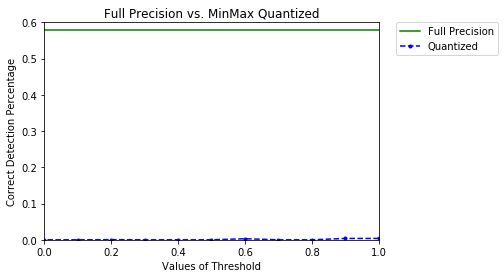

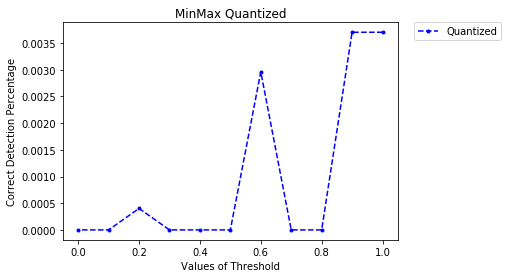

[0.003703932341502562, 0.003703932341502562, 0.0, 0.0, 0.0029631458732020497, 0.0, 0.0, 0.0, 0.00040285451197053407, 0.0, 0.0]


In [11]:
plot_percents("Full Precision vs. MinMax Quantized", minmax_thresholds, minmax_percents, True)
plot_percents("MinMax Quantized", minmax_thresholds, minmax_percents, False)
print(minmax_percents)

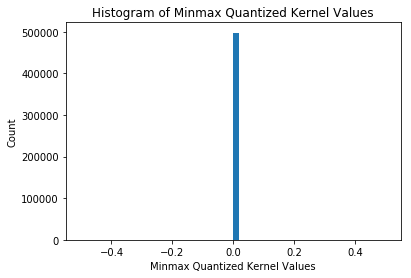

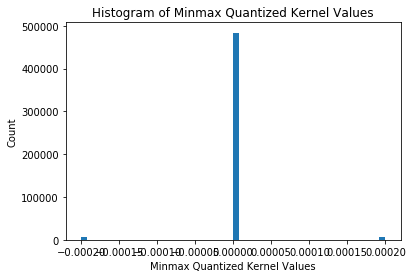

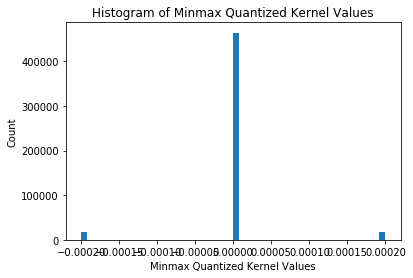

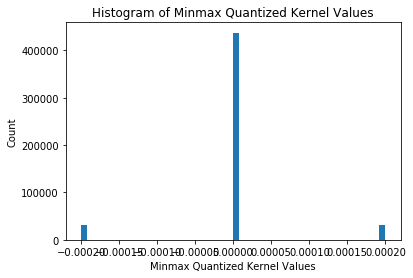

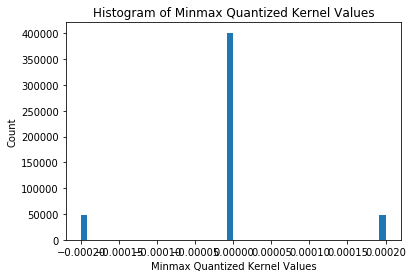

...

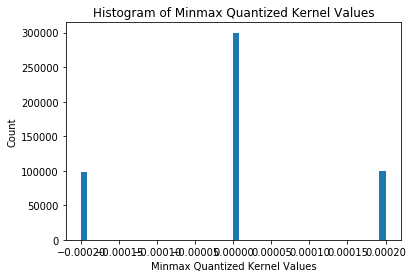

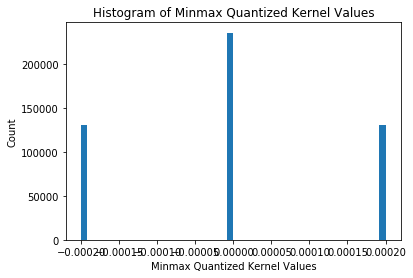

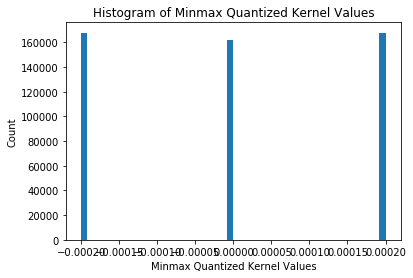

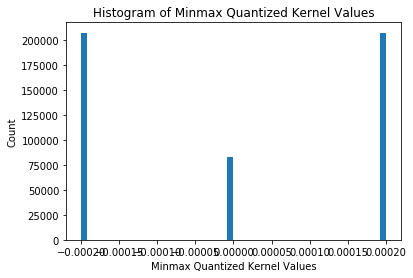

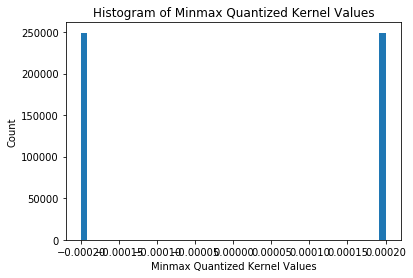

In [22]:
for i in range(num_points):
  plot_histogram(minmax_tensors[i][2], "Histogram of Minmax Quantized Kernel Values", "Minmax Quantized Kernel Values", 50)

In [13]:
std1_thresholds = [1-(0.1)*i for i in range(num_points)]
std1_percents, std1_tensors = hypertune(std1_thresholds, std1)

INFO:tensorflow:Summary name mean iou is illegal; using mean_iou instead.
0 [[[  5.57268722e-05   1.36865187e-04   7.83369542e-05 ...,  -6.38625643e-05
    -1.07648939e-05  -1.18774187e-04]
  [ -8.86089947e-06   2.17330035e-05   4.09551067e-05 ...,  -4.89266495e-05
     1.37085535e-05   5.63604226e-05]
  [ -1.42123492e-04   5.92374563e-05  -1.67995633e-04 ...,  -9.38726080e-05
     1.03482553e-05   1.15282463e-04]
  ..., 
  [  1.78250571e-04  -5.05468815e-05  -9.77857999e-05 ...,   8.02812647e-05
    -6.69439469e-05   4.40586118e-05]
  [  5.89988922e-05   8.29902419e-05   8.89849689e-05 ...,  -8.48034506e-06
    -1.21640667e-04   2.93255925e-05]
  [ -1.58826151e-04  -2.44688363e-05  -4.27703526e-05 ...,  -4.36060072e-05
     8.85854297e-06   5.34432620e-05]]

 [[  3.37054880e-05   6.59726138e-05  -1.35558541e-04 ...,   4.99536472e-05
    -4.90788989e-05  -8.27911572e-05]
  [ -9.68138338e-05  -4.23904094e-05  -8.32343067e-05 ...,  -9.30746319e-05
    -2.17476154e-05  -1.51715503e-04]
  

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.031s detect: 0.209s misc: 0.010s
im_detect: 2/3741 im_read: 0.031s detect: 0.161s misc: 0.010s
im_detect: 3/3741 im_read: 0.031s detect: 0.144s misc: 0.010s
im_detect: 4/3741 im_read: 0.031s detect: 0.137s misc: 0.010s
im_detect: 5/3741 im_read: 0.031s detect: 0.132s misc: 0.010s
im_detect: 6/3741 im_read: 0.031s detect: 0.129s misc: 0.010s
im_detect: 7/3741 im_read: 0.031s detect: 0.127s misc: 0.010s
im_detect: 8/3741 im_read: 0.031s detect: 0.125s misc: 0.010s
im_detect: 9/3741 im_read: 0.031s detect: 0.123s misc: 0.010s
im_detect: 10/3741 im_read: 0.031s detect: 0.123s misc: 0.010s
im_detect: 11/3741 im_read: 0.031s detect: 0.122s misc: 0.010s
im_detect: 12/3741 im_read: 0.031s detect: 0.121s misc: 0.010s
im_detect: 13/3741 im_read: 0.031s detect: 0.120s misc: 0.010s
im_detect: 14/3741 im_read: 0.031s detect: 0.120s misc: 0.010s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.031s detect: 0.113s misc: 0.010s
im_detect: 132/3741 im_read: 0.031s detect: 0.113s misc: 0.010s
im_detect: 133/3741 im_read: 0.031s detect: 0.113s misc: 0.010s
im_detect: 134/3741 im_read: 0.031s detect: 0.113s misc: 0.010s
im_detect: 135/3741 im_read: 0.031s detect: 0.113s misc: 0.010s
im_detect: 136/3741 im_read: 0.031s detect: 0.113s misc: 0.010s
im_detect: 137/3741 im_read: 0.031s detect: 0.113s misc: 0.010s
im_detect: 138/3741 im_read: 0.031s detect: 0.113s misc: 0.010s
im_detect: 139/3741 im_read: 0.031s detect: 0.113s misc: 0.010s
im_detect: 140/3741 im_read: 0.031s detect: 0.113s misc: 0.010s
im_detect: 141/3741 im_read: 0.031s detect: 0.113s misc: 0.010s
im_detect: 142/3741 im_read: 0.031s detect: 0.113s misc: 0.010s
im_detect: 143/3741 im_read: 0.031s detect: 0.113s misc: 0.010s
im_detect: 144/3741 im_read: 0.031s detect: 0.113s misc: 0.010s
im_detect: 145/3741 im_read: 0.031s detect: 0.113s misc: 0.010s
im_detect: 146/3741 im_read: 0.031s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 262/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 263/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 264/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 265/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 266/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 267/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 268/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 269/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 270/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 271/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 272/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 273/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 274/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 275/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 391/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 392/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 393/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 394/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 395/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 396/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 397/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 398/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 399/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 400/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 401/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 402/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 403/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 404/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 405/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 406/3741 im_read: 0.032s dete

im_detect: 521/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 522/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 523/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 524/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 525/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 526/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 527/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 528/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 529/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 530/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 531/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 532/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 533/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 534/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 535/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 536/3741 im_read: 0.032s dete

im_detect: 651/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 652/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 653/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 654/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 655/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 656/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 657/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 658/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 659/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 660/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 661/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 662/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 663/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 664/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 665/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 666/3741 im_read: 0.032s dete

im_detect: 781/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 782/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 783/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 784/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 785/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 786/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 787/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 788/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 789/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 790/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 791/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 792/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 793/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 794/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 795/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 796/3741 im_read: 0.032s dete

im_detect: 911/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 912/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 913/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 914/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 915/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 916/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 917/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 918/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 919/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 920/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 921/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 922/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 923/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 924/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 925/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 926/3741 im_read: 0.032s dete

im_detect: 1039/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1040/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1041/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1042/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1043/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1044/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1045/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1046/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1047/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1048/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1049/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1050/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1051/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1052/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1053/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1054/3741 im_r

im_detect: 1167/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1168/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1169/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1170/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1171/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1172/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1173/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1174/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1175/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1176/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1177/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1178/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1179/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1180/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1181/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1182/3741 im_r

im_detect: 1295/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1296/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1297/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1298/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1299/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1300/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1301/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1302/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1303/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1304/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1305/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1306/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1307/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1308/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1309/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1310/3741 im_r

im_detect: 1423/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1424/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1425/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1426/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1427/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1428/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1429/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1430/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1431/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1432/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1433/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1434/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1435/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1436/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1437/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1438/3741 im_r

im_detect: 1551/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1552/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1553/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1554/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1555/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1556/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1557/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1558/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1559/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1560/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1561/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1562/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1563/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1564/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1565/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1566/3741 im_r

im_detect: 1679/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1680/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1681/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1682/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1683/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1684/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1685/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1686/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1687/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1688/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1689/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1690/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1691/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1692/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1693/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1694/3741 im_r

im_detect: 1807/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1808/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1809/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1810/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1811/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1812/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1813/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1814/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1815/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1816/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1817/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1818/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1819/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1820/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1821/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1822/3741 im_r

im_detect: 1934/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1935/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1936/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1937/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1938/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1939/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1940/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1941/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1942/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1943/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1944/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1945/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1946/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1947/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1948/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 1949/3741 im_r

im_detect: 2062/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2063/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2064/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2065/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2066/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2067/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2068/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2069/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2070/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2071/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2072/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2073/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2074/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2075/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2076/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2077/3741 im_r

im_detect: 2190/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2191/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2192/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2193/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2194/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2195/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2196/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2197/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2198/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2199/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2200/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2201/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2202/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2203/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2204/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2205/3741 im_r

im_detect: 2318/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2319/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2320/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2321/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2322/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2323/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2324/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2325/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2326/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2327/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2328/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2329/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2330/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2331/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2332/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2333/3741 im_r

im_detect: 2446/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2447/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2448/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2449/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2450/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2451/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2452/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2453/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2454/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2455/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2456/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2457/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2458/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2459/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2460/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2461/3741 im_r

im_detect: 2574/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2575/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2576/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2577/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2578/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2579/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2580/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2581/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2582/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2583/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2584/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2585/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2586/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2587/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2588/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2589/3741 im_r

im_detect: 2702/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2703/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2704/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2705/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2706/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2707/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2708/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2709/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2710/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2711/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2712/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2713/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2714/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2715/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2716/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2717/3741 im_r

im_detect: 2829/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2830/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2831/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2832/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2833/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2834/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2835/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2836/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2837/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2838/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2839/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2840/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2841/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2842/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2843/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2844/3741 im_r

im_detect: 2956/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2957/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2958/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2959/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2960/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2961/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2962/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2963/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2964/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2965/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2966/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2967/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2968/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2969/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2970/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 2971/3741 im_r

im_detect: 3083/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3084/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3085/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3086/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3087/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3088/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3089/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3090/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3091/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3092/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3093/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3094/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3095/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3096/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3097/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3098/3741 im_r

im_detect: 3210/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3211/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3212/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3213/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3214/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3215/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3216/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3217/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3218/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3219/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3220/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3221/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3222/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3223/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3224/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3225/3741 im_r

im_detect: 3338/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3339/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3340/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3341/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3342/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3343/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3344/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3345/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3346/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3347/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3348/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3349/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3350/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3351/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3352/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3353/3741 im_r

im_detect: 3466/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3467/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3468/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3469/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3470/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3471/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3472/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3473/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3474/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3475/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3476/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3477/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3478/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3479/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3480/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3481/3741 im_r

im_detect: 3593/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3594/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3595/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3596/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3597/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3598/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3599/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3600/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3601/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3602/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3603/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3604/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3605/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3606/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3607/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3608/3741 im_r

im_detect: 3721/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3722/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3723/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3724/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3725/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3726/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3727/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3728/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3729/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3730/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3731/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3732/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3733/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3734/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3735/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 3736/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.031s detect: 0.213s misc: 0.010s
im_detect: 2/3741 im_read: 0.032s detect: 0.161s misc: 0.010s
im_detect: 3/3741 im_read: 0.032s detect: 0.146s misc: 0.010s
im_detect: 4/3741 im_read: 0.032s detect: 0.138s misc: 0.010s
im_detect: 5/3741 im_read: 0.032s detect: 0.133s misc: 0.010s
im_detect: 6/3741 im_read: 0.032s detect: 0.129s misc: 0.010s
im_detect: 7/3741 im_read: 0.032s detect: 0.127s misc: 0.010s
im_detect: 8/3741 im_read: 0.032s detect: 0.126s misc: 0.010s
im_detect: 9/3741 im_read: 0.032s detect: 0.124s misc: 0.010s
im_detect: 10/3741 im_read: 0.032s detect: 0.123s misc: 0.010s
im_detect: 11/3741 im_read: 0.032s detect: 0.122s misc: 0.010s
im_detect: 12/3741 im_read: 0.032s detect: 0.121s misc: 0.010s
im_detect: 13/3741 im_read: 0.032s detect: 0.121s misc: 0.010s
im_detect: 14/3741 im_read: 0.032s detect: 0.120s misc: 0.010s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 132/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 133/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 134/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 135/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 136/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 137/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 138/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 139/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 140/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 141/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 142/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 143/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 144/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 145/3741 im_read: 0.032s detect: 0.113s misc: 0.010s
im_detect: 146/3741 im_read: 0.032s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 262/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 263/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 264/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 265/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 266/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 267/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 268/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 269/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 270/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 271/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 272/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 273/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 274/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 275/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 391/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 392/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 393/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 394/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 395/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 396/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 397/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 398/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 399/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 400/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 401/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 402/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 403/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 404/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 405/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 406/3741 im_read: 0.032s dete

im_detect: 521/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 522/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 523/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 524/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 525/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 526/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 527/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 528/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 529/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 530/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 531/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 532/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 533/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 534/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 535/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 536/3741 im_read: 0.032s dete

im_detect: 651/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 652/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 653/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 654/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 655/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 656/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 657/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 658/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 659/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 660/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 661/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 662/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 663/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 664/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 665/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 666/3741 im_read: 0.032s dete

im_detect: 781/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 782/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 783/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 784/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 785/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 786/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 787/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 788/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 789/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 790/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 791/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 792/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 793/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 794/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 795/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 796/3741 im_read: 0.032s dete

im_detect: 911/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 912/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 913/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 914/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 915/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 916/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 917/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 918/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 919/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 920/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 921/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 922/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 923/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 924/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 925/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 926/3741 im_read: 0.032s dete

im_detect: 1039/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1040/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1041/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1042/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1043/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1044/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1045/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1046/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1047/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1048/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1049/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1050/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1051/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1052/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1053/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1054/3741 im_r

im_detect: 1167/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1168/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1169/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1170/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1171/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1172/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1173/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1174/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1175/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1176/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1177/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1178/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1179/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1180/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1181/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1182/3741 im_r

im_detect: 1294/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1295/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1296/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1297/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1298/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1299/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1300/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1301/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1302/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1303/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1304/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1305/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1306/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1307/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1308/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1309/3741 im_r

im_detect: 1422/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1423/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1424/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1425/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1426/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1427/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1428/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1429/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1430/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1431/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1432/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1433/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1434/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1435/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1436/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1437/3741 im_r

im_detect: 1550/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1551/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1552/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1553/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1554/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1555/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1556/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1557/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1558/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1559/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1560/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1561/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1562/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1563/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1564/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1565/3741 im_r

im_detect: 1677/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1678/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1679/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1680/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1681/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1682/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1683/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1684/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1685/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1686/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1687/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1688/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1689/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1690/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1691/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1692/3741 im_r

im_detect: 1804/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1805/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1806/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1807/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1808/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1809/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1810/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1811/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1812/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1813/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1814/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1815/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1816/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1817/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1818/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1819/3741 im_r

im_detect: 1932/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1933/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1934/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1935/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1936/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1937/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1938/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1939/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1940/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1941/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1942/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1943/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1944/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1945/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1946/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1947/3741 im_r

im_detect: 2059/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2060/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2061/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2062/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2063/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2064/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2065/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2066/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2067/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2068/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2069/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2070/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2071/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2072/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2073/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2074/3741 im_r

im_detect: 2187/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2188/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2189/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2190/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2191/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2192/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2193/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2194/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2195/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2196/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2197/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2198/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2199/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2200/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2201/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2202/3741 im_r

im_detect: 2314/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2315/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2316/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2317/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2318/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2319/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2320/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2321/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2322/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2323/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2324/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2325/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2326/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2327/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2328/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 2329/3741 im_r

im_detect: 2441/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2442/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2443/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2444/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2445/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2446/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2447/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2448/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2449/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2450/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2451/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2452/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2453/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2454/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2455/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2456/3741 im_r

im_detect: 2568/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2569/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2570/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2571/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2572/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2573/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2574/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2575/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2576/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2577/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2578/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2579/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2580/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2581/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2582/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2583/3741 im_r

im_detect: 2696/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2697/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2698/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2699/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2700/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2701/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2702/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2703/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2704/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2705/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2706/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2707/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2708/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2709/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2710/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2711/3741 im_r

im_detect: 2824/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2825/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2826/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2827/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2828/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2829/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2830/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2831/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2832/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2833/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2834/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2835/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2836/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2837/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2838/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2839/3741 im_r

im_detect: 2952/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2953/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2954/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2955/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2956/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2957/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2958/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2959/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2960/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2961/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2962/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2963/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2964/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2965/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2966/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 2967/3741 im_r

im_detect: 3080/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3081/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3082/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3083/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3084/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3085/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3086/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3087/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3088/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3089/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3090/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3091/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3092/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3093/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3094/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3095/3741 im_r

im_detect: 3208/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3209/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3210/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3211/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3212/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3213/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3214/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3215/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3216/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3217/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3218/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3219/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3220/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3221/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3222/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3223/3741 im_r

im_detect: 3335/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3336/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3337/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3338/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3339/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3340/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3341/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3342/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3343/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3344/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3345/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3346/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3347/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3348/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3349/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3350/3741 im_r

im_detect: 3463/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3464/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3465/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3466/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3467/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3468/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3469/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3470/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3471/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3472/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3473/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3474/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3475/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3476/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3477/3741 im_read: 0.036s detect: 0.112s misc: 0.010s
im_detect: 3478/3741 im_r

im_detect: 3591/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3592/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3593/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3594/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3595/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3596/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3597/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3598/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3599/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3600/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3601/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3602/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3603/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3604/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3605/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3606/3741 im_r

im_detect: 3718/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3719/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3720/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3721/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3722/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3723/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3724/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3725/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3726/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3727/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3728/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3729/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3730/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3731/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3732/3741 im_read: 0.035s detect: 0.112s misc: 0.010s
im_detect: 3733/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.031s detect: 0.213s misc: 0.011s
im_detect: 2/3741 im_read: 0.031s detect: 0.164s misc: 0.011s
im_detect: 3/3741 im_read: 0.031s detect: 0.146s misc: 0.011s
im_detect: 4/3741 im_read: 0.031s detect: 0.138s misc: 0.011s
im_detect: 5/3741 im_read: 0.031s detect: 0.132s misc: 0.011s
im_detect: 6/3741 im_read: 0.031s detect: 0.129s misc: 0.011s
im_detect: 7/3741 im_read: 0.031s detect: 0.126s misc: 0.011s
im_detect: 8/3741 im_read: 0.031s detect: 0.125s misc: 0.011s
im_detect: 9/3741 im_read: 0.031s detect: 0.123s misc: 0.011s
im_detect: 10/3741 im_read: 0.031s detect: 0.122s misc: 0.011s
im_detect: 11/3741 im_read: 0.031s detect: 0.121s misc: 0.011s
im_detect: 12/3741 im_read: 0.031s detect: 0.120s misc: 0.011s
im_detect: 13/3741 im_read: 0.031s detect: 0.120s misc: 0.011s
im_detect: 14/3741 im_read: 0.031s detect: 0.119s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 132/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 133/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 134/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 135/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 136/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 137/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 138/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 139/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 140/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 141/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 142/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 143/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 144/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 145/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 146/3741 im_read: 0.032s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 262/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 263/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 264/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 265/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 266/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 267/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 268/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 269/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 270/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 271/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 272/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 273/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 274/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 275/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 391/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 392/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 393/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 394/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 395/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 396/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 397/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 398/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 399/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 400/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 401/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 402/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 403/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 404/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 405/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 406/3741 im_read: 0.033s dete

im_detect: 521/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 522/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 523/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 524/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 525/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 526/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 527/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 528/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 529/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 530/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 531/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 532/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 533/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 534/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 535/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 536/3741 im_read: 0.033s dete

im_detect: 651/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 652/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 653/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 654/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 655/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 656/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 657/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 658/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 659/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 660/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 661/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 662/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 663/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 664/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 665/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 666/3741 im_read: 0.033s dete

im_detect: 781/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 782/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 783/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 784/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 785/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 786/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 787/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 788/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 789/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 790/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 791/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 792/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 793/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 794/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 795/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 796/3741 im_read: 0.032s dete

im_detect: 911/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 912/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 913/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 914/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 915/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 916/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 917/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 918/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 919/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 920/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 921/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 922/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 923/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 924/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 925/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 926/3741 im_read: 0.032s dete

im_detect: 1040/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1041/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1042/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1043/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1044/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1045/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1046/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1047/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1048/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1049/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1050/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1051/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1052/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1053/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1054/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1055/3741 im_r

im_detect: 1168/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1169/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1170/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1171/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1172/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1173/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1174/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1175/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1176/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1177/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1178/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1179/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1180/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1181/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1182/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1183/3741 im_r

im_detect: 1296/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1297/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1298/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1299/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1300/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1301/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1302/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1303/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1304/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1305/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1306/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1307/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1308/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1309/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1310/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1311/3741 im_r

im_detect: 1424/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1425/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1426/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1427/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1428/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1429/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1430/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1431/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1432/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1433/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1434/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1435/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1436/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1437/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1438/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1439/3741 im_r

im_detect: 1551/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1552/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1553/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1554/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1555/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1556/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1557/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1558/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1559/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1560/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1561/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1562/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1563/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1564/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1565/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1566/3741 im_r

im_detect: 1678/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1679/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1680/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1681/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1682/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1683/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1684/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1685/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1686/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1687/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1688/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1689/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1690/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1691/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1692/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1693/3741 im_r

im_detect: 1806/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1807/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1808/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1809/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1810/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1811/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1812/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1813/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1814/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1815/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1816/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1817/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1818/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1819/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1820/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1821/3741 im_r

im_detect: 1934/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1935/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1936/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1937/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1938/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1939/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1940/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1941/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1942/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1943/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1944/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1945/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1946/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1947/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1948/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 1949/3741 im_r

im_detect: 2061/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2062/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2063/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2064/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2065/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2066/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2067/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2068/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2069/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2070/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2071/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2072/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2073/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2074/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2075/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2076/3741 im_r

im_detect: 2189/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2190/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2191/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2192/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2193/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2194/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2195/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2196/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2197/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2198/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2199/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2200/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2201/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2202/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2203/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2204/3741 im_r

im_detect: 2316/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2317/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2318/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2319/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2320/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2321/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2322/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2323/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2324/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2325/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2326/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2327/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2328/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2329/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2330/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2331/3741 im_r

im_detect: 2443/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2444/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2445/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2446/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2447/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2448/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2449/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2450/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2451/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2452/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2453/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2454/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2455/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2456/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2457/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2458/3741 im_r

im_detect: 2571/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2572/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2573/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2574/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2575/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2576/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2577/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2578/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2579/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2580/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2581/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2582/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2583/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2584/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2585/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2586/3741 im_r

im_detect: 2699/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2700/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2701/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2702/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2703/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2704/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2705/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2706/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2707/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2708/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2709/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2710/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2711/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2712/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2713/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2714/3741 im_r

im_detect: 2826/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2827/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2828/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2829/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2830/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2831/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2832/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2833/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2834/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2835/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2836/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2837/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2838/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2839/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2840/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2841/3741 im_r

im_detect: 2953/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2954/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2955/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2956/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2957/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2958/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2959/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2960/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2961/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2962/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2963/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2964/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2965/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2966/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2967/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2968/3741 im_r

im_detect: 3080/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3081/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3082/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3083/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3084/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3085/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3086/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3087/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3088/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3089/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3090/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3091/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3092/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3093/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3094/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3095/3741 im_r

im_detect: 3208/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3209/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3210/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3211/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3212/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3213/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3214/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3215/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3216/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3217/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3218/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3219/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3220/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3221/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3222/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3223/3741 im_r

im_detect: 3335/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3336/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3337/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3338/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3339/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3340/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3341/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3342/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3343/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3344/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3345/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3346/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3347/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3348/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3349/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3350/3741 im_r

im_detect: 3462/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3463/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3464/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3465/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3466/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3467/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3468/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3469/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3470/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3471/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3472/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3473/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3474/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3475/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3476/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3477/3741 im_r

im_detect: 3590/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3591/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3592/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3593/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3594/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3595/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3596/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3597/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3598/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3599/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3600/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3601/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3602/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3603/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3604/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3605/3741 im_r

im_detect: 3717/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3718/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3719/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3720/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3721/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3722/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3723/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3724/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3725/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3726/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3727/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3728/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3729/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3730/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3731/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3732/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.032s detect: 0.208s misc: 0.010s
im_detect: 2/3741 im_read: 0.031s detect: 0.160s misc: 0.010s
im_detect: 3/3741 im_read: 0.031s detect: 0.144s misc: 0.010s
im_detect: 4/3741 im_read: 0.032s detect: 0.135s misc: 0.010s
im_detect: 5/3741 im_read: 0.032s detect: 0.130s misc: 0.010s
im_detect: 6/3741 im_read: 0.032s detect: 0.127s misc: 0.010s
im_detect: 7/3741 im_read: 0.032s detect: 0.125s misc: 0.010s
im_detect: 8/3741 im_read: 0.032s detect: 0.123s misc: 0.010s
im_detect: 9/3741 im_read: 0.031s detect: 0.122s misc: 0.010s
im_detect: 10/3741 im_read: 0.031s detect: 0.121s misc: 0.010s
im_detect: 11/3741 im_read: 0.031s detect: 0.121s misc: 0.010s
im_detect: 12/3741 im_read: 0.031s detect: 0.120s misc: 0.010s
im_detect: 13/3741 im_read: 0.031s detect: 0.120s misc: 0.010s
im_detect: 14/3741 im_read: 0.031s detect: 0.119s misc: 0.010s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 132/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 133/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 134/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 135/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 136/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 137/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 138/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 139/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 140/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 141/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 142/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 143/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 144/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 145/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 146/3741 im_read: 0.031s dete

im_detect: 261/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 262/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 263/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 264/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 265/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 266/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 267/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 268/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 269/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 270/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 271/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 272/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 273/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 274/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 275/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 276/3741 im_read: 0.031s dete

im_detect: 391/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 392/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 393/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 394/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 395/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 396/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 397/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 398/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 399/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 400/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 401/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 402/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 403/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 404/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 405/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 406/3741 im_read: 0.031s dete

im_detect: 521/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 522/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 523/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 524/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 525/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 526/3741 im_read: 0.031s detect: 0.112s misc: 0.011s
im_detect: 527/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 528/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 529/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 530/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 531/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 532/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 533/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 534/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 535/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 536/3741 im_read: 0.032s dete

im_detect: 651/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 652/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 653/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 654/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 655/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 656/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 657/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 658/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 659/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 660/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 661/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 662/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 663/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 664/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 665/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 666/3741 im_read: 0.032s dete

im_detect: 781/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 782/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 783/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 784/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 785/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 786/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 787/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 788/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 789/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 790/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 791/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 792/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 793/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 794/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 795/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 796/3741 im_read: 0.032s dete

im_detect: 911/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 912/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 913/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 914/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 915/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 916/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 917/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 918/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 919/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 920/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 921/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 922/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 923/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 924/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 925/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 926/3741 im_read: 0.032s dete

im_detect: 1040/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1041/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1042/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1043/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1044/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1045/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1046/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1047/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1048/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1049/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1050/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1051/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1052/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1053/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1054/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1055/3741 im_r

im_detect: 1167/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1168/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1169/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1170/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1171/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1172/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1173/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1174/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1175/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1176/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1177/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1178/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1179/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1180/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1181/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1182/3741 im_r

im_detect: 1295/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1296/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1297/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1298/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1299/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1300/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1301/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1302/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1303/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1304/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1305/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1306/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1307/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1308/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1309/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1310/3741 im_r

im_detect: 1423/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1424/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1425/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1426/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1427/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1428/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1429/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1430/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1431/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1432/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1433/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1434/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1435/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1436/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1437/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1438/3741 im_r

im_detect: 1551/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1552/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1553/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1554/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1555/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1556/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1557/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1558/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1559/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1560/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1561/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1562/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1563/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1564/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1565/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1566/3741 im_r

im_detect: 1679/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1680/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1681/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1682/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1683/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1684/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1685/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1686/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1687/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1688/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1689/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1690/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1691/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1692/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1693/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1694/3741 im_r

im_detect: 1807/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1808/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1809/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1810/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1811/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1812/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1813/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1814/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1815/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1816/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1817/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1818/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1819/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1820/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1821/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1822/3741 im_r

im_detect: 1935/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1936/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1937/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1938/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1939/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1940/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1941/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1942/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1943/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1944/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1945/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1946/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1947/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1948/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1949/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1950/3741 im_r

im_detect: 2063/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2064/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2065/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2066/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2067/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2068/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2069/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2070/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2071/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2072/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2073/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2074/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2075/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2076/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2077/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2078/3741 im_r

im_detect: 2191/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2192/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2193/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2194/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2195/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2196/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2197/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2198/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2199/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2200/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2201/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2202/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2203/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2204/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2205/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2206/3741 im_r

im_detect: 2319/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2320/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2321/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2322/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2323/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2324/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2325/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2326/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2327/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2328/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2329/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2330/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2331/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2332/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2333/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2334/3741 im_r

im_detect: 2447/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2448/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2449/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2450/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2451/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2452/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2453/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2454/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2455/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2456/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2457/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2458/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2459/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2460/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2461/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2462/3741 im_r

im_detect: 2574/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2575/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2576/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2577/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2578/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2579/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2580/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2581/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2582/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2583/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2584/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2585/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2586/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2587/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2588/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2589/3741 im_r

im_detect: 2702/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2703/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2704/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2705/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2706/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2707/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2708/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2709/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2710/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2711/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2712/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2713/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2714/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2715/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2716/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2717/3741 im_r

im_detect: 2829/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2830/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2831/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2832/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2833/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2834/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2835/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2836/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2837/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2838/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2839/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2840/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2841/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2842/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2843/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2844/3741 im_r

im_detect: 2957/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2958/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2959/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2960/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2961/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2962/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2963/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2964/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2965/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2966/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2967/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2968/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2969/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2970/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2971/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2972/3741 im_r

im_detect: 3084/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3085/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3086/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3087/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3088/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3089/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3090/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3091/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3092/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3093/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3094/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3095/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3096/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3097/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3098/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3099/3741 im_r

im_detect: 3212/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3213/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3214/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3215/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3216/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3217/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3218/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3219/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3220/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3221/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3222/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3223/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3224/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3225/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3226/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3227/3741 im_r

im_detect: 3340/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3341/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3342/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3343/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3344/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3345/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3346/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3347/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3348/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3349/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3350/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3351/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3352/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3353/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3354/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3355/3741 im_r

im_detect: 3468/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3469/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3470/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3471/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3472/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3473/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3474/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3475/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3476/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3477/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3478/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3479/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3480/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3481/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3482/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3483/3741 im_r

im_detect: 3596/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3597/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3598/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3599/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3600/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3601/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3602/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3603/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3604/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3605/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3606/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3607/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3608/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3609/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3610/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3611/3741 im_r

im_detect: 3723/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3724/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3725/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3726/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3727/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3728/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3729/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3730/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3731/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3732/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3733/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3734/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3735/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3736/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3737/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3738/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.031s detect: 0.211s misc: 0.010s
im_detect: 2/3741 im_read: 0.031s detect: 0.162s misc: 0.011s
im_detect: 3/3741 im_read: 0.031s detect: 0.147s misc: 0.011s
im_detect: 4/3741 im_read: 0.031s detect: 0.138s misc: 0.011s
im_detect: 5/3741 im_read: 0.031s detect: 0.132s misc: 0.011s
im_detect: 6/3741 im_read: 0.031s detect: 0.128s misc: 0.011s
im_detect: 7/3741 im_read: 0.031s detect: 0.126s misc: 0.011s
im_detect: 8/3741 im_read: 0.031s detect: 0.124s misc: 0.011s
im_detect: 9/3741 im_read: 0.031s detect: 0.123s misc: 0.011s
im_detect: 10/3741 im_read: 0.031s detect: 0.122s misc: 0.011s
im_detect: 11/3741 im_read: 0.031s detect: 0.121s misc: 0.011s
im_detect: 12/3741 im_read: 0.031s detect: 0.120s misc: 0.011s
im_detect: 13/3741 im_read: 0.031s detect: 0.119s misc: 0.011s
im_detect: 14/3741 im_read: 0.031s detect: 0.119s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 132/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 133/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 134/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 135/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 136/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 137/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 138/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 139/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 140/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 141/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 142/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 143/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 144/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 145/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 146/3741 im_read: 0.033s dete

im_detect: 260/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 261/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 262/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 263/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 264/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 265/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 266/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 267/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 268/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 269/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 270/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 271/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 272/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 273/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 274/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 275/3741 im_read: 0.033s dete

im_detect: 390/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 391/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 392/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 393/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 394/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 395/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 396/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 397/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 398/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 399/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 400/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 401/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 402/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 403/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 404/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 405/3741 im_read: 0.033s dete

im_detect: 520/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 521/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 522/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 523/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 524/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 525/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 526/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 527/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 528/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 529/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 530/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 531/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 532/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 533/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 534/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 535/3741 im_read: 0.033s dete

im_detect: 650/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 651/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 652/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 653/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 654/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 655/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 656/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 657/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 658/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 659/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 660/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 661/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 662/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 663/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 664/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 665/3741 im_read: 0.032s dete

im_detect: 779/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 780/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 781/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 782/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 783/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 784/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 785/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 786/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 787/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 788/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 789/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 790/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 791/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 792/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 793/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 794/3741 im_read: 0.033s dete

im_detect: 909/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 910/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 911/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 912/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 913/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 914/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 915/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 916/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 917/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 918/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 919/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 920/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 921/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 922/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 923/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 924/3741 im_read: 0.033s dete

im_detect: 1037/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1038/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1039/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1040/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1041/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1042/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1043/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1044/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1045/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1046/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1047/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1048/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1049/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1050/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1051/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1052/3741 im_r

im_detect: 1165/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1166/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1167/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1168/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1169/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1170/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1171/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1172/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1173/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1174/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1175/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1176/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1177/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1178/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1179/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1180/3741 im_r

im_detect: 1293/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1294/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1295/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1296/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1297/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1298/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1299/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1300/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1301/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1302/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1303/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1304/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1305/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1306/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1307/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1308/3741 im_r

im_detect: 1421/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1422/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1423/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1424/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1425/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1426/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1427/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1428/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1429/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1430/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1431/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1432/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1433/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1434/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1435/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1436/3741 im_r

im_detect: 1549/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1550/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1551/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1552/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1553/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1554/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1555/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1556/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1557/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1558/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1559/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1560/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1561/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1562/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1563/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1564/3741 im_r

im_detect: 1677/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1678/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1679/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1680/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1681/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1682/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1683/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1684/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1685/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1686/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1687/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1688/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1689/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1690/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1691/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1692/3741 im_r

im_detect: 1805/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1806/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1807/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1808/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1809/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1810/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1811/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1812/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1813/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1814/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1815/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1816/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1817/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1818/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1819/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1820/3741 im_r

im_detect: 1933/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1934/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1935/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1936/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1937/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1938/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1939/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1940/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1941/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1942/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1943/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1944/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1945/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1946/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1947/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1948/3741 im_r

im_detect: 2060/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2061/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2062/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2063/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2064/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2065/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2066/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2067/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2068/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2069/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2070/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2071/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2072/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2073/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2074/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2075/3741 im_r

im_detect: 2188/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2189/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2190/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2191/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2192/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2193/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2194/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2195/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2196/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2197/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2198/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2199/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2200/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2201/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2202/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2203/3741 im_r

im_detect: 2316/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2317/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2318/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2319/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2320/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2321/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2322/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2323/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2324/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2325/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2326/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2327/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2328/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2329/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2330/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2331/3741 im_r

im_detect: 2443/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2444/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2445/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2446/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2447/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2448/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2449/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2450/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2451/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2452/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2453/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2454/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2455/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2456/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2457/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2458/3741 im_r

im_detect: 2571/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2572/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2573/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2574/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2575/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2576/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2577/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2578/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2579/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2580/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2581/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2582/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2583/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2584/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2585/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2586/3741 im_r

im_detect: 2698/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2699/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2700/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2701/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2702/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2703/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2704/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2705/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2706/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2707/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2708/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2709/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2710/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2711/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2712/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2713/3741 im_r

im_detect: 2826/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2827/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2828/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2829/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2830/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2831/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2832/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2833/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2834/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2835/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2836/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2837/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2838/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2839/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2840/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2841/3741 im_r

im_detect: 2954/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2955/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2956/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2957/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2958/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2959/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2960/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2961/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2962/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2963/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2964/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2965/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2966/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2967/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2968/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2969/3741 im_r

im_detect: 3082/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3083/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3084/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3085/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3086/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3087/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3088/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3089/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3090/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3091/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3092/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3093/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3094/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3095/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3096/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3097/3741 im_r

im_detect: 3210/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3211/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3212/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3213/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3214/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3215/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3216/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3217/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3218/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3219/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3220/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3221/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3222/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3223/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3224/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3225/3741 im_r

im_detect: 3337/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3338/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3339/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3340/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3341/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3342/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3343/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3344/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3345/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3346/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3347/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3348/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3349/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3350/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3351/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3352/3741 im_r

im_detect: 3465/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3466/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3467/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3468/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3469/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3470/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3471/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3472/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3473/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3474/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3475/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3476/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3477/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3478/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3479/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3480/3741 im_r

im_detect: 3593/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3594/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3595/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3596/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3597/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3598/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3599/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3600/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3601/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3602/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3603/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3604/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3605/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3606/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3607/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3608/3741 im_r

im_detect: 3721/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3722/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3723/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3724/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3725/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3726/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3727/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3728/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3729/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3730/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3731/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3732/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3733/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3734/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3735/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3736/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.031s detect: 0.211s misc: 0.011s
im_detect: 2/3741 im_read: 0.031s detect: 0.161s misc: 0.011s
im_detect: 3/3741 im_read: 0.031s detect: 0.145s misc: 0.011s
im_detect: 4/3741 im_read: 0.031s detect: 0.136s misc: 0.011s
im_detect: 5/3741 im_read: 0.031s detect: 0.131s misc: 0.011s
im_detect: 6/3741 im_read: 0.032s detect: 0.128s misc: 0.011s
im_detect: 7/3741 im_read: 0.032s detect: 0.126s misc: 0.011s
im_detect: 8/3741 im_read: 0.032s detect: 0.124s misc: 0.011s
im_detect: 9/3741 im_read: 0.032s detect: 0.124s misc: 0.011s
im_detect: 10/3741 im_read: 0.032s detect: 0.123s misc: 0.011s
im_detect: 11/3741 im_read: 0.032s detect: 0.121s misc: 0.011s
im_detect: 12/3741 im_read: 0.050s detect: 0.120s misc: 0.011s
im_detect: 13/3741 im_read: 0.048s detect: 0.120s misc: 0.011s
im_detect: 14/3741 im_read: 0.047s detect: 0.119s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 130/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 131/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 132/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 133/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 134/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 135/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 136/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 137/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 138/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 139/3741 im_read: 0.038s detect: 0.113s misc: 0.011s
im_detect: 140/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 141/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 142/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 143/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 144/3741 im_read: 0.037s detect: 0.113s misc: 0.011s
im_detect: 145/3741 im_read: 0.037s dete

im_detect: 260/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 261/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 262/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 263/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 264/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 265/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 266/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 267/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 268/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 269/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 270/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 271/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 272/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 273/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 274/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 275/3741 im_read: 0.035s dete

im_detect: 390/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 391/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 392/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 393/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 394/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 395/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 396/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 397/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 398/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 399/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 400/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 401/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 402/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 403/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 404/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 405/3741 im_read: 0.034s dete

im_detect: 520/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 521/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 522/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 523/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 524/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 525/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 526/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 527/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 528/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 529/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 530/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 531/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 532/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 533/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 534/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 535/3741 im_read: 0.035s dete

im_detect: 650/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 651/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 652/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 653/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 654/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 655/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 656/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 657/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 658/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 659/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 660/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 661/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 662/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 663/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 664/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 665/3741 im_read: 0.035s dete

im_detect: 779/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 780/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 781/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 782/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 783/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 784/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 785/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 786/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 787/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 788/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 789/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 790/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 791/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 792/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 793/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 794/3741 im_read: 0.035s dete

im_detect: 909/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 910/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 911/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 912/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 913/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 914/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 915/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 916/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 917/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 918/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 919/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 920/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 921/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 922/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 923/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 924/3741 im_read: 0.034s dete

im_detect: 1038/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1039/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1040/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1041/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1042/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1043/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1044/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1045/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1046/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1047/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1048/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1049/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1050/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1051/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1052/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1053/3741 im_r

im_detect: 1165/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1166/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1167/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1168/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1169/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1170/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1171/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1172/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1173/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1174/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1175/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1176/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1177/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1178/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1179/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1180/3741 im_r

im_detect: 1292/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1293/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1294/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1295/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1296/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1297/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1298/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1299/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1300/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1301/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1302/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1303/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1304/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1305/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1306/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1307/3741 im_r

im_detect: 1420/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1421/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1422/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1423/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1424/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1425/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1426/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1427/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1428/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1429/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1430/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1431/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1432/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1433/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1434/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1435/3741 im_r

im_detect: 1548/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1549/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1550/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1551/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1552/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1553/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1554/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1555/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1556/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1557/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1558/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1559/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1560/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1561/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1562/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1563/3741 im_r

im_detect: 1675/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1676/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1677/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1678/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1679/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1680/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1681/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1682/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1683/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1684/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1685/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1686/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1687/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1688/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1689/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1690/3741 im_r

im_detect: 1802/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1803/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1804/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1805/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1806/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1807/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1808/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1809/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1810/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1811/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1812/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1813/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1814/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1815/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1816/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 1817/3741 im_r

im_detect: 1930/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1931/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1932/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1933/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1934/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1935/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1936/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1937/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1938/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1939/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1940/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1941/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1942/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1943/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1944/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 1945/3741 im_r

im_detect: 2058/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2059/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2060/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2061/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2062/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2063/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2064/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2065/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2066/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2067/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2068/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2069/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2070/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2071/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2072/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2073/3741 im_r

im_detect: 2186/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 2187/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 2188/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 2189/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 2190/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 2191/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 2192/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 2193/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 2194/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 2195/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 2196/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 2197/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 2198/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 2199/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 2200/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 2201/3741 im_r

im_detect: 2313/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2314/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2315/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2316/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2317/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2318/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2319/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2320/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2321/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2322/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2323/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2324/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2325/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2326/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2327/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2328/3741 im_r

im_detect: 2441/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2442/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2443/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2444/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2445/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2446/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2447/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2448/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2449/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2450/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2451/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2452/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2453/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2454/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2455/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2456/3741 im_r

im_detect: 2569/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2570/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2571/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2572/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2573/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2574/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2575/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2576/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2577/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2578/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2579/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2580/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2581/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2582/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2583/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2584/3741 im_r

im_detect: 2697/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2698/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2699/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2700/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2701/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2702/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2703/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2704/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2705/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2706/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2707/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2708/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2709/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2710/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2711/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2712/3741 im_r

im_detect: 2825/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2826/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2827/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2828/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2829/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2830/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2831/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2832/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2833/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2834/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2835/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2836/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2837/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2838/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2839/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2840/3741 im_r

im_detect: 2953/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2954/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2955/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2956/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2957/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2958/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2959/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2960/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2961/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2962/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2963/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2964/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2965/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2966/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2967/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 2968/3741 im_r

im_detect: 3080/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3081/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3082/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3083/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3084/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3085/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3086/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3087/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3088/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3089/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3090/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3091/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3092/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3093/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3094/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3095/3741 im_r

im_detect: 3208/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3209/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3210/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3211/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3212/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3213/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3214/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3215/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3216/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3217/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3218/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3219/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3220/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3221/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3222/3741 im_read: 0.035s detect: 0.113s misc: 0.011s
im_detect: 3223/3741 im_r

im_detect: 3335/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3336/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3337/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3338/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3339/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3340/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3341/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3342/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3343/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3344/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3345/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3346/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3347/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3348/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3349/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3350/3741 im_r

im_detect: 3463/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3464/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3465/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3466/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3467/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3468/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3469/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3470/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3471/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3472/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3473/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3474/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3475/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3476/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3477/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 3478/3741 im_r

im_detect: 3591/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3592/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3593/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3594/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3595/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3596/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3597/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3598/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3599/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3600/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3601/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3602/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3603/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3604/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3605/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3606/3741 im_r

im_detect: 3719/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3720/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3721/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3722/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3723/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3724/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3725/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3726/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3727/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3728/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3729/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3730/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3731/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3732/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3733/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3734/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.034s detect: 0.213s misc: 0.011s
im_detect: 2/3741 im_read: 0.033s detect: 0.162s misc: 0.011s
im_detect: 3/3741 im_read: 0.032s detect: 0.146s misc: 0.011s
im_detect: 4/3741 im_read: 0.032s detect: 0.136s misc: 0.011s
im_detect: 5/3741 im_read: 0.032s detect: 0.131s misc: 0.011s
im_detect: 6/3741 im_read: 0.032s detect: 0.128s misc: 0.011s
im_detect: 7/3741 im_read: 0.032s detect: 0.126s misc: 0.011s
im_detect: 8/3741 im_read: 0.032s detect: 0.124s misc: 0.011s
im_detect: 9/3741 im_read: 0.032s detect: 0.123s misc: 0.011s
im_detect: 10/3741 im_read: 0.032s detect: 0.122s misc: 0.011s
im_detect: 11/3741 im_read: 0.032s detect: 0.121s misc: 0.011s
im_detect: 12/3741 im_read: 0.032s detect: 0.120s misc: 0.011s
im_detect: 13/3741 im_read: 0.032s detect: 0.120s misc: 0.011s
im_detect: 14/3741 im_read: 0.032s detect: 0.119s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 132/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 133/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 134/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 135/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 136/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 137/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 138/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 139/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 140/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 141/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 142/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 143/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 144/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 145/3741 im_read: 0.031s detect: 0.113s misc: 0.011s
im_detect: 146/3741 im_read: 0.031s dete

im_detect: 260/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 261/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 262/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 263/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 264/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 265/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 266/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 267/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 268/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 269/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 270/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 271/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 272/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 273/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 274/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 275/3741 im_read: 0.032s dete

im_detect: 389/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 390/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 391/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 392/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 393/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 394/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 395/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 396/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 397/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 398/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 399/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 400/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 401/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 402/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 403/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 404/3741 im_read: 0.033s dete

im_detect: 519/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 520/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 521/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 522/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 523/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 524/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 525/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 526/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 527/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 528/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 529/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 530/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 531/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 532/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 533/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 534/3741 im_read: 0.033s dete

im_detect: 649/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 650/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 651/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 652/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 653/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 654/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 655/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 656/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 657/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 658/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 659/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 660/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 661/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 662/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 663/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 664/3741 im_read: 0.033s dete

im_detect: 778/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 779/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 780/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 781/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 782/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 783/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 784/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 785/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 786/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 787/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 788/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 789/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 790/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 791/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 792/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 793/3741 im_read: 0.033s dete

im_detect: 908/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 909/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 910/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 911/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 912/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 913/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 914/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 915/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 916/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 917/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 918/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 919/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 920/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 921/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 922/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 923/3741 im_read: 0.033s dete

im_detect: 1036/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1037/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1038/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1039/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1040/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1041/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1042/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1043/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1044/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1045/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1046/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1047/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1048/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1049/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1050/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1051/3741 im_r

im_detect: 1164/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1165/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1166/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1167/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1168/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1169/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1170/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1171/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1172/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1173/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1174/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1175/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1176/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1177/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1178/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1179/3741 im_r

im_detect: 1292/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1293/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1294/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1295/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1296/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1297/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1298/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1299/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1300/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1301/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1302/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1303/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1304/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1305/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1306/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1307/3741 im_r

im_detect: 1420/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1421/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1422/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1423/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1424/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1425/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1426/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1427/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1428/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1429/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1430/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1431/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1432/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1433/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1434/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1435/3741 im_r

im_detect: 1548/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1549/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1550/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1551/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1552/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1553/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1554/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1555/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1556/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1557/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1558/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1559/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1560/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1561/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1562/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1563/3741 im_r

im_detect: 1676/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1677/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1678/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1679/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1680/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1681/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1682/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1683/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1684/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1685/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1686/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1687/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1688/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1689/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1690/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1691/3741 im_r

im_detect: 1804/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1805/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1806/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1807/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1808/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1809/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1810/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1811/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1812/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1813/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1814/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1815/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1816/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1817/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1818/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1819/3741 im_r

im_detect: 1932/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1933/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1934/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1935/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1936/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1937/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1938/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1939/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1940/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1941/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1942/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1943/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1944/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1945/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1946/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1947/3741 im_r

im_detect: 2060/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2061/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2062/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2063/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2064/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2065/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2066/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2067/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2068/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2069/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2070/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2071/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2072/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2073/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2074/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2075/3741 im_r

im_detect: 2188/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2189/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2190/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2191/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2192/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2193/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2194/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2195/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2196/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2197/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2198/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2199/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2200/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2201/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2202/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2203/3741 im_r

im_detect: 2316/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2317/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2318/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2319/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2320/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2321/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2322/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2323/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2324/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2325/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2326/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2327/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2328/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2329/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2330/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2331/3741 im_r

im_detect: 2444/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2445/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2446/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2447/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2448/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2449/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2450/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2451/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2452/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2453/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2454/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2455/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2456/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2457/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2458/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2459/3741 im_r

im_detect: 2572/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2573/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2574/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2575/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2576/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2577/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2578/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2579/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2580/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2581/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2582/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2583/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2584/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2585/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2586/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2587/3741 im_r

im_detect: 2700/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2701/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2702/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2703/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2704/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2705/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2706/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2707/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2708/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2709/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2710/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2711/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2712/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2713/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2714/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2715/3741 im_r

im_detect: 2828/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2829/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2830/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2831/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2832/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2833/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2834/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2835/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2836/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2837/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2838/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2839/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2840/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2841/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2842/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2843/3741 im_r

im_detect: 2956/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2957/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2958/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2959/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2960/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2961/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2962/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2963/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2964/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2965/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2966/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2967/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2968/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2969/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2970/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2971/3741 im_r

im_detect: 3084/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3085/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3086/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3087/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3088/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3089/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3090/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3091/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3092/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3093/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3094/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3095/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3096/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3097/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3098/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3099/3741 im_r

im_detect: 3212/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3213/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3214/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3215/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3216/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3217/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3218/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3219/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3220/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3221/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3222/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3223/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3224/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3225/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3226/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3227/3741 im_r

im_detect: 3340/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3341/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3342/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3343/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3344/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3345/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3346/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3347/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3348/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3349/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3350/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3351/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3352/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3353/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3354/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3355/3741 im_r

im_detect: 3468/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3469/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3470/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3471/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3472/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3473/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3474/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3475/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3476/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3477/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3478/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3479/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3480/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3481/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3482/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3483/3741 im_r

im_detect: 3596/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3597/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3598/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3599/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3600/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3601/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3602/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3603/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3604/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3605/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3606/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3607/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3608/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3609/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3610/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3611/3741 im_r

im_detect: 3724/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3725/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3726/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3727/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3728/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3729/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3730/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3731/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3732/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3733/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3734/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3735/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3736/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3737/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3738/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3739/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.033s detect: 0.212s misc: 0.011s
im_detect: 2/3741 im_read: 0.033s detect: 0.160s misc: 0.011s
im_detect: 3/3741 im_read: 0.032s detect: 0.145s misc: 0.011s
im_detect: 4/3741 im_read: 0.032s detect: 0.136s misc: 0.011s
im_detect: 5/3741 im_read: 0.032s detect: 0.132s misc: 0.011s
im_detect: 6/3741 im_read: 0.032s detect: 0.129s misc: 0.011s
im_detect: 7/3741 im_read: 0.032s detect: 0.127s misc: 0.011s
im_detect: 8/3741 im_read: 0.032s detect: 0.125s misc: 0.011s
im_detect: 9/3741 im_read: 0.032s detect: 0.124s misc: 0.011s
im_detect: 10/3741 im_read: 0.032s detect: 0.123s misc: 0.011s
im_detect: 11/3741 im_read: 0.032s detect: 0.122s misc: 0.011s
im_detect: 12/3741 im_read: 0.032s detect: 0.122s misc: 0.011s
im_detect: 13/3741 im_read: 0.032s detect: 0.121s misc: 0.011s
im_detect: 14/3741 im_read: 0.032s detect: 0.120s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 132/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 133/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 134/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 135/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 136/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 137/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 138/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 139/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 140/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 141/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 142/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 143/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 144/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 145/3741 im_read: 0.032s detect: 0.114s misc: 0.011s
im_detect: 146/3741 im_read: 0.032s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 262/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 263/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 264/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 265/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 266/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 267/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 268/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 269/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 270/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 271/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 272/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 273/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 274/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 275/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 390/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 391/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 392/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 393/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 394/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 395/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 396/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 397/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 398/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 399/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 400/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 401/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 402/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 403/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 404/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 405/3741 im_read: 0.032s dete

im_detect: 520/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 521/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 522/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 523/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 524/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 525/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 526/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 527/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 528/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 529/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 530/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 531/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 532/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 533/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 534/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 535/3741 im_read: 0.032s dete

im_detect: 650/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 651/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 652/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 653/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 654/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 655/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 656/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 657/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 658/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 659/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 660/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 661/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 662/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 663/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 664/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 665/3741 im_read: 0.032s dete

im_detect: 780/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 781/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 782/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 783/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 784/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 785/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 786/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 787/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 788/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 789/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 790/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 791/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 792/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 793/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 794/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 795/3741 im_read: 0.033s dete

im_detect: 910/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 911/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 912/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 913/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 914/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 915/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 916/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 917/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 918/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 919/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 920/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 921/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 922/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 923/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 924/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 925/3741 im_read: 0.033s dete

im_detect: 1038/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1039/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1040/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1041/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1042/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1043/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1044/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1045/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1046/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1047/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1048/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1049/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1050/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1051/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1052/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1053/3741 im_r

im_detect: 1166/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1167/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1168/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1169/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1170/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1171/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1172/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1173/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1174/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1175/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1176/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1177/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1178/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1179/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1180/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1181/3741 im_r

im_detect: 1294/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1295/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1296/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1297/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1298/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1299/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1300/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1301/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1302/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1303/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1304/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1305/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1306/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1307/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1308/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1309/3741 im_r

im_detect: 1421/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1422/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1423/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1424/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1425/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1426/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1427/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1428/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1429/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1430/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1431/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1432/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1433/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1434/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1435/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1436/3741 im_r

im_detect: 1549/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1550/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1551/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1552/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1553/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1554/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1555/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1556/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1557/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1558/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1559/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1560/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1561/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1562/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1563/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1564/3741 im_r

im_detect: 1676/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1677/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1678/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1679/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1680/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1681/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1682/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1683/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1684/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1685/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1686/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1687/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1688/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1689/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1690/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1691/3741 im_r

im_detect: 1804/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1805/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1806/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1807/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1808/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1809/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1810/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1811/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1812/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1813/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1814/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1815/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1816/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1817/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1818/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1819/3741 im_r

im_detect: 1932/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1933/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1934/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1935/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1936/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1937/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1938/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1939/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1940/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1941/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1942/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1943/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1944/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1945/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1946/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1947/3741 im_r

im_detect: 2060/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2061/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2062/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2063/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2064/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2065/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2066/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2067/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2068/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2069/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2070/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2071/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2072/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2073/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2074/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2075/3741 im_r

im_detect: 2188/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2189/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2190/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2191/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2192/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2193/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2194/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2195/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2196/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2197/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2198/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2199/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2200/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2201/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2202/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2203/3741 im_r

im_detect: 2315/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2316/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2317/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2318/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2319/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2320/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2321/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2322/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2323/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2324/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2325/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2326/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2327/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2328/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2329/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2330/3741 im_r

im_detect: 2443/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2444/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2445/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2446/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2447/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2448/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2449/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2450/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2451/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2452/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2453/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2454/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2455/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2456/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2457/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2458/3741 im_r

im_detect: 2571/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2572/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2573/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2574/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2575/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2576/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2577/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2578/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2579/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2580/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2581/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2582/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2583/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2584/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2585/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2586/3741 im_r

im_detect: 2699/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2700/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2701/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2702/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2703/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2704/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2705/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2706/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2707/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2708/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2709/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2710/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2711/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2712/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2713/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2714/3741 im_r

im_detect: 2827/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2828/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2829/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2830/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2831/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2832/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2833/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2834/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2835/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2836/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2837/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2838/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2839/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2840/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2841/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2842/3741 im_r

im_detect: 2955/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2956/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2957/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2958/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2959/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2960/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2961/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2962/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2963/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2964/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2965/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2966/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2967/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2968/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2969/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2970/3741 im_r

im_detect: 3083/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3084/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3085/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3086/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3087/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3088/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3089/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3090/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3091/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3092/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3093/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3094/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3095/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3096/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3097/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3098/3741 im_r

im_detect: 3211/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3212/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3213/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3214/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3215/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3216/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3217/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3218/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3219/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3220/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3221/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3222/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3223/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3224/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3225/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3226/3741 im_r

im_detect: 3339/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3340/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3341/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3342/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3343/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3344/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3345/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3346/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3347/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3348/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3349/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3350/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3351/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3352/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3353/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3354/3741 im_r

im_detect: 3467/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3468/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3469/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3470/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3471/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3472/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3473/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3474/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3475/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3476/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3477/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3478/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3479/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3480/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3481/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3482/3741 im_r

im_detect: 3595/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3596/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3597/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3598/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3599/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3600/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3601/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3602/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3603/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3604/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3605/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3606/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3607/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3608/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3609/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3610/3741 im_r

im_detect: 3723/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3724/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3725/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3726/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3727/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3728/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3729/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3730/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3731/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3732/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3733/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3734/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3735/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3736/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3737/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3738/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.031s detect: 0.211s misc: 0.011s
im_detect: 2/3741 im_read: 0.031s detect: 0.163s misc: 0.011s
im_detect: 3/3741 im_read: 0.031s detect: 0.146s misc: 0.011s
im_detect: 4/3741 im_read: 0.031s detect: 0.137s misc: 0.011s
im_detect: 5/3741 im_read: 0.031s detect: 0.132s misc: 0.011s
im_detect: 6/3741 im_read: 0.031s detect: 0.128s misc: 0.011s
im_detect: 7/3741 im_read: 0.031s detect: 0.126s misc: 0.011s
im_detect: 8/3741 im_read: 0.031s detect: 0.125s misc: 0.011s
im_detect: 9/3741 im_read: 0.031s detect: 0.124s misc: 0.011s
im_detect: 10/3741 im_read: 0.031s detect: 0.123s misc: 0.011s
im_detect: 11/3741 im_read: 0.031s detect: 0.122s misc: 0.011s
im_detect: 12/3741 im_read: 0.031s detect: 0.121s misc: 0.011s
im_detect: 13/3741 im_read: 0.031s detect: 0.121s misc: 0.011s
im_detect: 14/3741 im_read: 0.031s detect: 0.120s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 130/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 131/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 132/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 133/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 134/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 135/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 136/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 137/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 138/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 139/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 140/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 141/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 142/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 143/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 144/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 145/3741 im_read: 0.033s dete

im_detect: 259/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 260/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 261/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 262/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 263/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 264/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 265/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 266/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 267/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 268/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 269/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 270/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 271/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 272/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 273/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 274/3741 im_read: 0.033s dete

im_detect: 389/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 390/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 391/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 392/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 393/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 394/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 395/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 396/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 397/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 398/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 399/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 400/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 401/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 402/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 403/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 404/3741 im_read: 0.034s dete

im_detect: 518/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 519/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 520/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 521/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 522/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 523/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 524/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 525/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 526/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 527/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 528/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 529/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 530/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 531/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 532/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 533/3741 im_read: 0.034s dete

im_detect: 647/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 648/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 649/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 650/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 651/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 652/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 653/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 654/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 655/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 656/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 657/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 658/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 659/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 660/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 661/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 662/3741 im_read: 0.034s dete

im_detect: 777/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 778/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 779/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 780/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 781/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 782/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 783/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 784/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 785/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 786/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 787/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 788/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 789/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 790/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 791/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 792/3741 im_read: 0.034s dete

im_detect: 907/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 908/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 909/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 910/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 911/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 912/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 913/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 914/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 915/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 916/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 917/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 918/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 919/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 920/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 921/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 922/3741 im_read: 0.034s dete

im_detect: 1036/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1037/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1038/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1039/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1040/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1041/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1042/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1043/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1044/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1045/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1046/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1047/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1048/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1049/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1050/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1051/3741 im_r

im_detect: 1164/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1165/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1166/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1167/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1168/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1169/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1170/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1171/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1172/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1173/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1174/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1175/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1176/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1177/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1178/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1179/3741 im_r

im_detect: 1292/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1293/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1294/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1295/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1296/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1297/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1298/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1299/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1300/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1301/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1302/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1303/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1304/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1305/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1306/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1307/3741 im_r

im_detect: 1420/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1421/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1422/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1423/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1424/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1425/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1426/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1427/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1428/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1429/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1430/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1431/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1432/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1433/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1434/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1435/3741 im_r

im_detect: 1548/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1549/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1550/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1551/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1552/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1553/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1554/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1555/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1556/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1557/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1558/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1559/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1560/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1561/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1562/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1563/3741 im_r

im_detect: 1676/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1677/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1678/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1679/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1680/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1681/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1682/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1683/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1684/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1685/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1686/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1687/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1688/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1689/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1690/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1691/3741 im_r

im_detect: 1804/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1805/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1806/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1807/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1808/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1809/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1810/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1811/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1812/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1813/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1814/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1815/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1816/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1817/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1818/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1819/3741 im_r

im_detect: 1931/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1932/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1933/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1934/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1935/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1936/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1937/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1938/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1939/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1940/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1941/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1942/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1943/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1944/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1945/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1946/3741 im_r

im_detect: 2059/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2060/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2061/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2062/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2063/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2064/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2065/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2066/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2067/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2068/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2069/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2070/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2071/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2072/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2073/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2074/3741 im_r

im_detect: 2187/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2188/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2189/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2190/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2191/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2192/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2193/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2194/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2195/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2196/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2197/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2198/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2199/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2200/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2201/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2202/3741 im_r

im_detect: 2315/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2316/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2317/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2318/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2319/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2320/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2321/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2322/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2323/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2324/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2325/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2326/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2327/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2328/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2329/3741 im_read: 0.037s detect: 0.112s misc: 0.011s
im_detect: 2330/3741 im_r

im_detect: 2443/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2444/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2445/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2446/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2447/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2448/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2449/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2450/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2451/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2452/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2453/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2454/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2455/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2456/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2457/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2458/3741 im_r

im_detect: 2571/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2572/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2573/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2574/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2575/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2576/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2577/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2578/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2579/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2580/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2581/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2582/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2583/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2584/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2585/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2586/3741 im_r

im_detect: 2699/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2700/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2701/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2702/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2703/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2704/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2705/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2706/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2707/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2708/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2709/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2710/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2711/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2712/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2713/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2714/3741 im_r

im_detect: 2826/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2827/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2828/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2829/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2830/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2831/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2832/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2833/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2834/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2835/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2836/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2837/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2838/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2839/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2840/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2841/3741 im_r

im_detect: 2954/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2955/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2956/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2957/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2958/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2959/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2960/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2961/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2962/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2963/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2964/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2965/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2966/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2967/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2968/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 2969/3741 im_r

im_detect: 3082/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3083/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3084/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3085/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3086/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3087/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3088/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3089/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3090/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3091/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3092/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3093/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3094/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3095/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3096/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3097/3741 im_r

im_detect: 3210/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3211/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3212/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3213/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3214/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3215/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3216/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3217/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3218/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3219/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3220/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3221/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3222/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3223/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3224/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3225/3741 im_r

im_detect: 3338/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3339/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3340/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3341/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3342/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3343/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3344/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3345/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3346/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3347/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3348/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3349/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3350/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3351/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3352/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3353/3741 im_r

im_detect: 3466/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3467/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3468/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3469/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3470/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3471/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3472/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3473/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3474/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3475/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3476/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3477/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3478/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3479/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3480/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3481/3741 im_r

im_detect: 3594/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3595/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3596/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3597/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3598/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3599/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3600/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3601/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3602/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3603/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3604/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3605/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3606/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3607/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3608/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3609/3741 im_r

im_detect: 3722/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3723/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3724/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3725/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3726/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3727/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3728/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3729/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3730/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3731/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3732/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3733/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3734/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3735/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3736/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3737/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.033s detect: 0.214s misc: 0.011s
im_detect: 2/3741 im_read: 0.032s detect: 0.162s misc: 0.011s
im_detect: 3/3741 im_read: 0.032s detect: 0.146s misc: 0.011s
im_detect: 4/3741 im_read: 0.032s detect: 0.137s misc: 0.011s
im_detect: 5/3741 im_read: 0.032s detect: 0.132s misc: 0.011s
im_detect: 6/3741 im_read: 0.032s detect: 0.129s misc: 0.011s
im_detect: 7/3741 im_read: 0.032s detect: 0.126s misc: 0.011s
im_detect: 8/3741 im_read: 0.032s detect: 0.124s misc: 0.011s
im_detect: 9/3741 im_read: 0.032s detect: 0.122s misc: 0.011s
im_detect: 10/3741 im_read: 0.032s detect: 0.121s misc: 0.011s
im_detect: 11/3741 im_read: 0.032s detect: 0.120s misc: 0.011s
im_detect: 12/3741 im_read: 0.032s detect: 0.119s misc: 0.011s
im_detect: 13/3741 im_read: 0.032s detect: 0.119s misc: 0.011s
im_detect: 14/3741 im_read: 0.032s detect: 0.118s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 130/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 131/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 132/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 133/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 134/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 135/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 136/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 137/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 138/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 139/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 140/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 141/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 142/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 143/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 144/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 145/3741 im_read: 0.035s dete

im_detect: 260/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 261/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 262/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 263/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 264/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 265/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 266/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 267/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 268/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 269/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 270/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 271/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 272/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 273/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 274/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 275/3741 im_read: 0.034s dete

im_detect: 390/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 391/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 392/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 393/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 394/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 395/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 396/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 397/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 398/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 399/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 400/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 401/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 402/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 403/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 404/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 405/3741 im_read: 0.033s dete

im_detect: 520/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 521/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 522/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 523/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 524/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 525/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 526/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 527/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 528/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 529/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 530/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 531/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 532/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 533/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 534/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 535/3741 im_read: 0.033s dete

im_detect: 650/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 651/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 652/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 653/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 654/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 655/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 656/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 657/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 658/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 659/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 660/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 661/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 662/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 663/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 664/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 665/3741 im_read: 0.034s dete

im_detect: 780/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 781/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 782/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 783/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 784/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 785/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 786/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 787/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 788/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 789/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 790/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 791/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 792/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 793/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 794/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 795/3741 im_read: 0.033s dete

im_detect: 910/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 911/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 912/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 913/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 914/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 915/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 916/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 917/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 918/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 919/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 920/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 921/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 922/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 923/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 924/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 925/3741 im_read: 0.033s dete

im_detect: 1038/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1039/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1040/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1041/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1042/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1043/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1044/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1045/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1046/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1047/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1048/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1049/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1050/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1051/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1052/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1053/3741 im_r

im_detect: 1166/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1167/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1168/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1169/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1170/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1171/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1172/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1173/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1174/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1175/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1176/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1177/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1178/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1179/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1180/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1181/3741 im_r

im_detect: 1294/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1295/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1296/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1297/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1298/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1299/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1300/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1301/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1302/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1303/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1304/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1305/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1306/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1307/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1308/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1309/3741 im_r

im_detect: 1421/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1422/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1423/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1424/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1425/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1426/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1427/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1428/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1429/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1430/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1431/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1432/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1433/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1434/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1435/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1436/3741 im_r

im_detect: 1548/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1549/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1550/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1551/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1552/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1553/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1554/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1555/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1556/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1557/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1558/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1559/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1560/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1561/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1562/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1563/3741 im_r

im_detect: 1676/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1677/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1678/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1679/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1680/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1681/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1682/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1683/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1684/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1685/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1686/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1687/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1688/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1689/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1690/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1691/3741 im_r

im_detect: 1803/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1804/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1805/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1806/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1807/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1808/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1809/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1810/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1811/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1812/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1813/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1814/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1815/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1816/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1817/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1818/3741 im_r

im_detect: 1930/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1931/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1932/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1933/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1934/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1935/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1936/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1937/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1938/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1939/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1940/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1941/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1942/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1943/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1944/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1945/3741 im_r

im_detect: 2058/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2059/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2060/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2061/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2062/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2063/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2064/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2065/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2066/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2067/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2068/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2069/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2070/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2071/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2072/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2073/3741 im_r

im_detect: 2186/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2187/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2188/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2189/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2190/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2191/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2192/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2193/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2194/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2195/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2196/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2197/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2198/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2199/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2200/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2201/3741 im_r

im_detect: 2314/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2315/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2316/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2317/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2318/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2319/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2320/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2321/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2322/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2323/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2324/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2325/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2326/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2327/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2328/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2329/3741 im_r

im_detect: 2442/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2443/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2444/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2445/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2446/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2447/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2448/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2449/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2450/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2451/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2452/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2453/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2454/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2455/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2456/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2457/3741 im_r

im_detect: 2570/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2571/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2572/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2573/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2574/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2575/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2576/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2577/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2578/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2579/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2580/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2581/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2582/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2583/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2584/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2585/3741 im_r

im_detect: 2698/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2699/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2700/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2701/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2702/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2703/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2704/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2705/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2706/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2707/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2708/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2709/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2710/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2711/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2712/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2713/3741 im_r

im_detect: 2826/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2827/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2828/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2829/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2830/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2831/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2832/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2833/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2834/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2835/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2836/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2837/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2838/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2839/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2840/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2841/3741 im_r

im_detect: 2954/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2955/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2956/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2957/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2958/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2959/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2960/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2961/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2962/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2963/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2964/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2965/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2966/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2967/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2968/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2969/3741 im_r

im_detect: 3082/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3083/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3084/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3085/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3086/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3087/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3088/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3089/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3090/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3091/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3092/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3093/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3094/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3095/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3096/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3097/3741 im_r

im_detect: 3210/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3211/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3212/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3213/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3214/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3215/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3216/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3217/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3218/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3219/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3220/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3221/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3222/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3223/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3224/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3225/3741 im_r

im_detect: 3338/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3339/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3340/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3341/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3342/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3343/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3344/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3345/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3346/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3347/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3348/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3349/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3350/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3351/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3352/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3353/3741 im_r

im_detect: 3466/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3467/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3468/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3469/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3470/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3471/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3472/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3473/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3474/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3475/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3476/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3477/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3478/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3479/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3480/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3481/3741 im_r

im_detect: 3594/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3595/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3596/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3597/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3598/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3599/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3600/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3601/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3602/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3603/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3604/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3605/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3606/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3607/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3608/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3609/3741 im_r

im_detect: 3722/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3723/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3724/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3725/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3726/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3727/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3728/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3729/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3730/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3731/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3732/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3733/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3734/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3735/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3736/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3737/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.030s detect: 0.210s misc: 0.012s
im_detect: 2/3741 im_read: 0.031s detect: 0.160s misc: 0.012s
im_detect: 3/3741 im_read: 0.031s detect: 0.145s misc: 0.012s
im_detect: 4/3741 im_read: 0.031s detect: 0.136s misc: 0.012s
im_detect: 5/3741 im_read: 0.031s detect: 0.131s misc: 0.012s
im_detect: 6/3741 im_read: 0.031s detect: 0.128s misc: 0.012s
im_detect: 7/3741 im_read: 0.032s detect: 0.127s misc: 0.012s
im_detect: 8/3741 im_read: 0.031s detect: 0.125s misc: 0.012s
im_detect: 9/3741 im_read: 0.031s detect: 0.123s misc: 0.012s
im_detect: 10/3741 im_read: 0.031s detect: 0.122s misc: 0.012s
im_detect: 11/3741 im_read: 0.031s detect: 0.121s misc: 0.012s
im_detect: 12/3741 im_read: 0.031s detect: 0.121s misc: 0.012s
im_detect: 13/3741 im_read: 0.031s detect: 0.120s misc: 0.012s
im_detect: 14/3741 im_read: 0.031s detect: 0.120s misc: 0.012s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 132/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 133/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 134/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 135/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 136/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 137/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 138/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 139/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 140/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 141/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 142/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 143/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 144/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 145/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 146/3741 im_read: 0.032s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 262/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 263/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 264/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 265/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 266/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 267/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 268/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 269/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 270/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 271/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 272/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 273/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 274/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 275/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 391/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 392/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 393/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 394/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 395/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 396/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 397/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 398/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 399/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 400/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 401/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 402/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 403/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 404/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 405/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 406/3741 im_read: 0.032s dete

im_detect: 521/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 522/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 523/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 524/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 525/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 526/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 527/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 528/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 529/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 530/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 531/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 532/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 533/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 534/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 535/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 536/3741 im_read: 0.032s dete

im_detect: 651/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 652/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 653/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 654/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 655/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 656/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 657/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 658/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 659/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 660/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 661/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 662/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 663/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 664/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 665/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 666/3741 im_read: 0.032s dete

im_detect: 781/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 782/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 783/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 784/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 785/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 786/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 787/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 788/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 789/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 790/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 791/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 792/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 793/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 794/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 795/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 796/3741 im_read: 0.032s dete

im_detect: 911/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 912/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 913/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 914/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 915/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 916/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 917/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 918/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 919/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 920/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 921/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 922/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 923/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 924/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 925/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 926/3741 im_read: 0.032s dete

im_detect: 1039/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1040/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1041/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1042/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1043/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1044/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1045/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1046/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1047/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1048/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1049/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1050/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1051/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1052/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1053/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1054/3741 im_r

im_detect: 1167/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1168/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1169/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1170/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1171/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1172/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1173/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1174/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1175/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1176/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1177/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1178/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1179/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1180/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1181/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1182/3741 im_r

im_detect: 1295/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1296/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1297/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1298/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1299/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1300/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1301/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1302/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1303/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1304/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1305/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1306/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1307/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1308/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1309/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1310/3741 im_r

im_detect: 1423/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1424/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1425/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1426/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1427/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1428/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1429/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1430/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1431/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1432/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1433/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1434/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1435/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1436/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1437/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1438/3741 im_r

im_detect: 1551/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1552/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1553/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1554/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1555/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1556/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1557/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1558/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1559/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1560/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1561/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1562/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1563/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1564/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1565/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1566/3741 im_r

im_detect: 1679/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1680/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1681/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1682/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1683/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1684/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1685/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1686/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1687/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1688/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1689/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1690/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1691/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1692/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1693/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1694/3741 im_r

im_detect: 1807/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1808/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1809/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1810/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1811/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1812/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1813/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1814/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1815/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1816/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1817/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1818/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1819/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1820/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1821/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1822/3741 im_r

im_detect: 1935/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1936/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1937/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1938/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1939/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1940/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1941/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1942/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1943/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1944/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1945/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1946/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1947/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1948/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1949/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1950/3741 im_r

im_detect: 2063/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2064/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2065/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2066/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2067/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2068/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2069/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2070/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2071/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2072/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2073/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2074/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2075/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2076/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2077/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2078/3741 im_r

im_detect: 2191/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2192/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2193/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2194/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2195/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2196/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2197/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2198/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2199/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2200/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2201/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2202/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2203/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2204/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2205/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2206/3741 im_r

im_detect: 2319/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2320/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2321/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2322/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2323/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2324/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2325/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2326/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2327/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2328/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2329/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2330/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2331/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2332/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2333/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2334/3741 im_r

im_detect: 2447/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2448/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2449/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2450/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2451/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2452/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2453/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2454/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2455/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2456/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2457/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2458/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2459/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2460/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2461/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2462/3741 im_r

im_detect: 2575/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2576/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2577/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2578/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2579/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2580/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2581/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2582/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2583/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2584/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2585/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2586/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2587/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2588/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2589/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2590/3741 im_r

im_detect: 2703/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2704/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2705/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2706/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2707/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2708/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2709/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2710/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2711/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2712/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2713/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2714/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2715/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2716/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2717/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2718/3741 im_r

im_detect: 2831/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2832/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2833/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2834/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2835/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2836/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2837/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2838/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2839/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2840/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2841/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2842/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2843/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2844/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2845/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2846/3741 im_r

im_detect: 2959/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2960/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2961/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2962/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2963/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2964/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2965/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2966/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2967/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2968/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2969/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2970/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2971/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2972/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2973/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2974/3741 im_r

im_detect: 3086/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3087/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3088/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3089/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3090/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3091/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3092/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3093/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3094/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3095/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3096/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3097/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3098/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3099/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3100/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3101/3741 im_r

im_detect: 3214/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3215/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3216/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3217/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3218/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3219/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3220/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3221/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3222/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3223/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3224/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3225/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3226/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3227/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3228/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3229/3741 im_r

im_detect: 3342/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3343/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3344/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3345/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3346/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3347/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3348/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3349/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3350/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3351/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3352/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3353/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3354/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3355/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3356/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3357/3741 im_r

im_detect: 3470/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3471/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3472/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3473/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3474/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3475/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3476/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3477/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3478/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3479/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3480/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3481/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3482/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3483/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3484/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3485/3741 im_r

im_detect: 3598/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3599/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3600/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3601/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3602/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3603/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3604/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3605/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3606/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3607/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3608/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3609/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3610/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3611/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3612/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3613/3741 im_r

im_detect: 3726/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3727/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3728/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3729/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3730/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3731/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3732/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3733/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3734/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3735/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3736/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3737/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3738/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3739/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3740/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3741/3741 im_r

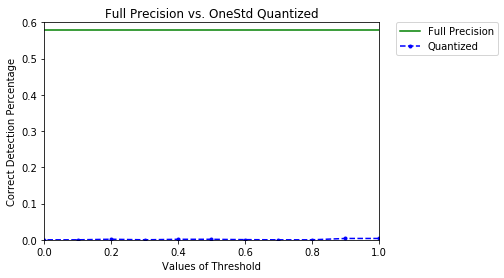

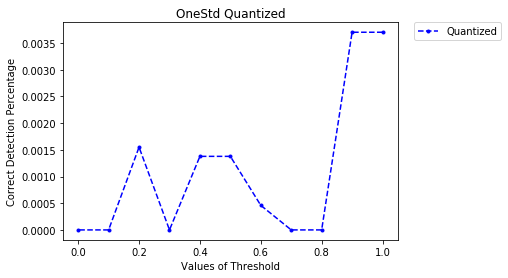

[0.003703932341502562, 0.003703932341502562, 0.0, 0.0, 0.0004601403428045554, 0.0013784389179254495, 0.0013784389179254495, 0.0, 0.0015504766280004594, 0.0, 0.0]


In [14]:
plot_percents("Full Precision vs. OneStd Quantized", std1_thresholds, std1_percents, True)
plot_percents("OneStd Quantized", std1_thresholds, std1_percents, False)
print(std1_percents)

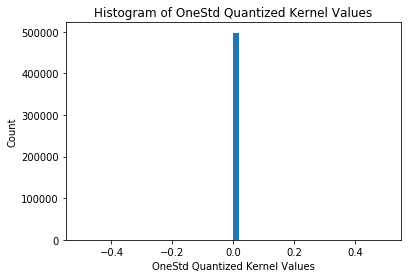

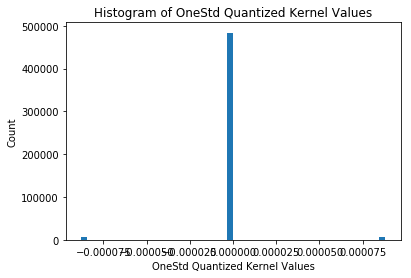

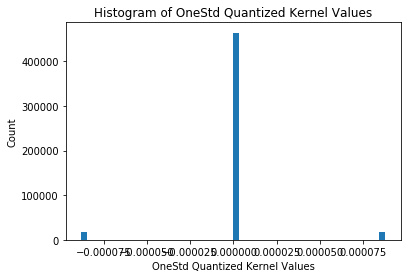

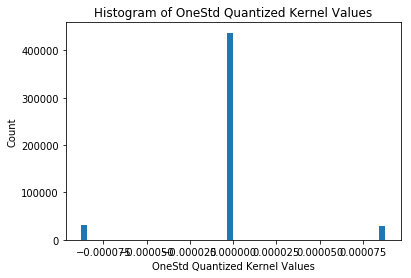

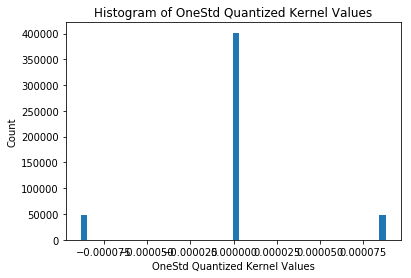

...

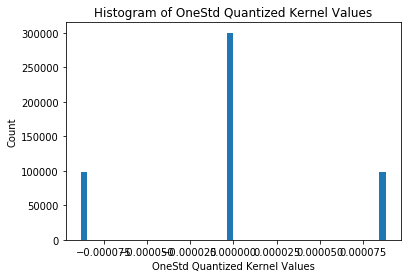

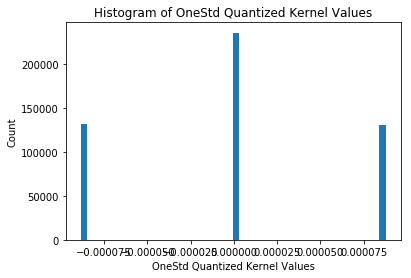

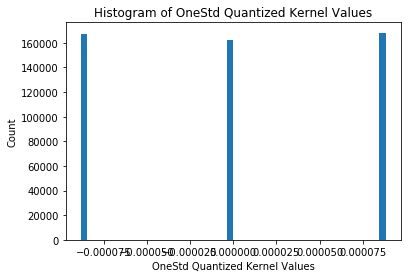

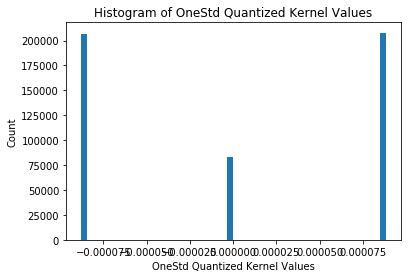

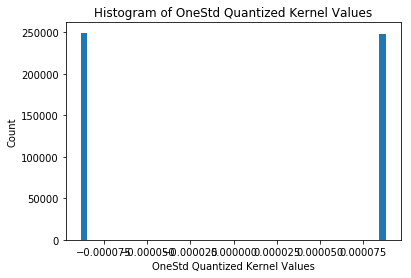

In [15]:
for i in range(num_points):
  plot_histogram(std1_tensors[i][2], "Histogram of OneStd Quantized Kernel Values", "OneStd Quantized Kernel Values", 50)

In [16]:
std2_thresholds = [1-(0.1)*i for i in range(num_points)]
std2_percents, std2_tensors = hypertune(std2_thresholds, std2)

INFO:tensorflow:Summary name mean iou is illegal; using mean_iou instead.
0 [[[  9.11889219e-05  -5.00240712e-05   7.18043375e-05 ...,  -1.16706629e-04
    -4.32836441e-06   6.08137525e-05]
  [  6.42383668e-07  -7.78232861e-05   8.12309590e-05 ...,  -7.21031683e-05
     1.89042272e-04   8.20041023e-05]
  [ -5.56227533e-05   7.26913859e-05  -6.13947195e-05 ...,   6.65387802e-07
    -1.28295811e-04  -7.35842987e-05]
  ..., 
  [  4.01582038e-05  -1.97821446e-05  -5.62347886e-05 ...,  -6.88511936e-05
     8.25433108e-06  -1.10638639e-05]
  [  2.02022220e-05  -4.88120932e-05  -7.00639357e-05 ...,   8.69823125e-05
     5.10356658e-05  -1.79165101e-04]
  [  2.18319747e-06   4.57646529e-05   7.69750550e-05 ...,  -7.38109302e-05
     5.26693693e-05   9.01595195e-05]]

 [[  4.89286140e-05   1.08354623e-04  -9.10446397e-05 ...,  -7.53878840e-06
    -1.36973948e-04   3.51761228e-05]
  [  7.82944262e-05  -1.17326337e-04   1.05641229e-04 ...,  -7.75439839e-05
     6.94527916e-05   1.90902618e-04]
  

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.032s detect: 0.213s misc: 0.010s
im_detect: 2/3741 im_read: 0.032s detect: 0.165s misc: 0.010s
im_detect: 3/3741 im_read: 0.031s detect: 0.148s misc: 0.010s
im_detect: 4/3741 im_read: 0.031s detect: 0.138s misc: 0.010s
im_detect: 5/3741 im_read: 0.031s detect: 0.133s misc: 0.010s
im_detect: 6/3741 im_read: 0.031s detect: 0.129s misc: 0.010s
im_detect: 7/3741 im_read: 0.031s detect: 0.127s misc: 0.010s
im_detect: 8/3741 im_read: 0.031s detect: 0.125s misc: 0.010s
im_detect: 9/3741 im_read: 0.031s detect: 0.123s misc: 0.010s
im_detect: 10/3741 im_read: 0.031s detect: 0.122s misc: 0.010s
im_detect: 11/3741 im_read: 0.031s detect: 0.121s misc: 0.010s
im_detect: 12/3741 im_read: 0.031s detect: 0.121s misc: 0.010s
im_detect: 13/3741 im_read: 0.031s detect: 0.120s misc: 0.010s
im_detect: 14/3741 im_read: 0.031s detect: 0.119s misc: 0.010s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.031s detect: 0.112s misc: 0.010s
im_detect: 132/3741 im_read: 0.031s detect: 0.112s misc: 0.010s
im_detect: 133/3741 im_read: 0.031s detect: 0.112s misc: 0.010s
im_detect: 134/3741 im_read: 0.031s detect: 0.112s misc: 0.010s
im_detect: 135/3741 im_read: 0.031s detect: 0.112s misc: 0.010s
im_detect: 136/3741 im_read: 0.031s detect: 0.112s misc: 0.010s
im_detect: 137/3741 im_read: 0.031s detect: 0.112s misc: 0.010s
im_detect: 138/3741 im_read: 0.031s detect: 0.112s misc: 0.010s
im_detect: 139/3741 im_read: 0.031s detect: 0.112s misc: 0.010s
im_detect: 140/3741 im_read: 0.031s detect: 0.112s misc: 0.010s
im_detect: 141/3741 im_read: 0.031s detect: 0.112s misc: 0.010s
im_detect: 142/3741 im_read: 0.031s detect: 0.112s misc: 0.010s
im_detect: 143/3741 im_read: 0.031s detect: 0.112s misc: 0.010s
im_detect: 144/3741 im_read: 0.031s detect: 0.112s misc: 0.010s
im_detect: 145/3741 im_read: 0.031s detect: 0.112s misc: 0.010s
im_detect: 146/3741 im_read: 0.031s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 262/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 263/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 264/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 265/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 266/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 267/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 268/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 269/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 270/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 271/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 272/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 273/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 274/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 275/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 391/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 392/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 393/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 394/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 395/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 396/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 397/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 398/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 399/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 400/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 401/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 402/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 403/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 404/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 405/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 406/3741 im_read: 0.032s dete

im_detect: 521/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 522/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 523/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 524/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 525/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 526/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 527/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 528/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 529/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 530/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 531/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 532/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 533/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 534/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 535/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 536/3741 im_read: 0.032s dete

im_detect: 651/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 652/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 653/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 654/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 655/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 656/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 657/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 658/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 659/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 660/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 661/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 662/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 663/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 664/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 665/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 666/3741 im_read: 0.032s dete

im_detect: 781/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 782/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 783/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 784/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 785/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 786/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 787/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 788/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 789/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 790/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 791/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 792/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 793/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 794/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 795/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 796/3741 im_read: 0.032s dete

im_detect: 911/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 912/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 913/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 914/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 915/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 916/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 917/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 918/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 919/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 920/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 921/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 922/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 923/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 924/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 925/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 926/3741 im_read: 0.032s dete

im_detect: 1039/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1040/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1041/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1042/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1043/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1044/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1045/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1046/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1047/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1048/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1049/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1050/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1051/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1052/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1053/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1054/3741 im_r

im_detect: 1167/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1168/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1169/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1170/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1171/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1172/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1173/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1174/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1175/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1176/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1177/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1178/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1179/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1180/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1181/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1182/3741 im_r

im_detect: 1295/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1296/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1297/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1298/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1299/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1300/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1301/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1302/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1303/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1304/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1305/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1306/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1307/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1308/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1309/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1310/3741 im_r

im_detect: 1423/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1424/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1425/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1426/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1427/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1428/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1429/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1430/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1431/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1432/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1433/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1434/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1435/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1436/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1437/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1438/3741 im_r

im_detect: 1551/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1552/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1553/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1554/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1555/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1556/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1557/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1558/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1559/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1560/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1561/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1562/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1563/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1564/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1565/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1566/3741 im_r

im_detect: 1679/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1680/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1681/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1682/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1683/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1684/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1685/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1686/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1687/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1688/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1689/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1690/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1691/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1692/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1693/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1694/3741 im_r

im_detect: 1806/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1807/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1808/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1809/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1810/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1811/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1812/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1813/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1814/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1815/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1816/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1817/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1818/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1819/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1820/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1821/3741 im_r

im_detect: 1934/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1935/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1936/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1937/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1938/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1939/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1940/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1941/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1942/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1943/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1944/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1945/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1946/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1947/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1948/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 1949/3741 im_r

im_detect: 2062/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2063/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2064/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2065/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2066/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2067/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2068/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2069/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2070/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2071/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2072/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2073/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2074/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2075/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2076/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2077/3741 im_r

im_detect: 2190/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2191/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2192/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2193/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2194/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2195/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2196/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2197/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2198/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2199/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2200/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2201/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2202/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2203/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2204/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2205/3741 im_r

im_detect: 2318/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2319/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2320/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2321/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2322/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2323/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2324/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2325/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2326/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2327/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2328/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2329/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2330/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2331/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2332/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2333/3741 im_r

im_detect: 2445/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2446/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2447/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2448/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2449/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2450/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2451/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2452/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2453/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2454/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2455/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2456/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2457/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2458/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2459/3741 im_read: 0.033s detect: 0.111s misc: 0.010s
im_detect: 2460/3741 im_r

im_detect: 2573/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2574/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2575/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2576/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2577/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2578/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2579/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2580/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2581/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2582/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2583/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2584/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2585/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2586/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2587/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2588/3741 im_r

im_detect: 2701/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2702/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2703/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2704/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2705/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2706/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2707/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2708/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2709/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2710/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2711/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2712/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2713/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2714/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2715/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2716/3741 im_r

im_detect: 2829/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2830/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2831/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2832/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2833/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2834/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2835/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2836/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2837/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2838/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2839/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2840/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2841/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2842/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2843/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2844/3741 im_r

im_detect: 2957/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2958/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2959/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2960/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2961/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2962/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2963/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2964/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2965/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2966/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2967/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2968/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2969/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2970/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2971/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2972/3741 im_r

im_detect: 3085/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3086/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3087/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3088/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3089/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3090/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3091/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3092/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3093/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3094/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3095/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3096/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3097/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3098/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3099/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3100/3741 im_r

im_detect: 3213/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3214/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3215/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3216/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3217/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3218/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3219/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3220/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3221/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3222/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3223/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3224/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3225/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3226/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3227/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3228/3741 im_r

im_detect: 3341/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3342/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3343/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3344/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3345/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3346/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3347/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3348/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3349/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3350/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3351/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3352/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3353/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3354/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3355/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3356/3741 im_r

im_detect: 3469/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3470/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3471/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3472/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3473/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3474/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3475/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3476/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3477/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3478/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3479/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3480/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3481/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3482/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3483/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3484/3741 im_r

im_detect: 3597/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3598/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3599/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3600/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3601/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3602/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3603/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3604/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3605/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3606/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3607/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3608/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3609/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3610/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3611/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3612/3741 im_r

im_detect: 3725/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3726/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3727/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3728/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3729/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3730/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3731/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3732/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3733/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3734/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3735/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3736/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3737/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3738/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3739/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3740/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.031s detect: 0.213s misc: 0.010s
im_detect: 2/3741 im_read: 0.031s detect: 0.165s misc: 0.010s
im_detect: 3/3741 im_read: 0.033s detect: 0.148s misc: 0.010s
im_detect: 4/3741 im_read: 0.032s detect: 0.139s misc: 0.010s
im_detect: 5/3741 im_read: 0.032s detect: 0.133s misc: 0.010s
im_detect: 6/3741 im_read: 0.032s detect: 0.129s misc: 0.010s
im_detect: 7/3741 im_read: 0.032s detect: 0.126s misc: 0.010s
im_detect: 8/3741 im_read: 0.032s detect: 0.124s misc: 0.010s
im_detect: 9/3741 im_read: 0.032s detect: 0.123s misc: 0.010s
im_detect: 10/3741 im_read: 0.032s detect: 0.122s misc: 0.010s
im_detect: 11/3741 im_read: 0.032s detect: 0.121s misc: 0.010s
im_detect: 12/3741 im_read: 0.032s detect: 0.120s misc: 0.010s
im_detect: 13/3741 im_read: 0.031s detect: 0.119s misc: 0.010s
im_detect: 14/3741 im_read: 0.031s detect: 0.119s misc: 0.010s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 132/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 133/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 134/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 135/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 136/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 137/3741 im_read: 0.034s detect: 0.113s misc: 0.010s
im_detect: 138/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 139/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 140/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 141/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 142/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 143/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 144/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 145/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 146/3741 im_read: 0.034s dete

im_detect: 260/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 261/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 262/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 263/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 264/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 265/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 266/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 267/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 268/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 269/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 270/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 271/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 272/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 273/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 274/3741 im_read: 0.034s detect: 0.112s misc: 0.010s
im_detect: 275/3741 im_read: 0.034s dete

im_detect: 390/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 391/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 392/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 393/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 394/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 395/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 396/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 397/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 398/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 399/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 400/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 401/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 402/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 403/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 404/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 405/3741 im_read: 0.033s dete

im_detect: 520/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 521/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 522/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 523/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 524/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 525/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 526/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 527/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 528/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 529/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 530/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 531/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 532/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 533/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 534/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 535/3741 im_read: 0.033s dete

im_detect: 650/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 651/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 652/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 653/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 654/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 655/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 656/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 657/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 658/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 659/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 660/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 661/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 662/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 663/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 664/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 665/3741 im_read: 0.032s dete

im_detect: 780/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 781/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 782/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 783/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 784/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 785/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 786/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 787/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 788/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 789/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 790/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 791/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 792/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 793/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 794/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 795/3741 im_read: 0.032s dete

im_detect: 910/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 911/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 912/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 913/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 914/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 915/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 916/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 917/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 918/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 919/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 920/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 921/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 922/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 923/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 924/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 925/3741 im_read: 0.032s dete

im_detect: 1038/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1039/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1040/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1041/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1042/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1043/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1044/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1045/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1046/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1047/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1048/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1049/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1050/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1051/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1052/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1053/3741 im_r

im_detect: 1166/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1167/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1168/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1169/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1170/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1171/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1172/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1173/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1174/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1175/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1176/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1177/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1178/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1179/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1180/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1181/3741 im_r

im_detect: 1294/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1295/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1296/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1297/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1298/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1299/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1300/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1301/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1302/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1303/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1304/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1305/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1306/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1307/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1308/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1309/3741 im_r

im_detect: 1422/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1423/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1424/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1425/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1426/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1427/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1428/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1429/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1430/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1431/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1432/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1433/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1434/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1435/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1436/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1437/3741 im_r

im_detect: 1550/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1551/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1552/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1553/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1554/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1555/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1556/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1557/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1558/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1559/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1560/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1561/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1562/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1563/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1564/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1565/3741 im_r

im_detect: 1678/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1679/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1680/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1681/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1682/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1683/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1684/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1685/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1686/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1687/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1688/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1689/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1690/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1691/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1692/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1693/3741 im_r

im_detect: 1806/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1807/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1808/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1809/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1810/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1811/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1812/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1813/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1814/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1815/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1816/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1817/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1818/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1819/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1820/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1821/3741 im_r

im_detect: 1934/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1935/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1936/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1937/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1938/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1939/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1940/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1941/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1942/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1943/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1944/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1945/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1946/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1947/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1948/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 1949/3741 im_r

im_detect: 2062/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2063/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2064/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2065/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2066/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2067/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2068/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2069/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2070/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2071/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2072/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2073/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2074/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2075/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2076/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2077/3741 im_r

im_detect: 2190/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2191/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2192/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2193/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2194/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2195/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2196/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2197/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2198/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2199/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2200/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2201/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2202/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2203/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2204/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2205/3741 im_r

im_detect: 2317/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2318/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2319/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2320/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2321/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2322/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2323/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2324/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2325/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2326/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2327/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2328/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2329/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2330/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2331/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2332/3741 im_r

im_detect: 2445/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2446/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2447/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2448/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2449/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2450/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2451/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2452/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2453/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2454/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2455/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2456/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2457/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2458/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2459/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2460/3741 im_r

im_detect: 2573/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2574/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2575/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2576/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2577/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2578/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2579/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2580/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2581/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2582/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2583/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2584/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2585/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2586/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2587/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2588/3741 im_r

im_detect: 2701/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2702/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2703/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2704/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2705/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2706/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2707/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2708/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2709/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2710/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2711/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2712/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2713/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2714/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2715/3741 im_read: 0.033s detect: 0.112s misc: 0.010s
im_detect: 2716/3741 im_r

im_detect: 2829/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2830/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2831/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2832/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2833/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2834/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2835/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2836/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2837/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2838/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2839/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2840/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2841/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2842/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2843/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2844/3741 im_r

im_detect: 2957/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2958/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2959/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2960/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2961/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2962/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2963/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2964/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2965/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2966/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2967/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2968/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2969/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2970/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2971/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 2972/3741 im_r

im_detect: 3085/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3086/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3087/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3088/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3089/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3090/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3091/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3092/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3093/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3094/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3095/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3096/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3097/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3098/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3099/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3100/3741 im_r

im_detect: 3213/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3214/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3215/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3216/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3217/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3218/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3219/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3220/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3221/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3222/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3223/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3224/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3225/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3226/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3227/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3228/3741 im_r

im_detect: 3341/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3342/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3343/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3344/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3345/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3346/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3347/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3348/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3349/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3350/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3351/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3352/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3353/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3354/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3355/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3356/3741 im_r

im_detect: 3468/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3469/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3470/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3471/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3472/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3473/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3474/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3475/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3476/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3477/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3478/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3479/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3480/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3481/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3482/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3483/3741 im_r

im_detect: 3596/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3597/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3598/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3599/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3600/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3601/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3602/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3603/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3604/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3605/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3606/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3607/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3608/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3609/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3610/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3611/3741 im_r

im_detect: 3724/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3725/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3726/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3727/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3728/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3729/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3730/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3731/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3732/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3733/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3734/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3735/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3736/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3737/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3738/3741 im_read: 0.032s detect: 0.112s misc: 0.010s
im_detect: 3739/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.032s detect: 0.218s misc: 0.011s
im_detect: 2/3741 im_read: 0.032s detect: 0.163s misc: 0.011s
im_detect: 3/3741 im_read: 0.032s detect: 0.145s misc: 0.011s
im_detect: 4/3741 im_read: 0.032s detect: 0.136s misc: 0.011s
im_detect: 5/3741 im_read: 0.072s detect: 0.131s misc: 0.011s
im_detect: 6/3741 im_read: 0.065s detect: 0.126s misc: 0.011s
im_detect: 7/3741 im_read: 0.090s detect: 0.124s misc: 0.011s
im_detect: 8/3741 im_read: 0.083s detect: 0.122s misc: 0.011s
im_detect: 9/3741 im_read: 0.077s detect: 0.121s misc: 0.011s
im_detect: 10/3741 im_read: 0.073s detect: 0.120s misc: 0.011s
im_detect: 11/3741 im_read: 0.069s detect: 0.119s misc: 0.011s
im_detect: 12/3741 im_read: 0.066s detect: 0.119s misc: 0.011s
im_detect: 13/3741 im_read: 0.063s detect: 0.118s misc: 0.011s
im_detect: 14/3741 im_read: 0.061s detect: 0.117s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 130/3741 im_read: 0.046s detect: 0.112s misc: 0.011s
im_detect: 131/3741 im_read: 0.046s detect: 0.112s misc: 0.011s
im_detect: 132/3741 im_read: 0.046s detect: 0.112s misc: 0.011s
im_detect: 133/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 134/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 135/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 136/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 137/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 138/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 139/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 140/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 141/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 142/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 143/3741 im_read: 0.044s detect: 0.112s misc: 0.011s
im_detect: 144/3741 im_read: 0.047s detect: 0.112s misc: 0.011s
im_detect: 145/3741 im_read: 0.047s dete

im_detect: 260/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 261/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 262/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 263/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 264/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 265/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 266/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 267/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 268/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 269/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 270/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 271/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 272/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 273/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 274/3741 im_read: 0.045s detect: 0.112s misc: 0.011s
im_detect: 275/3741 im_read: 0.045s dete

im_detect: 389/3741 im_read: 0.042s detect: 0.112s misc: 0.011s
im_detect: 390/3741 im_read: 0.042s detect: 0.112s misc: 0.011s
im_detect: 391/3741 im_read: 0.042s detect: 0.112s misc: 0.011s
im_detect: 392/3741 im_read: 0.042s detect: 0.112s misc: 0.011s
im_detect: 393/3741 im_read: 0.042s detect: 0.112s misc: 0.011s
im_detect: 394/3741 im_read: 0.042s detect: 0.112s misc: 0.011s
im_detect: 395/3741 im_read: 0.042s detect: 0.112s misc: 0.011s
im_detect: 396/3741 im_read: 0.042s detect: 0.112s misc: 0.011s
im_detect: 397/3741 im_read: 0.042s detect: 0.112s misc: 0.011s
im_detect: 398/3741 im_read: 0.042s detect: 0.112s misc: 0.011s
im_detect: 399/3741 im_read: 0.042s detect: 0.112s misc: 0.011s
im_detect: 400/3741 im_read: 0.042s detect: 0.112s misc: 0.011s
im_detect: 401/3741 im_read: 0.042s detect: 0.112s misc: 0.011s
im_detect: 402/3741 im_read: 0.042s detect: 0.112s misc: 0.011s
im_detect: 403/3741 im_read: 0.042s detect: 0.112s misc: 0.011s
im_detect: 404/3741 im_read: 0.042s dete

im_detect: 518/3741 im_read: 0.041s detect: 0.112s misc: 0.011s
im_detect: 519/3741 im_read: 0.041s detect: 0.112s misc: 0.011s
im_detect: 520/3741 im_read: 0.041s detect: 0.112s misc: 0.011s
im_detect: 521/3741 im_read: 0.041s detect: 0.112s misc: 0.011s
im_detect: 522/3741 im_read: 0.041s detect: 0.112s misc: 0.011s
im_detect: 523/3741 im_read: 0.041s detect: 0.112s misc: 0.011s
im_detect: 524/3741 im_read: 0.041s detect: 0.112s misc: 0.011s
im_detect: 525/3741 im_read: 0.041s detect: 0.112s misc: 0.011s
im_detect: 526/3741 im_read: 0.041s detect: 0.112s misc: 0.011s
im_detect: 527/3741 im_read: 0.041s detect: 0.112s misc: 0.011s
im_detect: 528/3741 im_read: 0.041s detect: 0.112s misc: 0.011s
im_detect: 529/3741 im_read: 0.041s detect: 0.112s misc: 0.011s
im_detect: 530/3741 im_read: 0.041s detect: 0.112s misc: 0.011s
im_detect: 531/3741 im_read: 0.041s detect: 0.112s misc: 0.011s
im_detect: 532/3741 im_read: 0.041s detect: 0.112s misc: 0.011s
im_detect: 533/3741 im_read: 0.041s dete

im_detect: 648/3741 im_read: 0.040s detect: 0.112s misc: 0.011s
im_detect: 649/3741 im_read: 0.040s detect: 0.112s misc: 0.011s
im_detect: 650/3741 im_read: 0.039s detect: 0.112s misc: 0.011s
im_detect: 651/3741 im_read: 0.039s detect: 0.112s misc: 0.011s
im_detect: 652/3741 im_read: 0.039s detect: 0.112s misc: 0.011s
im_detect: 653/3741 im_read: 0.039s detect: 0.112s misc: 0.011s
im_detect: 654/3741 im_read: 0.039s detect: 0.112s misc: 0.011s
im_detect: 655/3741 im_read: 0.039s detect: 0.112s misc: 0.011s
im_detect: 656/3741 im_read: 0.039s detect: 0.112s misc: 0.011s
im_detect: 657/3741 im_read: 0.039s detect: 0.112s misc: 0.011s
im_detect: 658/3741 im_read: 0.039s detect: 0.112s misc: 0.011s
im_detect: 659/3741 im_read: 0.039s detect: 0.112s misc: 0.011s
im_detect: 660/3741 im_read: 0.039s detect: 0.112s misc: 0.011s
im_detect: 661/3741 im_read: 0.039s detect: 0.112s misc: 0.011s
im_detect: 662/3741 im_read: 0.039s detect: 0.112s misc: 0.011s
im_detect: 663/3741 im_read: 0.039s dete

im_detect: 778/3741 im_read: 0.038s detect: 0.112s misc: 0.011s
im_detect: 779/3741 im_read: 0.038s detect: 0.112s misc: 0.011s
im_detect: 780/3741 im_read: 0.038s detect: 0.112s misc: 0.011s
im_detect: 781/3741 im_read: 0.038s detect: 0.112s misc: 0.011s
im_detect: 782/3741 im_read: 0.038s detect: 0.112s misc: 0.011s
im_detect: 783/3741 im_read: 0.038s detect: 0.112s misc: 0.011s
im_detect: 784/3741 im_read: 0.038s detect: 0.112s misc: 0.011s
im_detect: 785/3741 im_read: 0.038s detect: 0.112s misc: 0.011s
im_detect: 786/3741 im_read: 0.038s detect: 0.112s misc: 0.011s
im_detect: 787/3741 im_read: 0.038s detect: 0.112s misc: 0.011s
im_detect: 788/3741 im_read: 0.038s detect: 0.112s misc: 0.011s
im_detect: 789/3741 im_read: 0.038s detect: 0.112s misc: 0.011s
im_detect: 790/3741 im_read: 0.038s detect: 0.112s misc: 0.011s
im_detect: 791/3741 im_read: 0.038s detect: 0.112s misc: 0.011s
im_detect: 792/3741 im_read: 0.038s detect: 0.112s misc: 0.011s
im_detect: 793/3741 im_read: 0.038s dete

im_detect: 908/3741 im_read: 0.037s detect: 0.111s misc: 0.011s
im_detect: 909/3741 im_read: 0.037s detect: 0.111s misc: 0.011s
im_detect: 910/3741 im_read: 0.037s detect: 0.111s misc: 0.011s
im_detect: 911/3741 im_read: 0.037s detect: 0.111s misc: 0.011s
im_detect: 912/3741 im_read: 0.037s detect: 0.111s misc: 0.011s
im_detect: 913/3741 im_read: 0.037s detect: 0.111s misc: 0.011s
im_detect: 914/3741 im_read: 0.037s detect: 0.111s misc: 0.011s
im_detect: 915/3741 im_read: 0.037s detect: 0.111s misc: 0.011s
im_detect: 916/3741 im_read: 0.037s detect: 0.111s misc: 0.011s
im_detect: 917/3741 im_read: 0.037s detect: 0.111s misc: 0.011s
im_detect: 918/3741 im_read: 0.037s detect: 0.111s misc: 0.011s
im_detect: 919/3741 im_read: 0.037s detect: 0.111s misc: 0.011s
im_detect: 920/3741 im_read: 0.037s detect: 0.111s misc: 0.011s
im_detect: 921/3741 im_read: 0.037s detect: 0.111s misc: 0.011s
im_detect: 922/3741 im_read: 0.037s detect: 0.111s misc: 0.011s
im_detect: 923/3741 im_read: 0.037s dete

im_detect: 1036/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 1037/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 1038/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 1039/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 1040/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 1041/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 1042/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 1043/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 1044/3741 im_read: 0.036s detect: 0.112s misc: 0.011s
im_detect: 1045/3741 im_read: 0.036s detect: 0.111s misc: 0.011s
im_detect: 1046/3741 im_read: 0.036s detect: 0.111s misc: 0.011s
im_detect: 1047/3741 im_read: 0.036s detect: 0.111s misc: 0.011s
im_detect: 1048/3741 im_read: 0.036s detect: 0.111s misc: 0.011s
im_detect: 1049/3741 im_read: 0.036s detect: 0.111s misc: 0.011s
im_detect: 1050/3741 im_read: 0.036s detect: 0.111s misc: 0.011s
im_detect: 1051/3741 im_r

im_detect: 1163/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1164/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1165/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1166/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1167/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1168/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1169/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1170/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1171/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1172/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1173/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1174/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1175/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1176/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1177/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1178/3741 im_r

im_detect: 1291/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1292/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1293/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1294/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1295/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1296/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1297/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1298/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1299/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1300/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1301/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1302/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1303/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1304/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1305/3741 im_read: 0.036s detect: 0.111s misc: 0.012s
im_detect: 1306/3741 im_r

im_detect: 1419/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1420/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1421/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1422/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1423/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1424/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1425/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1426/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1427/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1428/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1429/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1430/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1431/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1432/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1433/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1434/3741 im_r

im_detect: 1547/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1548/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1549/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1550/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1551/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1552/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1553/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1554/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1555/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1556/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1557/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1558/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1559/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1560/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1561/3741 im_read: 0.035s detect: 0.111s misc: 0.012s
im_detect: 1562/3741 im_r

im_detect: 1675/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 1676/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 1677/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 1678/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 1679/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 1680/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 1681/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 1682/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 1683/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 1684/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 1685/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 1686/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 1687/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 1688/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 1689/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 1690/3741 im_r

im_detect: 1803/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1804/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1805/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1806/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1807/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1808/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1809/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1810/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1811/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1812/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1813/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1814/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1815/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1816/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1817/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1818/3741 im_r

im_detect: 1931/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1932/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1933/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1934/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1935/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1936/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1937/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1938/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1939/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1940/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1941/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1942/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1943/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1944/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1945/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1946/3741 im_r

im_detect: 2059/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2060/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2061/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2062/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2063/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2064/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2065/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2066/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2067/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2068/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2069/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2070/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2071/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2072/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2073/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2074/3741 im_r

im_detect: 2187/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2188/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2189/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2190/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2191/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2192/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2193/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2194/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2195/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2196/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2197/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2198/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2199/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2200/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2201/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2202/3741 im_r

im_detect: 2314/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2315/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2316/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2317/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2318/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2319/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2320/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2321/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2322/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2323/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2324/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2325/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2326/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2327/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2328/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2329/3741 im_r

im_detect: 2442/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2443/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2444/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2445/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2446/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2447/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2448/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2449/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2450/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2451/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2452/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2453/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2454/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2455/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2456/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2457/3741 im_r

im_detect: 2570/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2571/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2572/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2573/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2574/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2575/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2576/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2577/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2578/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2579/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2580/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2581/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2582/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2583/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2584/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2585/3741 im_r

im_detect: 2698/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2699/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2700/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2701/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2702/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2703/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2704/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2705/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2706/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2707/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2708/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2709/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2710/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2711/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2712/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2713/3741 im_r

im_detect: 2826/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2827/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2828/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2829/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2830/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2831/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2832/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2833/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2834/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2835/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2836/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2837/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2838/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2839/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2840/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2841/3741 im_r

im_detect: 2954/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2955/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2956/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2957/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2958/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2959/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2960/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2961/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2962/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2963/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2964/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2965/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2966/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2967/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2968/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2969/3741 im_r

im_detect: 3082/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3083/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3084/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3085/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3086/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3087/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3088/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3089/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3090/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3091/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3092/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3093/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3094/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3095/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3096/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3097/3741 im_r

im_detect: 3210/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3211/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3212/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3213/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3214/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3215/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3216/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3217/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3218/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3219/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3220/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3221/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3222/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3223/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3224/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3225/3741 im_r

im_detect: 3337/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3338/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3339/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3340/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3341/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3342/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3343/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3344/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3345/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3346/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3347/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3348/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3349/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3350/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3351/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3352/3741 im_r

im_detect: 3464/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3465/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3466/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3467/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3468/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3469/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3470/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3471/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3472/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3473/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3474/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3475/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3476/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3477/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3478/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3479/3741 im_r

im_detect: 3592/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3593/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3594/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3595/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3596/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3597/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3598/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3599/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3600/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3601/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3602/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3603/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3604/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3605/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3606/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3607/3741 im_r

im_detect: 3720/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3721/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3722/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3723/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3724/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3725/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3726/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3727/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3728/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3729/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3730/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3731/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3732/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3733/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3734/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3735/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.031s detect: 0.224s misc: 0.010s
im_detect: 2/3741 im_read: 0.031s detect: 0.167s misc: 0.010s
im_detect: 3/3741 im_read: 0.031s detect: 0.148s misc: 0.010s
im_detect: 4/3741 im_read: 0.031s detect: 0.140s misc: 0.010s
im_detect: 5/3741 im_read: 0.031s detect: 0.134s misc: 0.010s
im_detect: 6/3741 im_read: 0.031s detect: 0.131s misc: 0.010s
im_detect: 7/3741 im_read: 0.031s detect: 0.129s misc: 0.010s
im_detect: 8/3741 im_read: 0.031s detect: 0.127s misc: 0.010s
im_detect: 9/3741 im_read: 0.031s detect: 0.126s misc: 0.010s
im_detect: 10/3741 im_read: 0.031s detect: 0.124s misc: 0.010s
im_detect: 11/3741 im_read: 0.031s detect: 0.123s misc: 0.010s
im_detect: 12/3741 im_read: 0.031s detect: 0.122s misc: 0.010s
im_detect: 13/3741 im_read: 0.031s detect: 0.121s misc: 0.010s
im_detect: 14/3741 im_read: 0.031s detect: 0.121s misc: 0.010s
im_detect: 15/3741 im_read: 

im_detect: 130/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 131/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 132/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 133/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 134/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 135/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 136/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 137/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 138/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 139/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 140/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 141/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 142/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 143/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 144/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 145/3741 im_read: 0.033s dete

im_detect: 260/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 261/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 262/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 263/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 264/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 265/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 266/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 267/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 268/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 269/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 270/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 271/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 272/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 273/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 274/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 275/3741 im_read: 0.032s dete

im_detect: 390/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 391/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 392/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 393/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 394/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 395/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 396/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 397/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 398/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 399/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 400/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 401/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 402/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 403/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 404/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 405/3741 im_read: 0.032s dete

im_detect: 520/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 521/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 522/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 523/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 524/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 525/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 526/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 527/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 528/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 529/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 530/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 531/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 532/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 533/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 534/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 535/3741 im_read: 0.032s dete

im_detect: 649/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 650/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 651/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 652/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 653/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 654/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 655/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 656/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 657/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 658/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 659/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 660/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 661/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 662/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 663/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 664/3741 im_read: 0.032s dete

im_detect: 779/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 780/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 781/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 782/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 783/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 784/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 785/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 786/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 787/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 788/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 789/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 790/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 791/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 792/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 793/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 794/3741 im_read: 0.032s dete

im_detect: 909/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 910/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 911/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 912/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 913/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 914/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 915/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 916/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 917/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 918/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 919/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 920/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 921/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 922/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 923/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 924/3741 im_read: 0.032s dete

im_detect: 1037/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1038/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1039/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1040/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1041/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1042/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1043/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1044/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1045/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1046/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1047/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1048/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1049/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1050/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1051/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1052/3741 im_r

im_detect: 1165/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1166/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1167/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1168/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1169/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1170/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1171/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1172/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1173/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1174/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1175/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1176/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1177/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1178/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1179/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1180/3741 im_r

im_detect: 1292/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1293/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1294/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1295/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1296/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1297/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1298/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1299/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1300/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1301/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1302/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1303/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1304/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1305/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1306/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1307/3741 im_r

im_detect: 1420/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1421/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1422/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1423/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1424/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1425/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1426/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1427/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1428/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1429/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1430/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1431/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1432/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1433/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1434/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1435/3741 im_r

im_detect: 1548/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1549/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1550/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1551/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1552/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1553/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1554/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1555/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1556/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1557/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1558/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1559/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1560/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1561/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1562/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1563/3741 im_r

im_detect: 1676/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1677/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1678/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1679/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1680/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1681/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1682/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1683/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1684/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1685/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1686/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1687/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1688/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1689/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1690/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1691/3741 im_r

im_detect: 1804/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1805/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1806/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1807/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1808/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1809/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1810/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1811/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1812/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1813/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1814/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1815/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1816/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1817/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1818/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1819/3741 im_r

im_detect: 1932/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1933/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1934/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1935/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1936/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1937/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1938/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1939/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1940/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1941/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1942/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1943/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1944/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1945/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1946/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1947/3741 im_r

im_detect: 2060/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2061/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2062/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2063/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2064/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2065/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2066/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2067/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2068/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2069/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2070/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2071/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2072/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2073/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2074/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2075/3741 im_r

im_detect: 2188/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2189/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2190/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2191/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2192/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2193/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2194/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2195/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2196/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2197/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2198/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2199/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2200/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2201/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2202/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2203/3741 im_r

im_detect: 2316/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2317/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2318/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2319/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2320/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2321/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2322/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2323/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2324/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2325/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2326/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2327/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2328/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2329/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2330/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2331/3741 im_r

im_detect: 2444/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2445/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2446/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2447/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2448/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2449/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2450/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2451/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2452/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2453/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2454/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2455/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2456/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2457/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2458/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2459/3741 im_r

im_detect: 2572/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2573/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2574/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2575/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2576/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2577/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2578/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2579/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2580/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2581/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2582/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2583/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2584/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2585/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2586/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2587/3741 im_r

im_detect: 2700/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2701/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2702/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2703/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2704/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2705/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2706/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2707/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2708/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2709/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2710/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2711/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2712/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2713/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2714/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2715/3741 im_r

im_detect: 2828/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2829/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2830/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2831/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2832/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2833/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2834/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2835/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2836/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2837/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2838/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2839/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2840/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2841/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2842/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2843/3741 im_r

im_detect: 2956/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2957/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2958/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2959/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2960/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2961/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2962/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2963/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2964/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2965/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2966/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2967/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2968/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2969/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2970/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2971/3741 im_r

im_detect: 3084/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3085/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3086/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3087/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3088/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3089/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3090/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3091/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3092/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3093/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3094/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3095/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3096/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3097/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3098/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3099/3741 im_r

im_detect: 3212/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3213/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3214/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3215/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3216/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3217/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3218/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3219/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3220/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3221/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3222/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3223/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3224/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3225/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3226/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3227/3741 im_r

im_detect: 3340/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3341/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3342/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3343/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3344/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3345/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3346/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3347/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3348/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3349/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3350/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3351/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3352/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3353/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3354/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3355/3741 im_r

im_detect: 3468/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3469/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3470/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3471/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3472/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3473/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3474/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3475/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3476/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3477/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3478/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3479/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3480/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3481/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3482/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3483/3741 im_r

im_detect: 3595/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3596/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3597/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3598/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3599/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3600/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3601/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3602/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3603/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3604/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3605/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3606/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3607/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3608/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3609/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3610/3741 im_r

im_detect: 3723/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3724/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3725/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3726/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3727/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3728/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3729/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3730/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3731/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3732/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3733/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3734/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3735/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3736/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3737/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3738/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.031s detect: 0.216s misc: 0.011s
im_detect: 2/3741 im_read: 0.031s detect: 0.165s misc: 0.011s
im_detect: 3/3741 im_read: 0.031s detect: 0.147s misc: 0.011s
im_detect: 4/3741 im_read: 0.031s detect: 0.138s misc: 0.011s
im_detect: 5/3741 im_read: 0.031s detect: 0.132s misc: 0.011s
im_detect: 6/3741 im_read: 0.032s detect: 0.130s misc: 0.011s
im_detect: 7/3741 im_read: 0.032s detect: 0.127s misc: 0.011s
im_detect: 8/3741 im_read: 0.032s detect: 0.125s misc: 0.011s
im_detect: 9/3741 im_read: 0.032s detect: 0.124s misc: 0.011s
im_detect: 10/3741 im_read: 0.032s detect: 0.122s misc: 0.011s
im_detect: 11/3741 im_read: 0.032s detect: 0.121s misc: 0.011s
im_detect: 12/3741 im_read: 0.032s detect: 0.121s misc: 0.011s
im_detect: 13/3741 im_read: 0.032s detect: 0.120s misc: 0.011s
im_detect: 14/3741 im_read: 0.032s detect: 0.119s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 132/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 133/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 134/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 135/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 136/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 137/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 138/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 139/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 140/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 141/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 142/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 143/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 144/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 145/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 146/3741 im_read: 0.032s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 262/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 263/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 264/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 265/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 266/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 267/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 268/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 269/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 270/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 271/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 272/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 273/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 274/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 275/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 391/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 392/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 393/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 394/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 395/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 396/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 397/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 398/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 399/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 400/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 401/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 402/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 403/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 404/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 405/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 406/3741 im_read: 0.032s dete

im_detect: 521/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 522/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 523/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 524/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 525/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 526/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 527/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 528/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 529/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 530/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 531/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 532/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 533/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 534/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 535/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 536/3741 im_read: 0.032s dete

im_detect: 650/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 651/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 652/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 653/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 654/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 655/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 656/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 657/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 658/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 659/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 660/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 661/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 662/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 663/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 664/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 665/3741 im_read: 0.032s dete

im_detect: 780/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 781/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 782/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 783/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 784/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 785/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 786/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 787/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 788/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 789/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 790/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 791/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 792/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 793/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 794/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 795/3741 im_read: 0.033s dete

im_detect: 910/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 911/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 912/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 913/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 914/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 915/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 916/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 917/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 918/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 919/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 920/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 921/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 922/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 923/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 924/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 925/3741 im_read: 0.033s dete

im_detect: 1039/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1040/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1041/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1042/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1043/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1044/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1045/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1046/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1047/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1048/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1049/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1050/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1051/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1052/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1053/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1054/3741 im_r

im_detect: 1167/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1168/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1169/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1170/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1171/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1172/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1173/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1174/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1175/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1176/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1177/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1178/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1179/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1180/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1181/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1182/3741 im_r

im_detect: 1295/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1296/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1297/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1298/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1299/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1300/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1301/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1302/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1303/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1304/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1305/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1306/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1307/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1308/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1309/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1310/3741 im_r

im_detect: 1423/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1424/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1425/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1426/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1427/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1428/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1429/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1430/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1431/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1432/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1433/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1434/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1435/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1436/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1437/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1438/3741 im_r

im_detect: 1550/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1551/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1552/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1553/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1554/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1555/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1556/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1557/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1558/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1559/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1560/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1561/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1562/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1563/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1564/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1565/3741 im_r

im_detect: 1678/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1679/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1680/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1681/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1682/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1683/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1684/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1685/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1686/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1687/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1688/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1689/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1690/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1691/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1692/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1693/3741 im_r

im_detect: 1806/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1807/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1808/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1809/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1810/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1811/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1812/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1813/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1814/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1815/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1816/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1817/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1818/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1819/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1820/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1821/3741 im_r

im_detect: 1934/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1935/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1936/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1937/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1938/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1939/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1940/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1941/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1942/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1943/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1944/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1945/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1946/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1947/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1948/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1949/3741 im_r

im_detect: 2062/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2063/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2064/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2065/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2066/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2067/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2068/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2069/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2070/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2071/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2072/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2073/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2074/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2075/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2076/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2077/3741 im_r

im_detect: 2190/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2191/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2192/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2193/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2194/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2195/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2196/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2197/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2198/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2199/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2200/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2201/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2202/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2203/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2204/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2205/3741 im_r

im_detect: 2318/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2319/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2320/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2321/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2322/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2323/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2324/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2325/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2326/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2327/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2328/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2329/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2330/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2331/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2332/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2333/3741 im_r

im_detect: 2445/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2446/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2447/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2448/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2449/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2450/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2451/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2452/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2453/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2454/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2455/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2456/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2457/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2458/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2459/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2460/3741 im_r

im_detect: 2573/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2574/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2575/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2576/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2577/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2578/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2579/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2580/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2581/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2582/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2583/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2584/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2585/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2586/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2587/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2588/3741 im_r

im_detect: 2701/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2702/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2703/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2704/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2705/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2706/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2707/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2708/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2709/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2710/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2711/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2712/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2713/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2714/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2715/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2716/3741 im_r

im_detect: 2829/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2830/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2831/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2832/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2833/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2834/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2835/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2836/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2837/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2838/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2839/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2840/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2841/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2842/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2843/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2844/3741 im_r

im_detect: 2957/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2958/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2959/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2960/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2961/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2962/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2963/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2964/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2965/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2966/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2967/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2968/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2969/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2970/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2971/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2972/3741 im_r

im_detect: 3085/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3086/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3087/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3088/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3089/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3090/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3091/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3092/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3093/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3094/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3095/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3096/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3097/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3098/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3099/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3100/3741 im_r

im_detect: 3213/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3214/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3215/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3216/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3217/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3218/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3219/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3220/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3221/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3222/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3223/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3224/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3225/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3226/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3227/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3228/3741 im_r

im_detect: 3341/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3342/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3343/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3344/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3345/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3346/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3347/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3348/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3349/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3350/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3351/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3352/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3353/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3354/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3355/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3356/3741 im_r

im_detect: 3469/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3470/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3471/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3472/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3473/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3474/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3475/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3476/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3477/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3478/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3479/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3480/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3481/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3482/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3483/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3484/3741 im_r

im_detect: 3597/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3598/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3599/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3600/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3601/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3602/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3603/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3604/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3605/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3606/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3607/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3608/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3609/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3610/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3611/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3612/3741 im_r

im_detect: 3725/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3726/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3727/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3728/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3729/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3730/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3731/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3732/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3733/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3734/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3735/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3736/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3737/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3738/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3739/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3740/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.032s detect: 0.216s misc: 0.011s
im_detect: 2/3741 im_read: 0.032s detect: 0.163s misc: 0.011s
im_detect: 3/3741 im_read: 0.032s detect: 0.144s misc: 0.011s
im_detect: 4/3741 im_read: 0.032s detect: 0.135s misc: 0.011s
im_detect: 5/3741 im_read: 0.032s detect: 0.131s misc: 0.011s
im_detect: 6/3741 im_read: 0.032s detect: 0.127s misc: 0.011s
im_detect: 7/3741 im_read: 0.032s detect: 0.125s misc: 0.011s
im_detect: 8/3741 im_read: 0.032s detect: 0.123s misc: 0.011s
im_detect: 9/3741 im_read: 0.032s detect: 0.122s misc: 0.011s
im_detect: 10/3741 im_read: 0.032s detect: 0.120s misc: 0.011s
im_detect: 11/3741 im_read: 0.032s detect: 0.119s misc: 0.011s
im_detect: 12/3741 im_read: 0.032s detect: 0.119s misc: 0.011s
im_detect: 13/3741 im_read: 0.032s detect: 0.118s misc: 0.011s
im_detect: 14/3741 im_read: 0.032s detect: 0.117s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 132/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 133/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 134/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 135/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 136/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 137/3741 im_read: 0.031s detect: 0.111s misc: 0.011s
im_detect: 138/3741 im_read: 0.031s detect: 0.111s misc: 0.011s
im_detect: 139/3741 im_read: 0.031s detect: 0.111s misc: 0.011s
im_detect: 140/3741 im_read: 0.031s detect: 0.111s misc: 0.011s
im_detect: 141/3741 im_read: 0.031s detect: 0.111s misc: 0.011s
im_detect: 142/3741 im_read: 0.031s detect: 0.111s misc: 0.011s
im_detect: 143/3741 im_read: 0.031s detect: 0.111s misc: 0.011s
im_detect: 144/3741 im_read: 0.031s detect: 0.111s misc: 0.011s
im_detect: 145/3741 im_read: 0.031s detect: 0.111s misc: 0.011s
im_detect: 146/3741 im_read: 0.031s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 262/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 263/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 264/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 265/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 266/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 267/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 268/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 269/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 270/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 271/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 272/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 273/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 274/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 275/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 390/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 391/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 392/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 393/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 394/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 395/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 396/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 397/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 398/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 399/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 400/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 401/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 402/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 403/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 404/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 405/3741 im_read: 0.033s dete

im_detect: 520/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 521/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 522/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 523/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 524/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 525/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 526/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 527/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 528/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 529/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 530/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 531/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 532/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 533/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 534/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 535/3741 im_read: 0.035s dete

im_detect: 649/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 650/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 651/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 652/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 653/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 654/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 655/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 656/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 657/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 658/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 659/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 660/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 661/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 662/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 663/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 664/3741 im_read: 0.035s dete

im_detect: 778/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 779/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 780/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 781/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 782/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 783/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 784/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 785/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 786/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 787/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 788/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 789/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 790/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 791/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 792/3741 im_read: 0.035s detect: 0.111s misc: 0.011s
im_detect: 793/3741 im_read: 0.035s dete

im_detect: 908/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 909/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 910/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 911/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 912/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 913/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 914/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 915/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 916/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 917/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 918/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 919/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 920/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 921/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 922/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 923/3741 im_read: 0.034s dete

im_detect: 1036/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1037/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1038/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1039/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1040/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1041/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1042/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1043/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1044/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1045/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1046/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1047/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1048/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1049/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1050/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1051/3741 im_r

im_detect: 1163/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1164/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1165/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1166/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1167/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1168/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1169/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1170/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1171/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1172/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1173/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1174/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1175/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1176/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1177/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1178/3741 im_r

im_detect: 1291/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1292/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1293/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1294/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1295/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1296/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1297/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1298/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1299/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1300/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1301/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1302/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1303/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1304/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1305/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1306/3741 im_r

im_detect: 1419/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1420/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1421/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1422/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1423/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1424/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1425/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1426/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1427/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1428/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1429/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1430/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1431/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1432/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1433/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1434/3741 im_r

im_detect: 1546/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1547/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1548/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1549/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1550/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1551/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1552/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1553/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1554/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1555/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1556/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1557/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1558/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1559/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1560/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1561/3741 im_r

im_detect: 1674/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1675/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1676/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1677/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1678/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1679/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1680/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1681/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1682/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1683/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1684/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1685/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1686/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1687/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1688/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1689/3741 im_r

im_detect: 1802/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1803/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1804/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1805/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1806/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1807/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1808/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1809/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1810/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1811/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1812/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1813/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1814/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1815/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1816/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1817/3741 im_r

im_detect: 1930/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1931/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1932/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1933/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1934/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1935/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1936/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1937/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1938/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1939/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1940/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1941/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1942/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1943/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1944/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 1945/3741 im_r

im_detect: 2058/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2059/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2060/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2061/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2062/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2063/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2064/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2065/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2066/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2067/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2068/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2069/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2070/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2071/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2072/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2073/3741 im_r

im_detect: 2185/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2186/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2187/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2188/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2189/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2190/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2191/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2192/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2193/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2194/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2195/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2196/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2197/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2198/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2199/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2200/3741 im_r

im_detect: 2313/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2314/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2315/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2316/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2317/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2318/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2319/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2320/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2321/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2322/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2323/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2324/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2325/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2326/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2327/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2328/3741 im_r

im_detect: 2441/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2442/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2443/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2444/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2445/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2446/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2447/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2448/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2449/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2450/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2451/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2452/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2453/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2454/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2455/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2456/3741 im_r

im_detect: 2569/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2570/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2571/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2572/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2573/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2574/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2575/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2576/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2577/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2578/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2579/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2580/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2581/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2582/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2583/3741 im_read: 0.034s detect: 0.111s misc: 0.011s
im_detect: 2584/3741 im_r

im_detect: 2697/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2698/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2699/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2700/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2701/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2702/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2703/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2704/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2705/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2706/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2707/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2708/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2709/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2710/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2711/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2712/3741 im_r

im_detect: 2825/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2826/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2827/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2828/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2829/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2830/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2831/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2832/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2833/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2834/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2835/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2836/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2837/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2838/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2839/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2840/3741 im_r

im_detect: 2952/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2953/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2954/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2955/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2956/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2957/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2958/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2959/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2960/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2961/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2962/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2963/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2964/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2965/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2966/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 2967/3741 im_r

im_detect: 3080/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3081/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3082/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3083/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3084/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3085/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3086/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3087/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3088/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3089/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3090/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3091/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3092/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3093/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3094/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3095/3741 im_r

im_detect: 3207/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3208/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3209/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3210/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3211/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3212/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3213/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3214/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3215/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3216/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3217/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3218/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3219/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3220/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3221/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3222/3741 im_r

im_detect: 3335/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3336/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3337/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3338/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3339/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3340/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3341/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3342/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3343/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3344/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3345/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3346/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3347/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3348/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3349/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3350/3741 im_r

im_detect: 3462/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3463/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3464/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3465/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3466/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3467/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3468/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3469/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3470/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3471/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3472/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3473/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3474/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3475/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3476/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3477/3741 im_r

im_detect: 3589/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3590/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3591/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3592/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3593/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3594/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3595/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3596/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3597/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3598/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3599/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3600/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3601/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3602/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3603/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3604/3741 im_r

im_detect: 3717/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3718/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3719/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3720/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3721/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3722/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3723/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3724/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3725/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3726/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3727/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3728/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3729/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3730/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3731/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 3732/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.032s detect: 0.218s misc: 0.011s
im_detect: 2/3741 im_read: 0.032s detect: 0.162s misc: 0.011s
im_detect: 3/3741 im_read: 0.032s detect: 0.146s misc: 0.011s
im_detect: 4/3741 im_read: 0.032s detect: 0.136s misc: 0.011s
im_detect: 5/3741 im_read: 0.032s detect: 0.131s misc: 0.011s
im_detect: 6/3741 im_read: 0.032s detect: 0.127s misc: 0.011s
im_detect: 7/3741 im_read: 0.032s detect: 0.125s misc: 0.011s
im_detect: 8/3741 im_read: 0.032s detect: 0.122s misc: 0.011s
im_detect: 9/3741 im_read: 0.032s detect: 0.122s misc: 0.011s
im_detect: 10/3741 im_read: 0.032s detect: 0.121s misc: 0.011s
im_detect: 11/3741 im_read: 0.032s detect: 0.120s misc: 0.011s
im_detect: 12/3741 im_read: 0.032s detect: 0.119s misc: 0.011s
im_detect: 13/3741 im_read: 0.032s detect: 0.119s misc: 0.011s
im_detect: 14/3741 im_read: 0.032s detect: 0.118s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 132/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 133/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 134/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 135/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 136/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 137/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 138/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 139/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 140/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 141/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 142/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 143/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 144/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 145/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 146/3741 im_read: 0.032s dete

im_detect: 260/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 261/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 262/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 263/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 264/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 265/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 266/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 267/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 268/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 269/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 270/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 271/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 272/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 273/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 274/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 275/3741 im_read: 0.032s dete

im_detect: 390/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 391/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 392/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 393/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 394/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 395/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 396/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 397/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 398/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 399/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 400/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 401/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 402/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 403/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 404/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 405/3741 im_read: 0.032s dete

im_detect: 519/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 520/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 521/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 522/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 523/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 524/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 525/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 526/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 527/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 528/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 529/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 530/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 531/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 532/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 533/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 534/3741 im_read: 0.033s dete

im_detect: 649/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 650/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 651/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 652/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 653/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 654/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 655/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 656/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 657/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 658/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 659/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 660/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 661/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 662/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 663/3741 im_read: 0.033s detect: 0.111s misc: 0.011s
im_detect: 664/3741 im_read: 0.033s dete

im_detect: 779/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 780/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 781/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 782/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 783/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 784/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 785/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 786/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 787/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 788/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 789/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 790/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 791/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 792/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 793/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 794/3741 im_read: 0.032s dete

im_detect: 909/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 910/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 911/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 912/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 913/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 914/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 915/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 916/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 917/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 918/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 919/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 920/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 921/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 922/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 923/3741 im_read: 0.032s detect: 0.111s misc: 0.011s
im_detect: 924/3741 im_read: 0.032s dete

im_detect: 1037/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1038/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1039/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1040/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1041/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1042/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1043/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1044/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1045/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1046/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1047/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1048/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1049/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1050/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1051/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1052/3741 im_r

im_detect: 1164/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1165/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1166/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1167/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1168/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1169/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1170/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1171/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1172/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1173/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1174/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1175/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1176/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1177/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1178/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1179/3741 im_r

im_detect: 1291/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1292/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1293/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1294/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1295/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1296/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1297/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1298/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1299/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1300/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1301/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1302/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1303/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1304/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1305/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1306/3741 im_r

im_detect: 1419/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1420/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1421/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1422/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1423/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1424/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1425/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1426/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1427/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1428/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1429/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1430/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1431/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1432/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1433/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1434/3741 im_r

im_detect: 1547/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1548/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1549/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1550/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1551/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1552/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1553/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1554/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1555/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1556/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1557/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1558/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1559/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1560/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1561/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1562/3741 im_r

im_detect: 1674/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1675/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1676/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1677/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1678/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1679/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1680/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1681/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1682/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1683/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1684/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1685/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1686/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1687/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1688/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1689/3741 im_r

im_detect: 1802/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1803/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1804/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1805/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1806/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1807/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1808/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1809/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1810/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1811/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1812/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1813/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1814/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1815/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1816/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1817/3741 im_r

im_detect: 1929/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1930/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1931/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1932/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1933/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1934/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1935/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1936/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1937/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1938/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1939/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1940/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1941/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1942/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1943/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1944/3741 im_r

im_detect: 2057/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2058/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2059/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2060/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2061/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2062/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2063/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2064/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2065/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2066/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2067/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2068/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2069/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2070/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2071/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2072/3741 im_r

im_detect: 2185/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2186/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2187/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2188/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2189/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2190/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2191/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2192/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2193/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2194/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2195/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2196/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2197/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2198/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2199/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2200/3741 im_r

im_detect: 2313/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2314/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2315/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2316/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2317/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2318/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2319/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2320/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2321/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2322/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2323/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2324/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2325/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2326/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2327/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2328/3741 im_r

im_detect: 2441/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2442/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2443/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2444/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2445/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2446/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2447/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2448/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2449/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2450/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2451/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2452/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2453/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2454/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2455/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2456/3741 im_r

im_detect: 2569/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2570/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2571/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2572/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2573/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2574/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2575/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2576/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2577/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2578/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2579/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2580/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2581/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2582/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2583/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2584/3741 im_r

im_detect: 2697/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2698/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2699/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2700/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2701/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2702/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2703/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2704/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2705/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2706/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2707/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2708/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2709/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2710/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2711/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2712/3741 im_r

im_detect: 2824/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2825/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2826/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2827/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2828/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2829/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2830/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2831/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2832/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2833/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2834/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2835/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2836/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2837/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2838/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2839/3741 im_r

im_detect: 2952/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2953/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2954/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2955/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2956/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2957/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2958/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2959/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2960/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2961/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2962/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2963/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2964/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2965/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2966/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 2967/3741 im_r

im_detect: 3080/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3081/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3082/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3083/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3084/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3085/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3086/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3087/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3088/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3089/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3090/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3091/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3092/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3093/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3094/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3095/3741 im_r

im_detect: 3208/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3209/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3210/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3211/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3212/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3213/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3214/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3215/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3216/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3217/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3218/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3219/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3220/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3221/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3222/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3223/3741 im_r

im_detect: 3336/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3337/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3338/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3339/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3340/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3341/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3342/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3343/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3344/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3345/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3346/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3347/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3348/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3349/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3350/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3351/3741 im_r

im_detect: 3463/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3464/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3465/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3466/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3467/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3468/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3469/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3470/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3471/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3472/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3473/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3474/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3475/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3476/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3477/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3478/3741 im_r

im_detect: 3591/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3592/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3593/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3594/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3595/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3596/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3597/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3598/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3599/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3600/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3601/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3602/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3603/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3604/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3605/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3606/3741 im_r

im_detect: 3718/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3719/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3720/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3721/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3722/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3723/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3724/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3725/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3726/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3727/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3728/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3729/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3730/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3731/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3732/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3733/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.036s detect: 0.257s misc: 0.012s
im_detect: 2/3741 im_read: 0.037s detect: 0.190s misc: 0.012s
im_detect: 3/3741 im_read: 0.036s detect: 0.170s misc: 0.012s
im_detect: 4/3741 im_read: 0.036s detect: 0.155s misc: 0.012s
im_detect: 5/3741 im_read: 0.035s detect: 0.146s misc: 0.012s
im_detect: 6/3741 im_read: 0.035s detect: 0.140s misc: 0.012s
im_detect: 7/3741 im_read: 0.034s detect: 0.136s misc: 0.012s
im_detect: 8/3741 im_read: 0.034s detect: 0.133s misc: 0.012s
im_detect: 9/3741 im_read: 0.034s detect: 0.130s misc: 0.012s
im_detect: 10/3741 im_read: 0.034s detect: 0.129s misc: 0.011s
im_detect: 11/3741 im_read: 0.033s detect: 0.127s misc: 0.011s
im_detect: 12/3741 im_read: 0.033s detect: 0.126s misc: 0.011s
im_detect: 13/3741 im_read: 0.033s detect: 0.125s misc: 0.011s
im_detect: 14/3741 im_read: 0.033s detect: 0.124s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 132/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 133/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 134/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 135/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 136/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 137/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 138/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 139/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 140/3741 im_read: 0.034s detect: 0.113s misc: 0.011s
im_detect: 141/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 142/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 143/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 144/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 145/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 146/3741 im_read: 0.033s dete

im_detect: 261/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 262/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 263/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 264/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 265/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 266/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 267/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 268/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 269/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 270/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 271/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 272/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 273/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 274/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 275/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 276/3741 im_read: 0.033s dete

im_detect: 391/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 392/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 393/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 394/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 395/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 396/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 397/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 398/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 399/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 400/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 401/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 402/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 403/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 404/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 405/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 406/3741 im_read: 0.032s dete

im_detect: 520/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 521/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 522/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 523/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 524/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 525/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 526/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 527/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 528/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 529/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 530/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 531/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 532/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 533/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 534/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 535/3741 im_read: 0.034s dete

im_detect: 650/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 651/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 652/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 653/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 654/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 655/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 656/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 657/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 658/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 659/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 660/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 661/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 662/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 663/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 664/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 665/3741 im_read: 0.034s dete

im_detect: 780/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 781/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 782/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 783/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 784/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 785/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 786/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 787/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 788/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 789/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 790/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 791/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 792/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 793/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 794/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 795/3741 im_read: 0.034s dete

im_detect: 910/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 911/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 912/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 913/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 914/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 915/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 916/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 917/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 918/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 919/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 920/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 921/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 922/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 923/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 924/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 925/3741 im_read: 0.033s dete

im_detect: 1038/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1039/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1040/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1041/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1042/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1043/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1044/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1045/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1046/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1047/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1048/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1049/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1050/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1051/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1052/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1053/3741 im_r

im_detect: 1166/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1167/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1168/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1169/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1170/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1171/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1172/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1173/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1174/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1175/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1176/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1177/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1178/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1179/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1180/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1181/3741 im_r

im_detect: 1294/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1295/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1296/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1297/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1298/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1299/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1300/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1301/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1302/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1303/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1304/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1305/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1306/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1307/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1308/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1309/3741 im_r

im_detect: 1422/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1423/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1424/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1425/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1426/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1427/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1428/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1429/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1430/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1431/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1432/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1433/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1434/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1435/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1436/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1437/3741 im_r

im_detect: 1550/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1551/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1552/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1553/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1554/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1555/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1556/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1557/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1558/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1559/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1560/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1561/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1562/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1563/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1564/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1565/3741 im_r

im_detect: 1678/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1679/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1680/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1681/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1682/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1683/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1684/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1685/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1686/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1687/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1688/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1689/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1690/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1691/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1692/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1693/3741 im_r

im_detect: 1806/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1807/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1808/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1809/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1810/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1811/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1812/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1813/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1814/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1815/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1816/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1817/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1818/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1819/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1820/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1821/3741 im_r

im_detect: 1933/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1934/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1935/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1936/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1937/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1938/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1939/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1940/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1941/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1942/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1943/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1944/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1945/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1946/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1947/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1948/3741 im_r

im_detect: 2060/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2061/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2062/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2063/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2064/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2065/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2066/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2067/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2068/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2069/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2070/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2071/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2072/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2073/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2074/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2075/3741 im_r

im_detect: 2188/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2189/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2190/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2191/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2192/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2193/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2194/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2195/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2196/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2197/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2198/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2199/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2200/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2201/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2202/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2203/3741 im_r

im_detect: 2316/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2317/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2318/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2319/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2320/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2321/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2322/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2323/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2324/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2325/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2326/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2327/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2328/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2329/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2330/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2331/3741 im_r

im_detect: 2444/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2445/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2446/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2447/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2448/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2449/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2450/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2451/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2452/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2453/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2454/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2455/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2456/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2457/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2458/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2459/3741 im_r

im_detect: 2572/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2573/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2574/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2575/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2576/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2577/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2578/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2579/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2580/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2581/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2582/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2583/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2584/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2585/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2586/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2587/3741 im_r

im_detect: 2700/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2701/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2702/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2703/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2704/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2705/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2706/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2707/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2708/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2709/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2710/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2711/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2712/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2713/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2714/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2715/3741 im_r

im_detect: 2828/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2829/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2830/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2831/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2832/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2833/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2834/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2835/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2836/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2837/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2838/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2839/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2840/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2841/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2842/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2843/3741 im_r

im_detect: 2956/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2957/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2958/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2959/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2960/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2961/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2962/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2963/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2964/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2965/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2966/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2967/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2968/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2969/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2970/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2971/3741 im_r

im_detect: 3084/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3085/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3086/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3087/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3088/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3089/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3090/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3091/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3092/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3093/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3094/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3095/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3096/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3097/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3098/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3099/3741 im_r

im_detect: 3211/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3212/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3213/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3214/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3215/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3216/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3217/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3218/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3219/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3220/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3221/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3222/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3223/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3224/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3225/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3226/3741 im_r

im_detect: 3339/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3340/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3341/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3342/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3343/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3344/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3345/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3346/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3347/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3348/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3349/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3350/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3351/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3352/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3353/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3354/3741 im_r

im_detect: 3467/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3468/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3469/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3470/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3471/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3472/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3473/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3474/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3475/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3476/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3477/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3478/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3479/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3480/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3481/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3482/3741 im_r

im_detect: 3595/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3596/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3597/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3598/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3599/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3600/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3601/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3602/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3603/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3604/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3605/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3606/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3607/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3608/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3609/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3610/3741 im_r

im_detect: 3723/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3724/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3725/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3726/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3727/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3728/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3729/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3730/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3731/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3732/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3733/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3734/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3735/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3736/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3737/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3738/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.031s detect: 0.221s misc: 0.011s
im_detect: 2/3741 im_read: 0.031s detect: 0.167s misc: 0.011s
im_detect: 3/3741 im_read: 0.031s detect: 0.149s misc: 0.011s
im_detect: 4/3741 im_read: 0.031s detect: 0.140s misc: 0.011s
im_detect: 5/3741 im_read: 0.031s detect: 0.135s misc: 0.011s
im_detect: 6/3741 im_read: 0.032s detect: 0.132s misc: 0.011s
im_detect: 7/3741 im_read: 0.032s detect: 0.129s misc: 0.011s
im_detect: 8/3741 im_read: 0.032s detect: 0.127s misc: 0.011s
im_detect: 9/3741 im_read: 0.032s detect: 0.125s misc: 0.011s
im_detect: 10/3741 im_read: 0.032s detect: 0.123s misc: 0.011s
im_detect: 11/3741 im_read: 0.032s detect: 0.122s misc: 0.011s
im_detect: 12/3741 im_read: 0.032s detect: 0.121s misc: 0.011s
im_detect: 13/3741 im_read: 0.032s detect: 0.121s misc: 0.011s
im_detect: 14/3741 im_read: 0.032s detect: 0.120s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 132/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 133/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 134/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 135/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 136/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 137/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 138/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 139/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 140/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 141/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 142/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 143/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 144/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 145/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 146/3741 im_read: 0.032s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 262/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 263/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 264/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 265/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 266/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 267/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 268/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 269/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 270/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 271/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 272/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 273/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 274/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 275/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 391/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 392/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 393/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 394/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 395/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 396/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 397/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 398/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 399/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 400/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 401/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 402/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 403/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 404/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 405/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 406/3741 im_read: 0.032s dete

im_detect: 521/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 522/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 523/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 524/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 525/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 526/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 527/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 528/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 529/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 530/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 531/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 532/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 533/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 534/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 535/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 536/3741 im_read: 0.032s dete

im_detect: 651/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 652/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 653/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 654/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 655/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 656/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 657/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 658/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 659/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 660/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 661/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 662/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 663/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 664/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 665/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 666/3741 im_read: 0.033s dete

im_detect: 781/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 782/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 783/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 784/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 785/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 786/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 787/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 788/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 789/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 790/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 791/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 792/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 793/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 794/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 795/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 796/3741 im_read: 0.033s dete

im_detect: 911/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 912/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 913/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 914/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 915/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 916/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 917/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 918/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 919/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 920/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 921/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 922/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 923/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 924/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 925/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 926/3741 im_read: 0.032s dete

im_detect: 1039/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1040/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1041/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1042/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1043/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1044/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1045/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1046/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1047/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1048/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1049/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1050/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1051/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1052/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1053/3741 im_read: 0.032s detect: 0.113s misc: 0.011s
im_detect: 1054/3741 im_r

im_detect: 1167/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1168/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1169/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1170/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1171/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1172/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1173/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1174/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1175/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1176/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1177/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1178/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1179/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1180/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1181/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1182/3741 im_r

im_detect: 1295/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1296/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1297/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1298/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1299/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1300/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1301/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1302/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1303/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1304/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1305/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1306/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1307/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1308/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1309/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1310/3741 im_r

im_detect: 1423/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1424/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1425/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1426/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1427/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1428/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1429/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1430/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1431/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1432/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1433/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1434/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1435/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1436/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1437/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1438/3741 im_r

im_detect: 1551/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1552/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1553/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1554/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1555/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1556/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1557/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1558/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1559/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1560/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1561/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1562/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1563/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1564/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1565/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1566/3741 im_r

im_detect: 1678/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1679/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1680/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1681/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1682/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1683/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1684/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1685/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1686/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1687/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1688/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1689/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1690/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1691/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1692/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1693/3741 im_r

im_detect: 1806/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1807/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1808/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1809/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1810/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1811/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1812/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1813/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1814/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1815/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1816/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1817/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1818/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1819/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1820/3741 im_read: 0.033s detect: 0.113s misc: 0.011s
im_detect: 1821/3741 im_r

im_detect: 1934/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1935/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1936/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1937/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1938/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1939/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1940/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1941/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1942/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1943/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1944/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1945/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1946/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1947/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1948/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1949/3741 im_r

im_detect: 2062/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2063/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2064/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2065/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2066/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2067/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2068/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2069/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2070/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2071/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2072/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2073/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2074/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2075/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2076/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2077/3741 im_r

im_detect: 2190/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2191/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2192/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2193/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2194/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2195/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2196/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2197/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2198/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2199/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2200/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2201/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2202/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2203/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2204/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2205/3741 im_r

im_detect: 2317/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2318/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2319/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2320/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2321/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2322/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2323/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2324/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2325/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2326/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2327/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2328/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2329/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2330/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2331/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2332/3741 im_r

im_detect: 2445/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2446/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2447/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2448/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2449/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2450/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2451/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2452/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2453/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2454/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2455/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2456/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2457/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2458/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2459/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2460/3741 im_r

im_detect: 2573/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2574/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2575/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2576/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2577/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2578/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2579/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2580/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2581/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2582/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2583/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2584/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2585/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2586/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2587/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2588/3741 im_r

im_detect: 2701/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2702/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2703/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2704/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2705/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2706/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2707/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2708/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2709/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2710/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2711/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2712/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2713/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2714/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2715/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2716/3741 im_r

im_detect: 2829/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2830/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2831/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2832/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2833/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2834/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2835/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2836/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2837/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2838/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2839/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2840/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2841/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2842/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2843/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2844/3741 im_r

im_detect: 2957/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2958/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2959/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2960/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2961/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2962/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2963/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2964/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2965/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2966/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2967/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2968/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2969/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2970/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2971/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 2972/3741 im_r

im_detect: 3085/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3086/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3087/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3088/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3089/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3090/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3091/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3092/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3093/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3094/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3095/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3096/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3097/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3098/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3099/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3100/3741 im_r

im_detect: 3212/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3213/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3214/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3215/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3216/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3217/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3218/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3219/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3220/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3221/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3222/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3223/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3224/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3225/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3226/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3227/3741 im_r

im_detect: 3340/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3341/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3342/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3343/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3344/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3345/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3346/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3347/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3348/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3349/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3350/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3351/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3352/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3353/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3354/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3355/3741 im_r

im_detect: 3468/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3469/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3470/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3471/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3472/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3473/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3474/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3475/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3476/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3477/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3478/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3479/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3480/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3481/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3482/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 3483/3741 im_r

im_detect: 3595/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3596/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3597/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3598/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3599/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3600/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3601/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3602/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3603/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3604/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3605/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3606/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3607/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3608/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3609/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 3610/3741 im_r

im_detect: 3723/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3724/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3725/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3726/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3727/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3728/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3729/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3730/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3731/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3732/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3733/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3734/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3735/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3736/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3737/3741 im_read: 0.035s detect: 0.112s misc: 0.011s
im_detect: 3738/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.031s detect: 0.217s misc: 0.011s
im_detect: 2/3741 im_read: 0.032s detect: 0.162s misc: 0.011s
im_detect: 3/3741 im_read: 0.031s detect: 0.146s misc: 0.011s
im_detect: 4/3741 im_read: 0.032s detect: 0.136s misc: 0.011s
im_detect: 5/3741 im_read: 0.032s detect: 0.131s misc: 0.011s
im_detect: 6/3741 im_read: 0.032s detect: 0.128s misc: 0.011s
im_detect: 7/3741 im_read: 0.032s detect: 0.126s misc: 0.011s
im_detect: 8/3741 im_read: 0.032s detect: 0.124s misc: 0.011s
im_detect: 9/3741 im_read: 0.032s detect: 0.123s misc: 0.011s
im_detect: 10/3741 im_read: 0.032s detect: 0.122s misc: 0.011s
im_detect: 11/3741 im_read: 0.032s detect: 0.121s misc: 0.011s
im_detect: 12/3741 im_read: 0.032s detect: 0.121s misc: 0.011s
im_detect: 13/3741 im_read: 0.032s detect: 0.120s misc: 0.011s
im_detect: 14/3741 im_read: 0.032s detect: 0.120s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 130/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 131/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 132/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 133/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 134/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 135/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 136/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 137/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 138/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 139/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 140/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 141/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 142/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 143/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 144/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 145/3741 im_read: 0.033s dete

im_detect: 260/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 261/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 262/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 263/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 264/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 265/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 266/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 267/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 268/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 269/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 270/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 271/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 272/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 273/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 274/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 275/3741 im_read: 0.033s dete

im_detect: 389/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 390/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 391/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 392/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 393/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 394/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 395/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 396/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 397/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 398/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 399/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 400/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 401/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 402/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 403/3741 im_read: 0.034s detect: 0.112s misc: 0.011s
im_detect: 404/3741 im_read: 0.034s dete

im_detect: 519/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 520/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 521/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 522/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 523/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 524/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 525/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 526/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 527/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 528/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 529/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 530/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 531/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 532/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 533/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 534/3741 im_read: 0.033s dete

im_detect: 649/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 650/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 651/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 652/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 653/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 654/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 655/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 656/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 657/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 658/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 659/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 660/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 661/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 662/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 663/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 664/3741 im_read: 0.033s dete

im_detect: 778/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 779/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 780/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 781/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 782/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 783/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 784/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 785/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 786/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 787/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 788/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 789/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 790/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 791/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 792/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 793/3741 im_read: 0.033s dete

im_detect: 908/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 909/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 910/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 911/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 912/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 913/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 914/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 915/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 916/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 917/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 918/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 919/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 920/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 921/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 922/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 923/3741 im_read: 0.033s dete

im_detect: 1036/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1037/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1038/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1039/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1040/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1041/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1042/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1043/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1044/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1045/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1046/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1047/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1048/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1049/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1050/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1051/3741 im_r

im_detect: 1164/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1165/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1166/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1167/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1168/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1169/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1170/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1171/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1172/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1173/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1174/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1175/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1176/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1177/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1178/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1179/3741 im_r

im_detect: 1292/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1293/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1294/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1295/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1296/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1297/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1298/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1299/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1300/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1301/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1302/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1303/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1304/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1305/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1306/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1307/3741 im_r

im_detect: 1420/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1421/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1422/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1423/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1424/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1425/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1426/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1427/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1428/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1429/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1430/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1431/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1432/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1433/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1434/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1435/3741 im_r

im_detect: 1548/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1549/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1550/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1551/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1552/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1553/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1554/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1555/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1556/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1557/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1558/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1559/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1560/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1561/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1562/3741 im_read: 0.033s detect: 0.112s misc: 0.011s
im_detect: 1563/3741 im_r

im_detect: 1676/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1677/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1678/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1679/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1680/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1681/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1682/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1683/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1684/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1685/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1686/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1687/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1688/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1689/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1690/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1691/3741 im_r

im_detect: 1804/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1805/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1806/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1807/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1808/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1809/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1810/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1811/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1812/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1813/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1814/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1815/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1816/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1817/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1818/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1819/3741 im_r

im_detect: 1931/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1932/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1933/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1934/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1935/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1936/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1937/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1938/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1939/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1940/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1941/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1942/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1943/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1944/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1945/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 1946/3741 im_r

im_detect: 2059/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2060/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2061/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2062/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2063/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2064/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2065/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2066/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2067/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2068/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2069/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2070/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2071/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2072/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2073/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2074/3741 im_r

im_detect: 2187/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2188/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2189/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2190/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2191/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2192/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2193/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2194/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2195/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2196/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2197/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2198/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2199/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2200/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2201/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2202/3741 im_r

im_detect: 2314/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2315/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2316/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2317/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2318/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2319/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2320/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2321/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2322/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2323/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2324/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2325/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2326/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2327/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2328/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2329/3741 im_r

im_detect: 2442/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2443/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2444/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2445/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2446/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2447/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2448/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2449/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2450/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2451/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2452/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2453/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2454/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2455/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2456/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2457/3741 im_r

im_detect: 2570/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2571/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2572/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2573/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2574/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2575/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2576/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2577/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2578/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2579/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2580/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2581/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2582/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2583/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2584/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2585/3741 im_r

im_detect: 2698/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2699/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2700/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2701/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2702/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2703/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2704/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2705/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2706/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2707/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2708/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2709/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2710/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2711/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2712/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2713/3741 im_r

im_detect: 2826/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2827/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2828/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2829/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2830/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2831/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2832/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2833/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2834/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2835/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2836/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2837/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2838/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2839/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2840/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2841/3741 im_r

im_detect: 2954/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2955/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2956/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2957/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2958/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2959/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2960/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2961/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2962/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2963/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2964/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2965/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2966/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2967/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2968/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 2969/3741 im_r

im_detect: 3082/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3083/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3084/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3085/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3086/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3087/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3088/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3089/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3090/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3091/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3092/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3093/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3094/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3095/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3096/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3097/3741 im_r

im_detect: 3210/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3211/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3212/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3213/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3214/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3215/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3216/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3217/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3218/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3219/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3220/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3221/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3222/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3223/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3224/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3225/3741 im_r

im_detect: 3338/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3339/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3340/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3341/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3342/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3343/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3344/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3345/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3346/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3347/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3348/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3349/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3350/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3351/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3352/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3353/3741 im_r

im_detect: 3465/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3466/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3467/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3468/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3469/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3470/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3471/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3472/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3473/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3474/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3475/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3476/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3477/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3478/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3479/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3480/3741 im_r

im_detect: 3593/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3594/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3595/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3596/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3597/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3598/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3599/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3600/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3601/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3602/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3603/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3604/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3605/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3606/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3607/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3608/3741 im_r

im_detect: 3721/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3722/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3723/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3724/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3725/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3726/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3727/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3728/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3729/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3730/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3731/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3732/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3733/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3734/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3735/3741 im_read: 0.032s detect: 0.112s misc: 0.011s
im_detect: 3736/3741 im_r

INFO:tensorflow:Restoring parameters from /rscratch/ruta/logs/squeezeDet/8.1/train/model.ckpt-1000
im_detect: 1/3741 im_read: 0.032s detect: 0.218s misc: 0.011s
im_detect: 2/3741 im_read: 0.032s detect: 0.166s misc: 0.011s
im_detect: 3/3741 im_read: 0.031s detect: 0.148s misc: 0.011s
im_detect: 4/3741 im_read: 0.031s detect: 0.141s misc: 0.012s
im_detect: 5/3741 im_read: 0.031s detect: 0.134s misc: 0.011s
im_detect: 6/3741 im_read: 0.031s detect: 0.130s misc: 0.011s
im_detect: 7/3741 im_read: 0.031s detect: 0.128s misc: 0.011s
im_detect: 8/3741 im_read: 0.031s detect: 0.125s misc: 0.011s
im_detect: 9/3741 im_read: 0.031s detect: 0.124s misc: 0.011s
im_detect: 10/3741 im_read: 0.031s detect: 0.123s misc: 0.011s
im_detect: 11/3741 im_read: 0.031s detect: 0.122s misc: 0.011s
im_detect: 12/3741 im_read: 0.031s detect: 0.121s misc: 0.011s
im_detect: 13/3741 im_read: 0.031s detect: 0.120s misc: 0.011s
im_detect: 14/3741 im_read: 0.031s detect: 0.120s misc: 0.011s
im_detect: 15/3741 im_read: 

im_detect: 131/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 132/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 133/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 134/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 135/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 136/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 137/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 138/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 139/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 140/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 141/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 142/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 143/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 144/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 145/3741 im_read: 0.032s detect: 0.113s misc: 0.012s
im_detect: 146/3741 im_read: 0.032s dete

im_detect: 261/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 262/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 263/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 264/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 265/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 266/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 267/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 268/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 269/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 270/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 271/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 272/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 273/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 274/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 275/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 276/3741 im_read: 0.032s dete

im_detect: 391/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 392/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 393/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 394/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 395/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 396/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 397/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 398/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 399/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 400/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 401/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 402/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 403/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 404/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 405/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 406/3741 im_read: 0.032s dete

im_detect: 521/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 522/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 523/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 524/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 525/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 526/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 527/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 528/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 529/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 530/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 531/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 532/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 533/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 534/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 535/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 536/3741 im_read: 0.032s dete

im_detect: 650/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 651/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 652/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 653/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 654/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 655/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 656/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 657/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 658/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 659/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 660/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 661/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 662/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 663/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 664/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 665/3741 im_read: 0.032s dete

im_detect: 780/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 781/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 782/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 783/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 784/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 785/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 786/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 787/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 788/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 789/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 790/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 791/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 792/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 793/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 794/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 795/3741 im_read: 0.032s dete

im_detect: 909/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 910/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 911/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 912/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 913/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 914/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 915/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 916/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 917/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 918/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 919/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 920/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 921/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 922/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 923/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 924/3741 im_read: 0.032s dete

im_detect: 1038/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1039/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1040/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1041/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1042/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1043/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1044/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1045/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1046/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1047/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1048/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1049/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1050/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1051/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1052/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1053/3741 im_r

im_detect: 1165/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1166/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1167/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1168/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1169/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1170/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1171/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1172/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1173/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1174/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1175/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1176/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1177/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1178/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1179/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1180/3741 im_r

im_detect: 1292/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1293/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1294/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1295/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1296/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1297/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1298/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1299/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1300/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1301/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1302/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1303/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1304/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1305/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1306/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1307/3741 im_r

im_detect: 1420/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1421/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1422/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1423/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1424/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1425/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1426/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1427/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1428/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1429/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1430/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1431/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1432/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1433/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1434/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1435/3741 im_r

im_detect: 1547/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1548/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1549/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1550/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1551/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1552/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1553/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1554/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1555/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1556/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1557/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1558/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1559/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1560/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1561/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1562/3741 im_r

im_detect: 1675/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1676/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1677/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1678/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1679/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1680/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1681/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1682/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1683/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1684/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1685/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1686/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1687/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1688/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1689/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1690/3741 im_r

im_detect: 1803/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1804/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1805/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1806/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1807/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1808/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1809/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1810/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1811/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1812/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1813/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1814/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1815/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1816/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1817/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 1818/3741 im_r

im_detect: 1930/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 1931/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 1932/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 1933/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 1934/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 1935/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 1936/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 1937/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 1938/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 1939/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 1940/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 1941/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 1942/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 1943/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 1944/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 1945/3741 im_r

im_detect: 2058/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2059/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2060/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2061/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2062/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2063/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2064/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2065/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2066/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2067/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2068/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2069/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2070/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2071/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2072/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2073/3741 im_r

im_detect: 2185/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2186/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2187/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2188/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2189/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2190/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2191/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2192/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2193/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2194/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2195/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2196/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2197/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2198/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2199/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2200/3741 im_r

im_detect: 2313/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2314/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2315/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2316/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2317/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2318/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2319/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2320/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2321/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2322/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2323/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2324/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2325/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2326/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2327/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2328/3741 im_r

im_detect: 2441/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2442/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2443/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2444/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2445/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2446/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2447/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2448/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2449/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2450/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2451/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2452/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2453/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2454/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2455/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2456/3741 im_r

im_detect: 2569/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2570/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2571/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2572/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2573/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2574/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2575/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2576/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2577/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2578/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2579/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2580/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2581/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2582/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2583/3741 im_read: 0.033s detect: 0.112s misc: 0.012s
im_detect: 2584/3741 im_r

im_detect: 2697/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2698/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2699/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2700/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2701/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2702/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2703/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2704/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2705/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2706/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2707/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2708/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2709/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2710/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2711/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2712/3741 im_r

im_detect: 2825/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2826/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2827/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2828/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2829/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2830/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2831/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2832/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2833/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2834/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2835/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2836/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2837/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2838/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2839/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2840/3741 im_r

im_detect: 2953/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2954/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2955/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2956/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2957/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2958/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2959/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2960/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2961/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2962/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2963/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2964/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2965/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2966/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2967/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 2968/3741 im_r

im_detect: 3081/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3082/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3083/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3084/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3085/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3086/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3087/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3088/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3089/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3090/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3091/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3092/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3093/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3094/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3095/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3096/3741 im_r

im_detect: 3208/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3209/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3210/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3211/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3212/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3213/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3214/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3215/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3216/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3217/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3218/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3219/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3220/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3221/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3222/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3223/3741 im_r

im_detect: 3336/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3337/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3338/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3339/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3340/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3341/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3342/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3343/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3344/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3345/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3346/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3347/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3348/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3349/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3350/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3351/3741 im_r

im_detect: 3464/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3465/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3466/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3467/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3468/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3469/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3470/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3471/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3472/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3473/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3474/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3475/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3476/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3477/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3478/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3479/3741 im_r

im_detect: 3591/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3592/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3593/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3594/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3595/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3596/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3597/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3598/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3599/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3600/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3601/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3602/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3603/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3604/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3605/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3606/3741 im_r

im_detect: 3718/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3719/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3720/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3721/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3722/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3723/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3724/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3725/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3726/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3727/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3728/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3729/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3730/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3731/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3732/3741 im_read: 0.032s detect: 0.112s misc: 0.012s
im_detect: 3733/3741 im_r

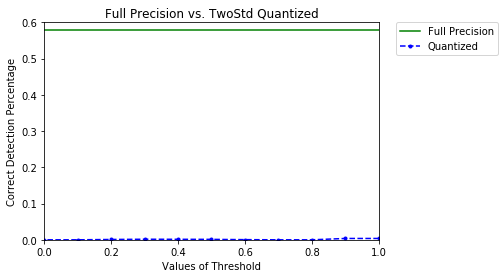

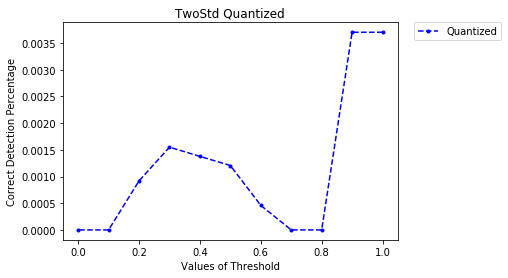

[0.003703932341502562, 0.003703932341502562, 0.0, 0.0, 0.0004597172738765659, 0.0012067578439259854, 0.0013782014471115194, 0.0015507437826661305, 0.0009189592786169663, 0.0, 0.0]


In [20]:
plot_percents("Full Precision vs. TwoStd Quantized", std2_thresholds, std2_percents, True)
plot_percents("TwoStd Quantized", std2_thresholds, std2_percents, False)
print(std2_percents)

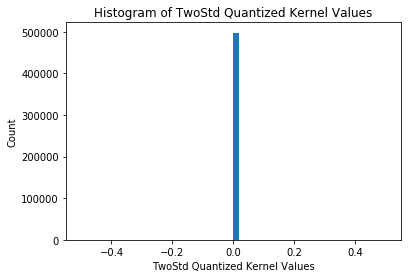

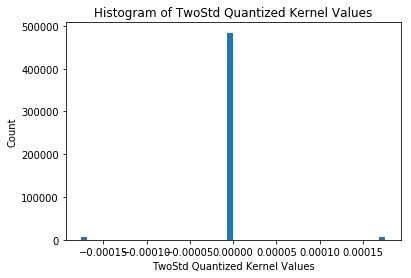

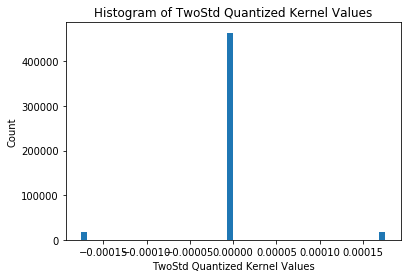

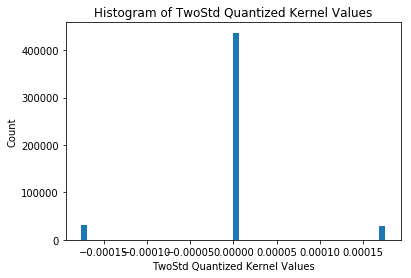

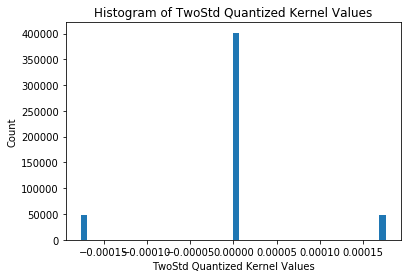

...

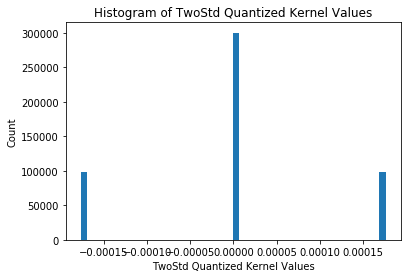

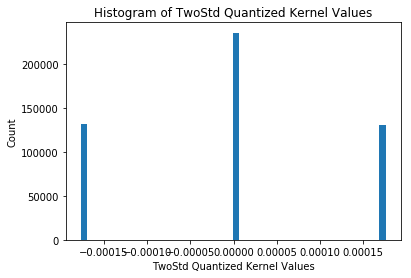

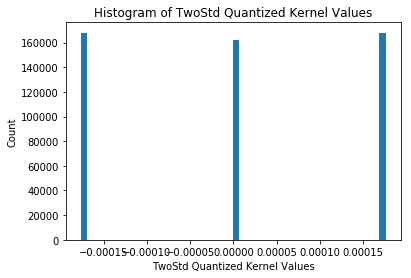

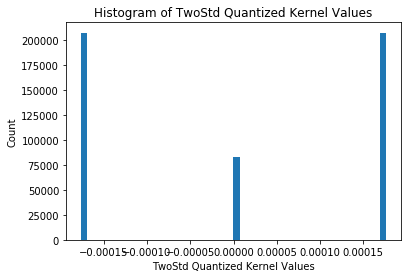

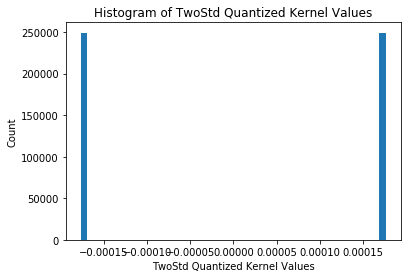

In [21]:
for i in range(num_points):
  plot_histogram(std2_tensors[i][2], "Histogram of TwoStd Quantized Kernel Values", "TwoStd Quantized Kernel Values", 50)